<a href="https://colab.research.google.com/github/BrainConnection/Quantum_Algorithm/blob/main/5.%205Q%20TFIM%20VQNHE%20CNN%20QEM%20ZZ%20Crosstalk%200%201%202%203%204.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Environment Setting

In [ ]:
!pip install qiskit
!pip install qiskit-ibm-runtime
!pip install qiskit[visualization]
!pip install qiskit-algorithms
!pip install qiskit-aer

!pip install scipy
!pip install matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 29.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.4/39.4 MB 42.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.0/318.0 kB 23.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 8.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   

In [ ]:
from functools import cache

from qiskit_ibm_runtime import QiskitRuntimeService, Estimator, Options

# Save an IBM Quantum account and set it as your default account.
QiskitRuntimeService.save_account(channel="ibm_quantum",
                                  token="067e5c82606f0a1157dd554e2087d6b7a9b823dbaa4ad47b95c3337eab2e6cd9361719cc0470f4a98d1631b73b264a82577012a0b8ff32963d5964e6cc12c525",
                                  set_as_default=True,
                                  overwrite=True)

service = QiskitRuntimeService()
backend = service.backend("ibmq_qasm_simulator")

# Hamiltonian Diagonalization

$$ H = Σ Z_j Z_{j+1} - Σ X_j  $$

1D 5 Qubit System

In [ ]:
from qiskit.quantum_info import SparsePauliOp
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)
hamiltonian_matrix = hamiltonian.to_matrix()

eigenvalue, eigenvector = np.linalg.eig(hamiltonian_matrix)

lowest_energy = np.min(eigenvalue)

np.real(lowest_energy)

-6.026674183332294

# 6. CNN Estimation - ZZ Crosstalk (CUSCO 0 1 2 3 4)

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 1MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 1MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.001                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01501694 4.95598306]
[9.72260195 9.9710135  9.60424455]
1.350452146908765e-05
[4.95600671 4.80699329]
[9.6042374  9.76301695 9.30361565]
1.6950613608734955e-05
[4.80699765 5.23200235]
[ 9.30361728 10.03898623 10.16028649]
-1.3770519234235223e-05
[5.23201064 5.13798936]
[10.16026046 10.37001454  9.97059499]
1.4542737942768724e-05


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(6.752260734543825e-06,
 8.475306804367477e-06,
 -6.885259617117612e-06,
 7.271368971384362e-06)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

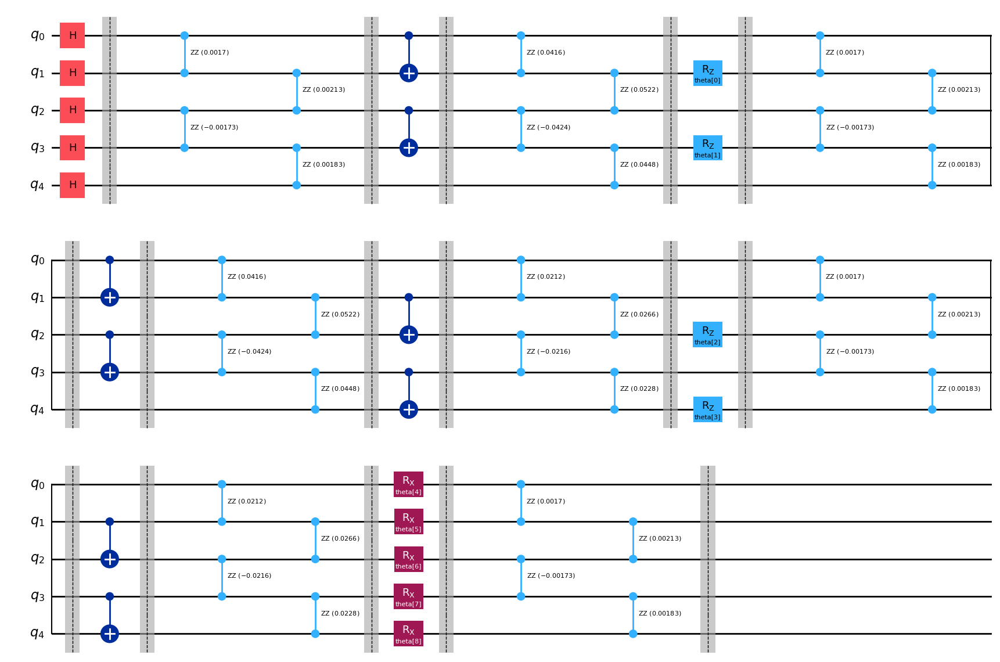

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

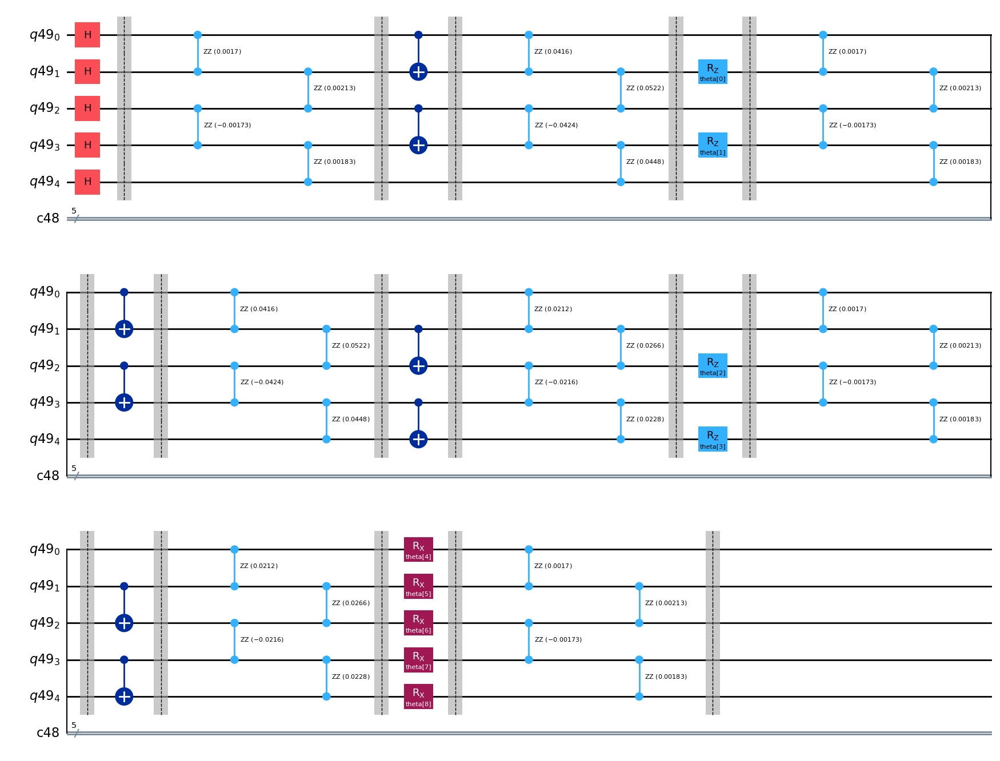

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

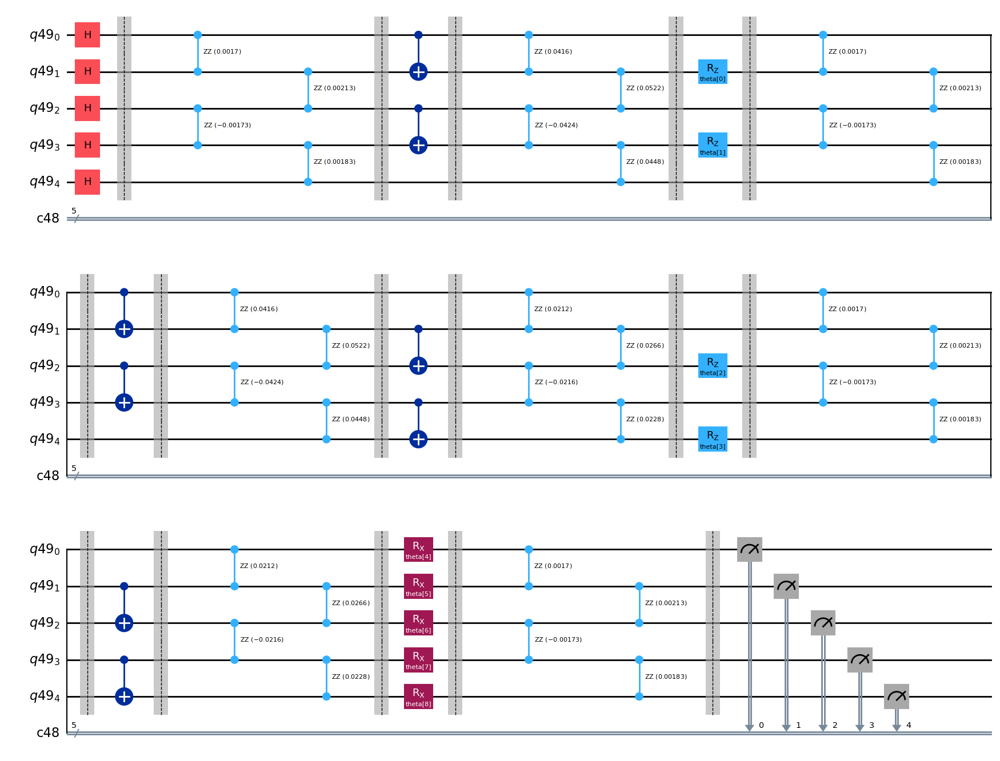

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

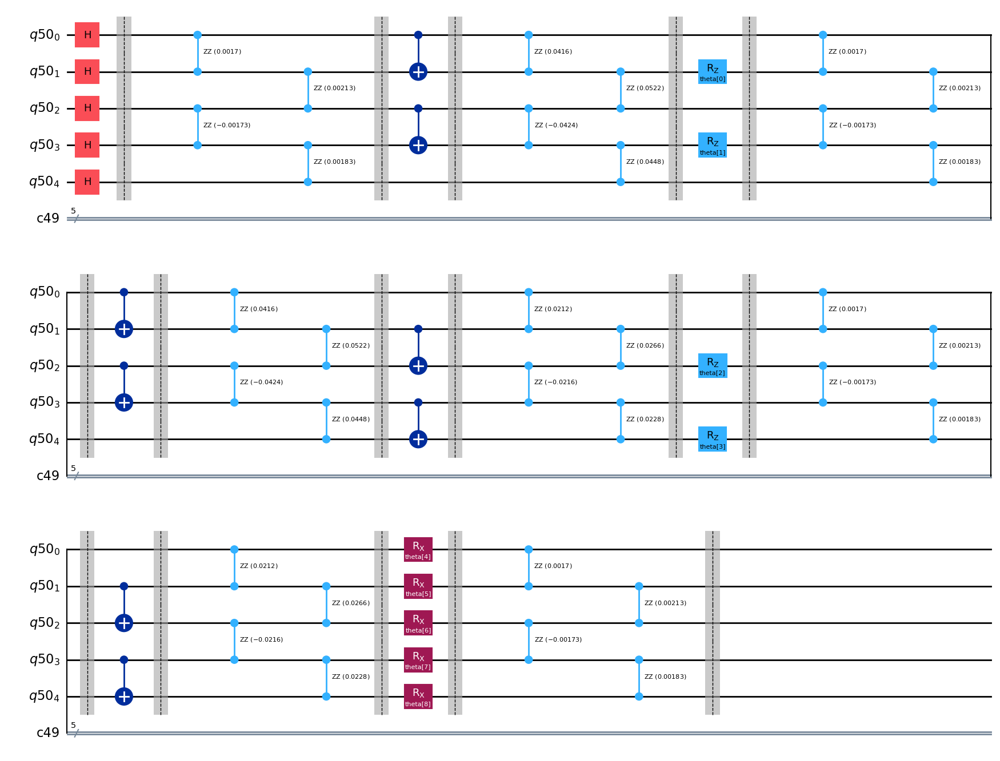

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

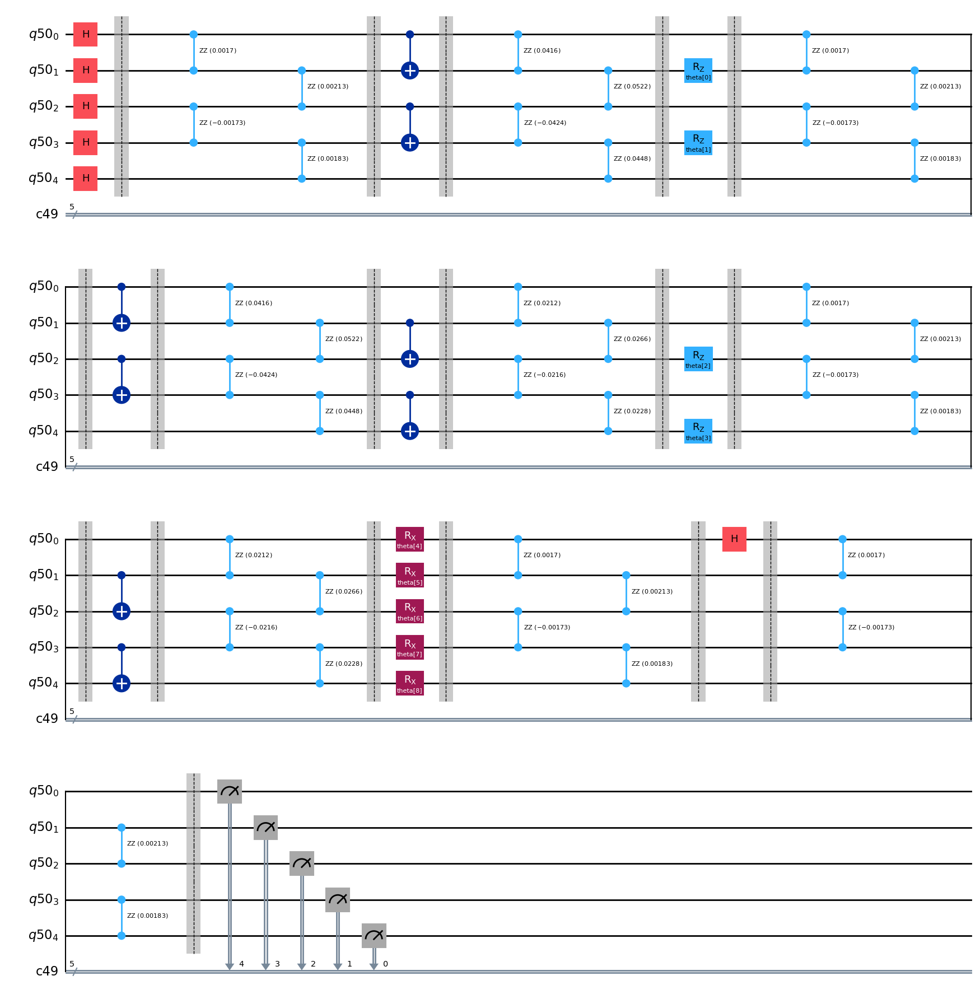

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

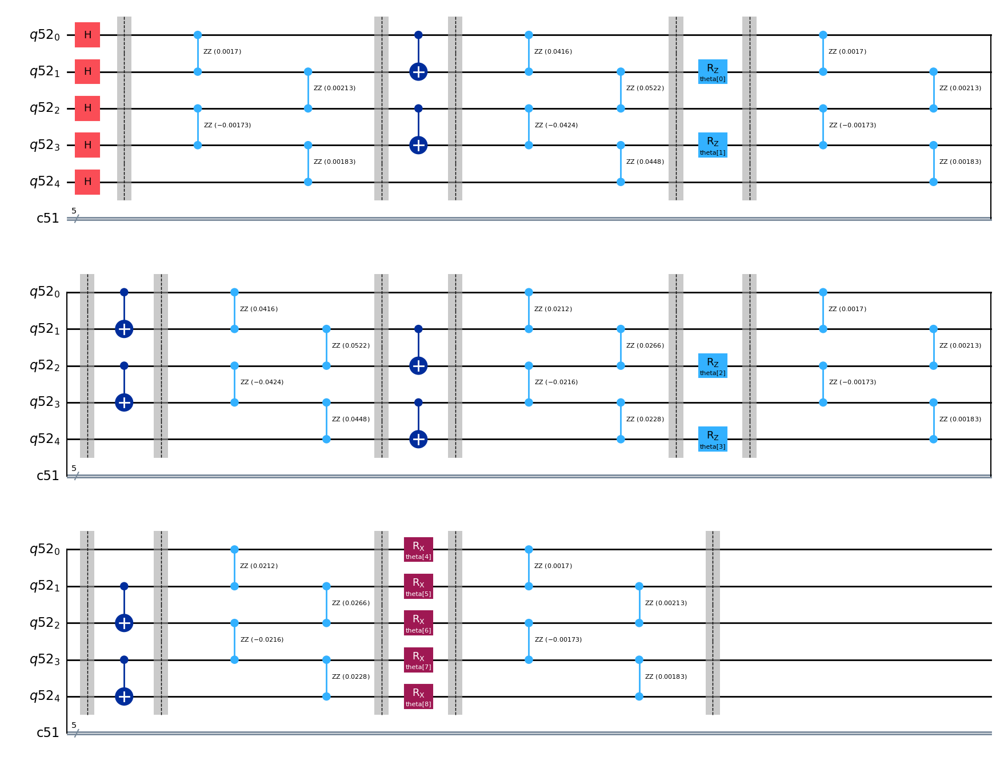

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

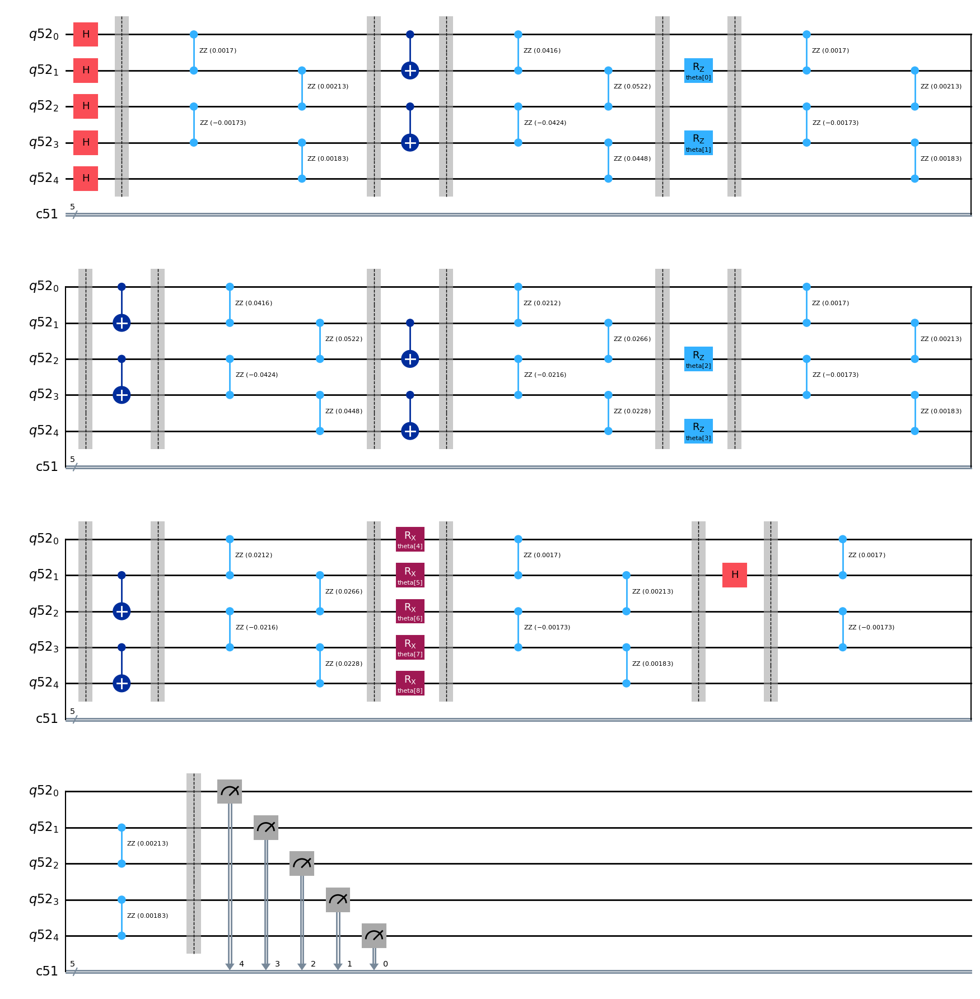

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

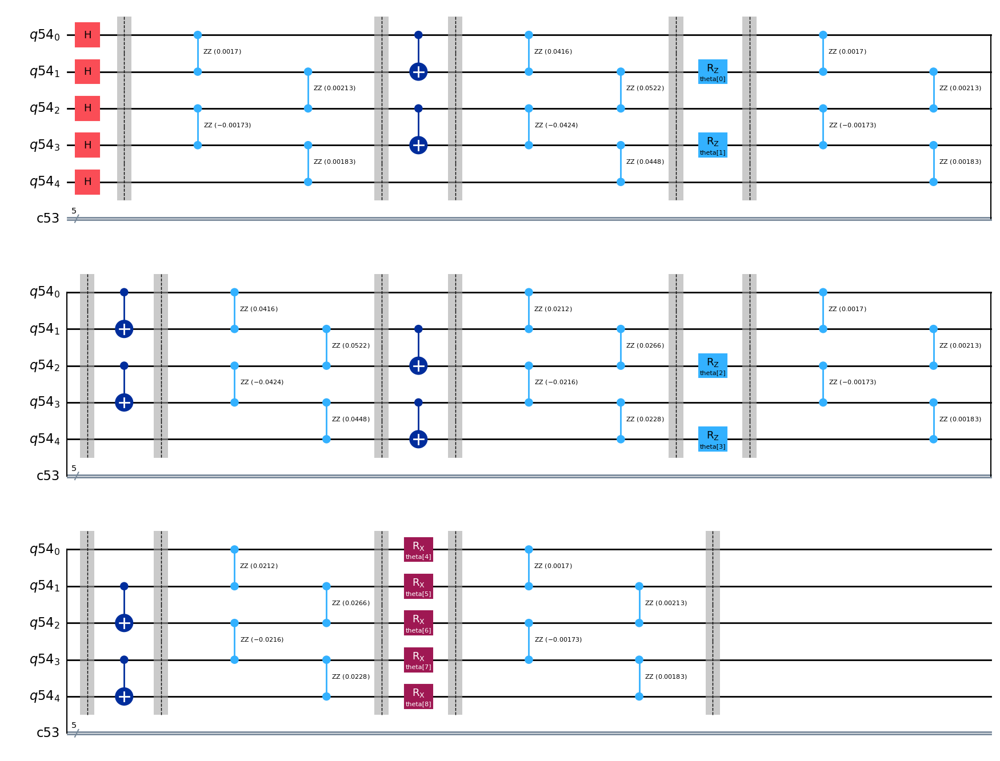

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

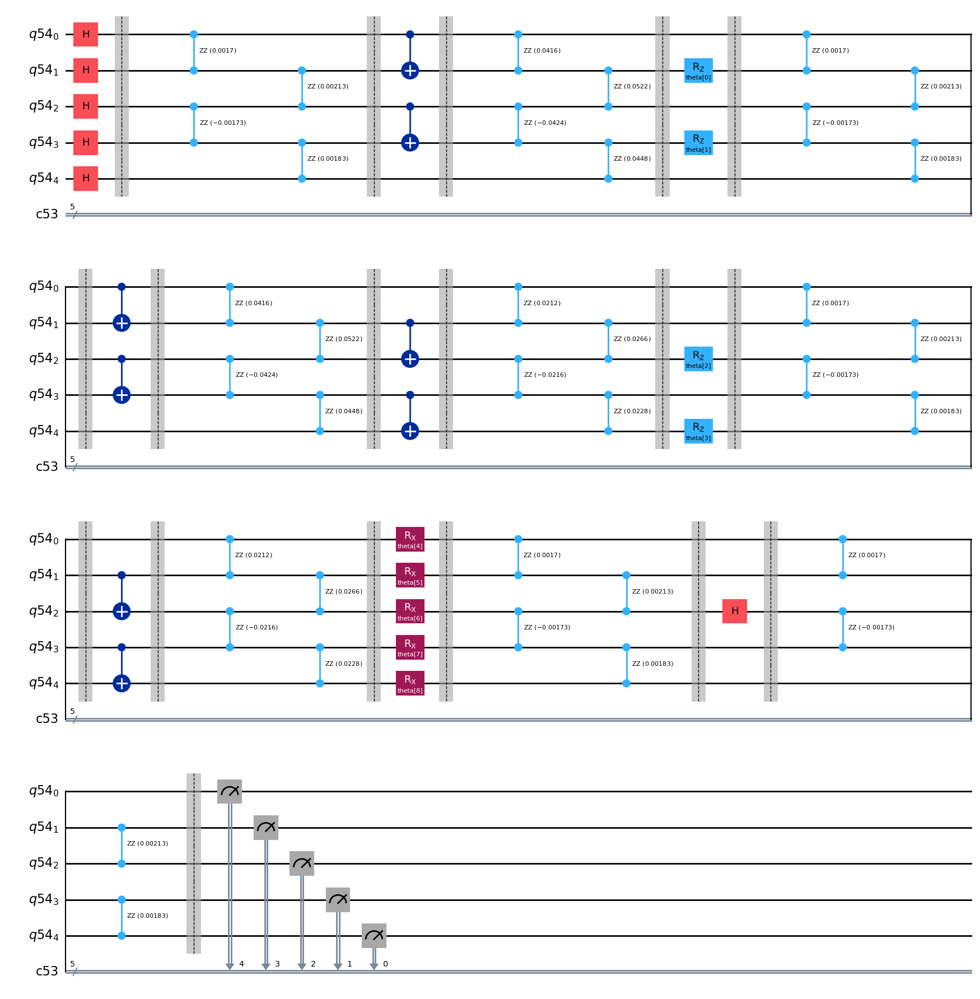

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

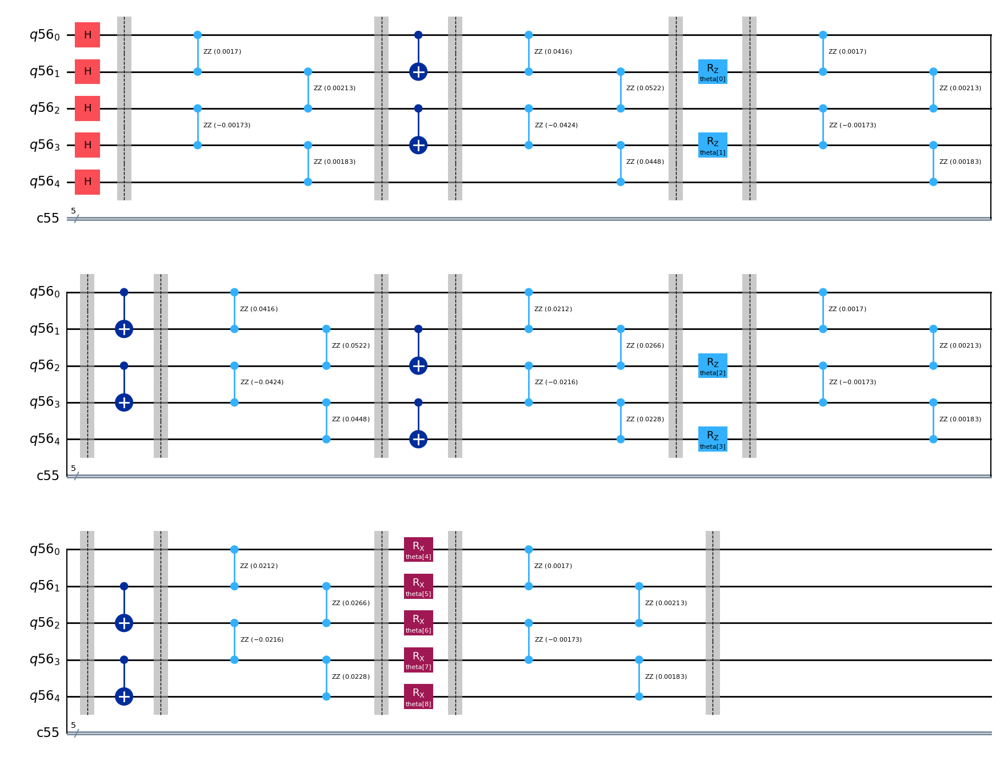

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

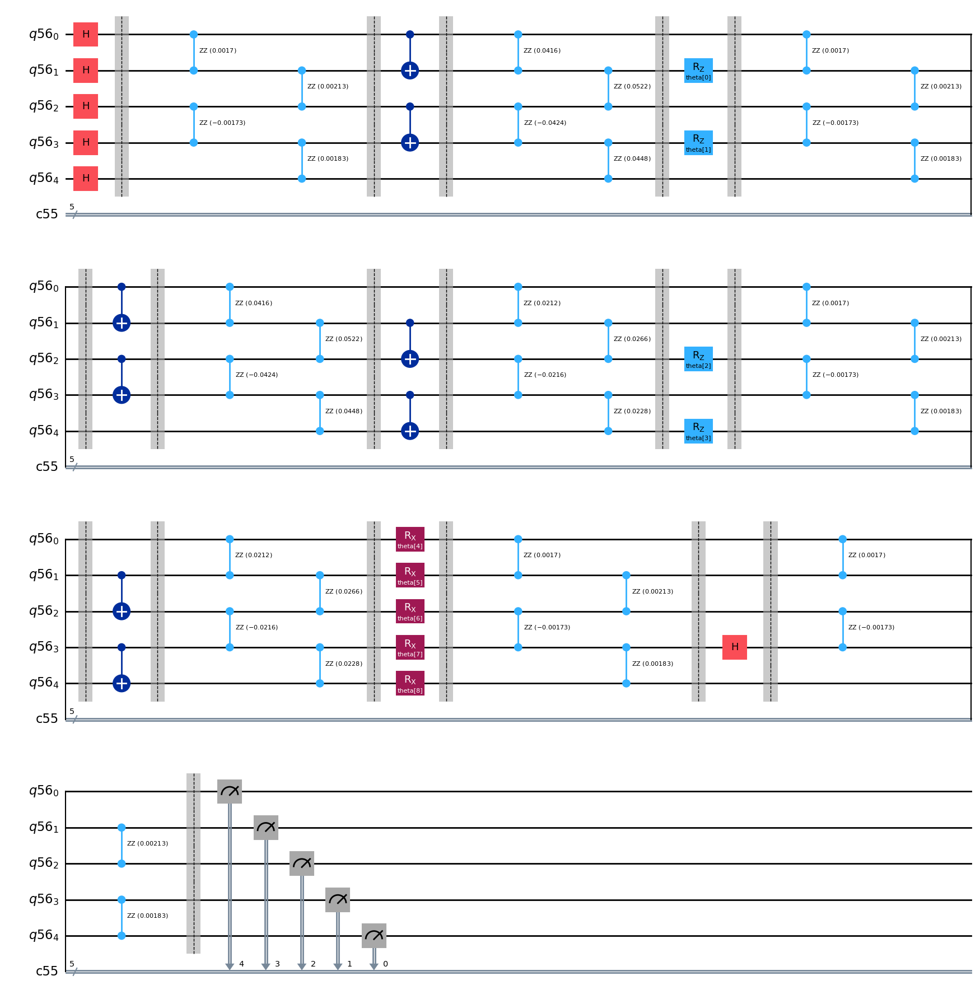

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

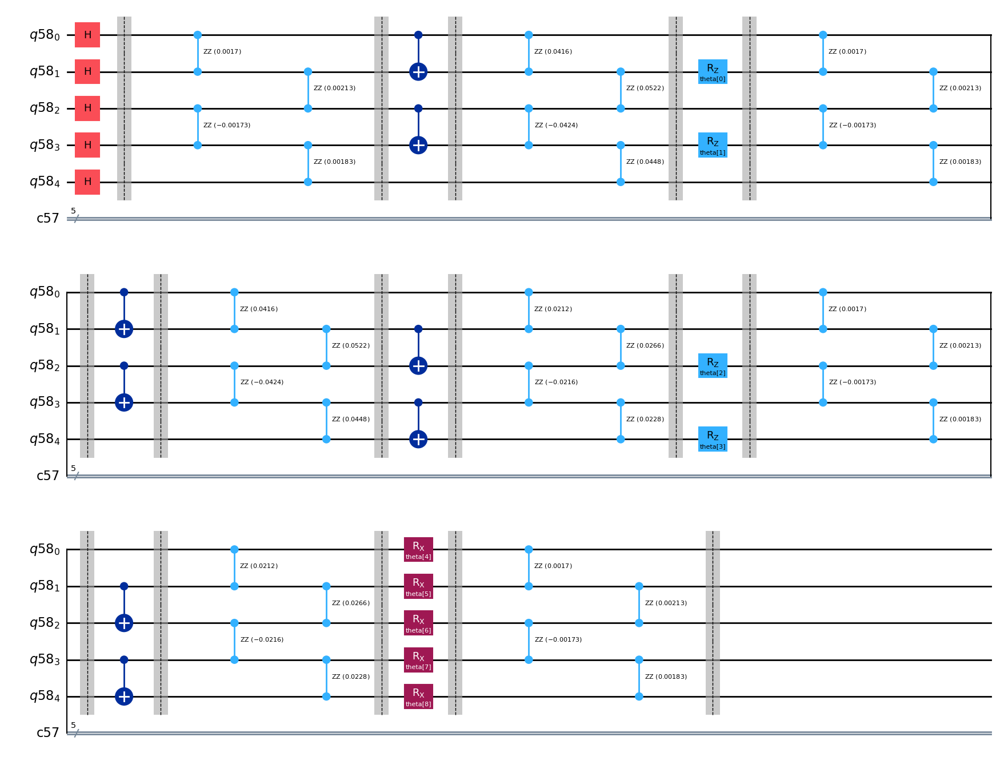

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

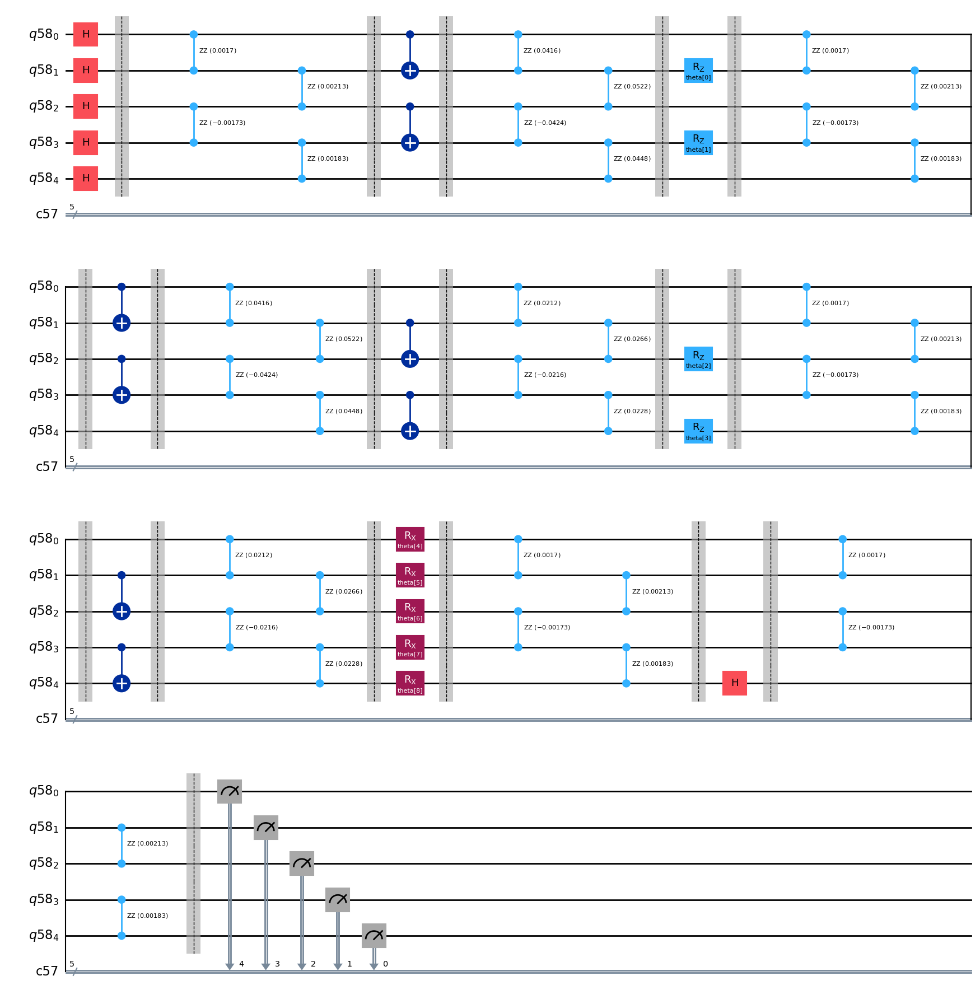

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444


In [ ]:
lowest_energy_vqe

-5.845200000000001

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 62
         Function evaluations: 581
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: -5.880680
         Iterations: 59
         Function evaluations: 553
         Gradient evaluations: 79
Optimization terminated successfully.
         Current function value: -5.896482
         Iterations: 46
         Function evaluations: 385
         Gradient evaluations: 55


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.875120
         Iterations: 34
         Function evaluations: 523
         Gradient evaluations: 73
Optimization terminated successfully.
         Current function value: -5.896483
         Iterations: 59
         Function evaluations: 469
         Gradient evaluations: 67
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 62
         Function evaluations: 567
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: -5.896483
         Iterations: 59
         Function evaluations: 462
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 53
         Function evaluations: 378
         Gradient evaluations: 54
Optimization terminated successfully.
         Current function value: -5.880679
         Iterations: 49
         Function evaluations: 371
         Gradient evaluation

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.896483
         Iterations: 55
         Function evaluations: 642
         Gradient evaluations: 90
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 44
         Function evaluations: 315
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.876177
         Iterations: 41
         Function evaluations: 308
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: -5.876735
         Iterations: 48
         Function evaluations: 413
         Gradient evaluations: 59


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.896483
         Iterations: 47
         Function evaluations: 448
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -5.876735
         Iterations: 55
         Function evaluations: 483
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -5.896482
         Iterations: 50
         Function evaluations: 357
         Gradient evaluations: 51
Optimization terminated successfully.
         Current function value: -5.880680
         Iterations: 80
         Function evaluations: 763
         Gradient evaluations: 109
Optimization terminated successfully.
         Current function value: -5.901518
         Iterations: 48
         Function evaluations: 399
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: -5.896483
         Iterations: 58
         Function evaluations: 469
         Gradient evaluatio

In [ ]:
lowest_energy_vqnhe

-5.901517554285383

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.976303
         Iterations: 300
         Function evaluations: 15972
         Gradient evaluations: 499
Optimization terminated successfully.
         Current function value: -5.911988
         Iterations: 67
         Function evaluations: 5056
         Gradient evaluations: 158


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.976571
         Iterations: 280
         Function evaluations: 13152
         Gradient evaluations: 411


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.980095
         Iterations: 165
         Function evaluations: 8712
         Gradient evaluations: 272


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.970504
         Iterations: 300
         Function evaluations: 14112
         Gradient evaluations: 441


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.974313
         Iterations: 265
         Function evaluations: 10848
         Gradient evaluations: 339


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.936453
         Iterations: 39
         Function evaluations: 3564
         Gradient evaluations: 111


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.894618
         Iterations: 163
         Function evaluations: 8868
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982876
         Iterations: 127
         Function evaluations: 6312
         Gradient evaluations: 197


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.984667
         Iterations: 172
         Function evaluations: 7148
         Gradient evaluations: 223


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.977694
         Iterations: 300
         Function evaluations: 12960
         Gradient evaluations: 405
         Current function value: -5.980826
         Iterations: 300
         Function evaluations: 14176
         Gradient evaluations: 443


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982276
         Iterations: 293
         Function evaluations: 16395
         Gradient evaluations: 512


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.982975
         Iterations: 285
         Function evaluations: 14240
         Gradient evaluations: 445


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.977910
         Iterations: 216
         Function evaluations: 10631
         Gradient evaluations: 332


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.972353
         Iterations: 240
         Function evaluations: 13996
         Gradient evaluations: 437


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.965875
         Iterations: 127
         Function evaluations: 9228
         Gradient evaluations: 288
Optimization terminated successfully.
         Current function value: -5.970277
         Iterations: 80
         Function evaluations: 2784
         Gradient evaluations: 87
Optimization terminated successfully.
         Current function value: -5.928529
         Iterations: 126
         Function evaluations: 5024
         Gradient evaluations: 157
         Current function value: -5.983582
         Iterations: 182
         Function evaluations: 9356
         Gradient evaluations: 292


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.9846666278144145

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.980008
         Iterations: 243
         Function evaluations: 22071
         Gradient evaluations: 387


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.928758
         Iterations: 103
         Function evaluations: 15630
         Gradient evaluations: 274


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975175
         Iterations: 126
         Function evaluations: 16941
         Gradient evaluations: 297


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987480
         Iterations: 266
         Function evaluations: 21441
         Gradient evaluations: 376


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.984862
         Iterations: 96
         Function evaluations: 9239
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.972381
         Iterations: 197
         Function evaluations: 17680
         Gradient evaluations: 310


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.935740
         Iterations: 300
         Function evaluations: 24396
         Gradient evaluations: 428
Optimization terminated successfully.
         Current function value: -5.928548
         Iterations: 91
         Function evaluations: 6327
         Gradient evaluations: 111
         Current function value: -5.987576
         Iterations: 300
         Function evaluations: 19893
         Gradient evaluations: 349


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.987158
         Iterations: 170
         Function evaluations: 13065
         Gradient evaluations: 229


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.986343
         Iterations: 300
         Function evaluations: 20292
         Gradient evaluations: 356


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.985536
         Iterations: 286
         Function evaluations: 22641
         Gradient evaluations: 397


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.986695
         Iterations: 300
         Function evaluations: 18981
         Gradient evaluations: 333
         Current function value: -5.987182
         Iterations: 300
         Function evaluations: 19209
         Gradient evaluations: 337


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.984727
         Iterations: 273
         Function evaluations: 23544
         Gradient evaluations: 413


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975406
         Iterations: 190
         Function evaluations: 15171
         Gradient evaluations: 266


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.946885
         Iterations: 114
         Function evaluations: 12095
         Gradient evaluations: 212


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.973535
         Iterations: 238
         Function evaluations: 21719
         Gradient evaluations: 381


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.947118
         Iterations: 147
         Function evaluations: 16598
         Gradient evaluations: 291
         Current function value: -5.962497
         Iterations: 142
         Function evaluations: 16307
         Gradient evaluations: 286


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.987575817412827

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444
Optimization terminated successfully.
         Current function value: -5.925754
         Iterations: 106
         Function evaluations: 3406
         Gradient evaluations: 131
Optimization terminated successfully.
         Current function value: -5.902535
         Iterations: 44
         Function evaluations: 1352
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -5.921647
         Iterations: 145
         Function evaluations: 5382
         Gradient evaluations: 207
Optimization terminated successfully.
         Current function value: -5.871843
         Iterations: 129
         Function evaluations: 4082
         Gradient evaluations: 157
O

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.922517
         Iterations: 151
         Function evaluations: 5070
         Gradient evaluations: 195
Optimization terminated successfully.
         Current function value: -5.912486
         Iterations: 47
         Function evaluations: 1612
         Gradient evaluations: 62
Optimization terminated successfully.
         Current function value: -5.925005
         Iterations: 104
         Function evaluations: 3484
         Gradient evaluations: 134
Optimization terminated successfully.
         Current function value: -5.872173
         Iterations: 26
         Function evaluations: 884
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: -5.909092
         Iterations: 73
         Function evaluations: 2236
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: -5.870877
         Iterations: 22
         Function evaluations: 2158
         Gradient e

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.912580
         Iterations: 84
         Function evaluations: 5180
         Gradient evaluations: 199
Optimization terminated successfully.
         Current function value: -5.909356
         Iterations: 66
         Function evaluations: 2106
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: -5.870946
         Iterations: 23
         Function evaluations: 624
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: -5.912390
         Iterations: 42
         Function evaluations: 1300
         Gradient evaluations: 50
Optimization terminated successfully.
         Current function value: -5.912486
         Iterations: 61
         Function evaluations: 3120
         Gradient evaluations: 120
         Current function value: -5.906051
         Iterations: 26
         Function evaluations: 3184
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.925754068740818

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.4820000000000007
-5.6522000000000014
-3.4322
-3.462000000000001
-5.788
-5.6958
-5.6404
-5.845200000000001
-5.741200000000001
-3.564200000000001
-5.6898
-5.727400000000001
-5.755199999999999
-5.8244
-5.816999999999999
-5.808400000000001
-3.5519999999999996
-5.764000000000002
-5.795
-5.7444
Optimization terminated successfully.
         Current function value: -5.926152
         Iterations: 64
         Function evaluations: 4180
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: -5.902535
         Iterations: 32
         Function evaluations: 2255
         Gradient evaluations: 41
Optimization terminated successfully.
         Current function value: -5.909070
         Iterations: 119
         Function evaluations: 7700
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.871763
         Iterations: 32
         Function evaluations: 7927
         Gradient evaluations: 144


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.925987
         Iterations: 58
         Function evaluations: 8204
         Gradient evaluations: 149
Optimization terminated successfully.
         Current function value: -5.904981
         Iterations: 36
         Function evaluations: 2420
         Gradient evaluations: 44


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.909620
         Iterations: 61
         Function evaluations: 7162
         Gradient evaluations: 130
Optimization terminated successfully.
         Current function value: -5.908811
         Iterations: 45
         Function evaluations: 2860
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -5.845200
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.926158
         Iterations: 54
         Function evaluations: 7876
         Gradient evaluations: 143
Optimization terminated successfully.
         Current function value: -5.926552
         Iterations: 154
         Function evaluations: 12430
         Gradient evaluations: 226
Optimization terminated successfully.
         Current function value: -5.871404
         Iterations: 14
         Function evaluations: 990
         Gradient evaluations: 18


<ipython-input-210-2b9e55220a65>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-213-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-210-2b9e55220a65>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-213-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-213-942dbc8389c9>:26: RuntimeWarning: invalid value encounte

         Current function value: nan
         Iterations: 46
         Function evaluations: 9075
         Gradient evaluations: 165


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.870875
         Iterations: 12
         Function evaluations: 4956
         Gradient evaluations: 90


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.882454
         Iterations: 61
         Function evaluations: 6720
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.905783
         Iterations: 123
         Function evaluations: 13695
         Gradient evaluations: 249


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.871576
         Iterations: 35
         Function evaluations: 5289
         Gradient evaluations: 96
Optimization terminated successfully.
         Current function value: -5.917310
         Iterations: 34
         Function evaluations: 2475
         Gradient evaluations: 45
Optimization terminated successfully.
         Current function value: -5.912486
         Iterations: 37
         Function evaluations: 2365
         Gradient evaluations: 43
         Current function value: -5.871252
         Iterations: 18
         Function evaluations: 4739
         Gradient evaluations: 86


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.926552189008736

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 2MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 2MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.002                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01506772 4.95593228]
[9.72257781 9.97105401 9.60422818]
5.401042639086029e-05
[4.95602684 4.80697316]
[9.60419963 9.76306778 9.30360258]
6.778439960886118e-05
[4.80699059 5.23200941]
[ 9.30360912 10.03894494 10.16033594]
-5.505901867675078e-05
[5.23204253 5.13795747]
[10.16023187 10.37005816  9.97057997]
5.816083447474085e-05


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(2.7005213195430144e-05,
 3.389219980443059e-05,
 -2.752950933837539e-05,
 2.9080417237370426e-05)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

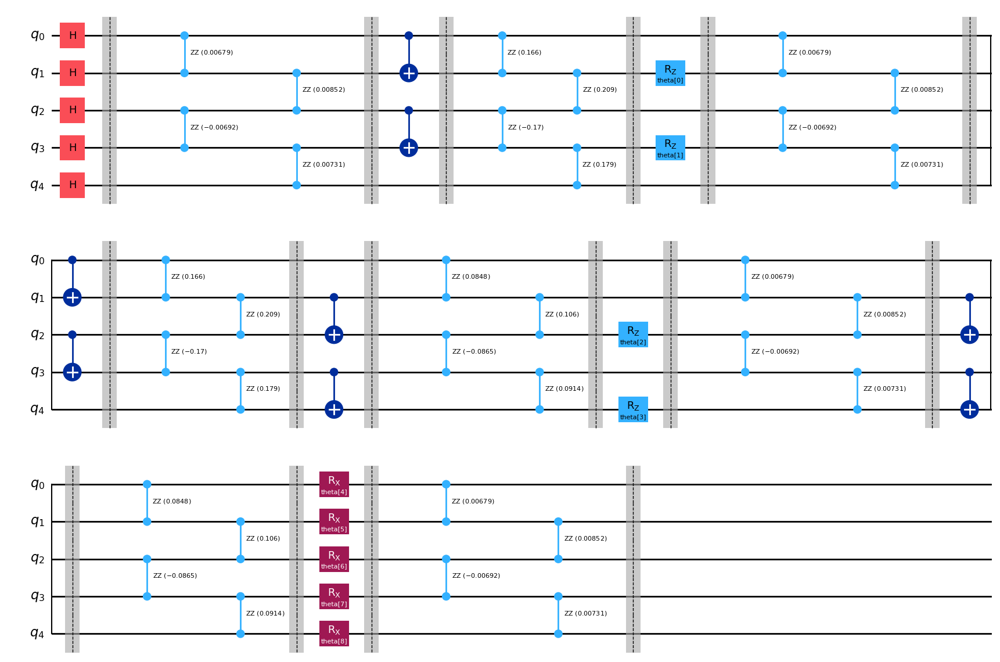

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

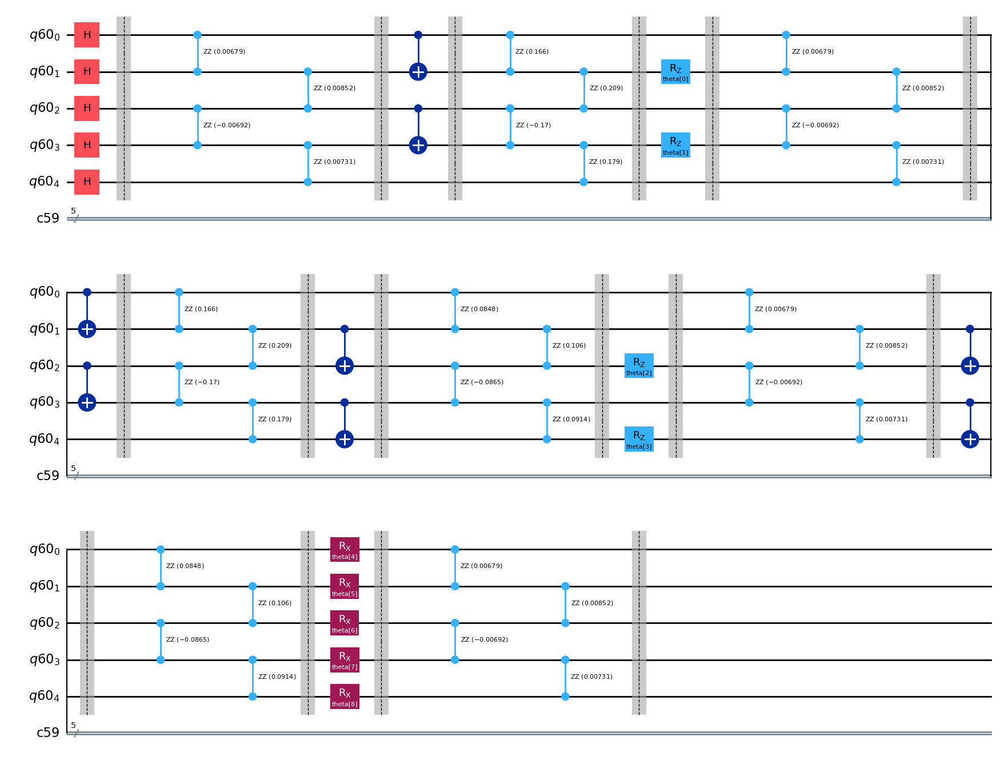

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

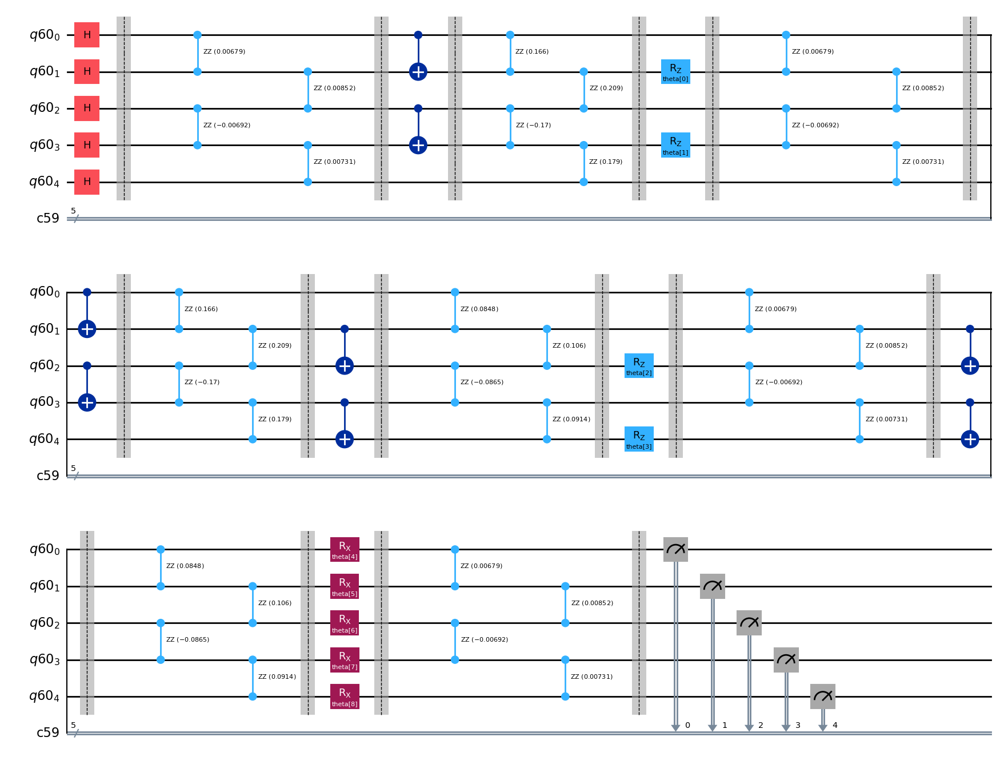

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

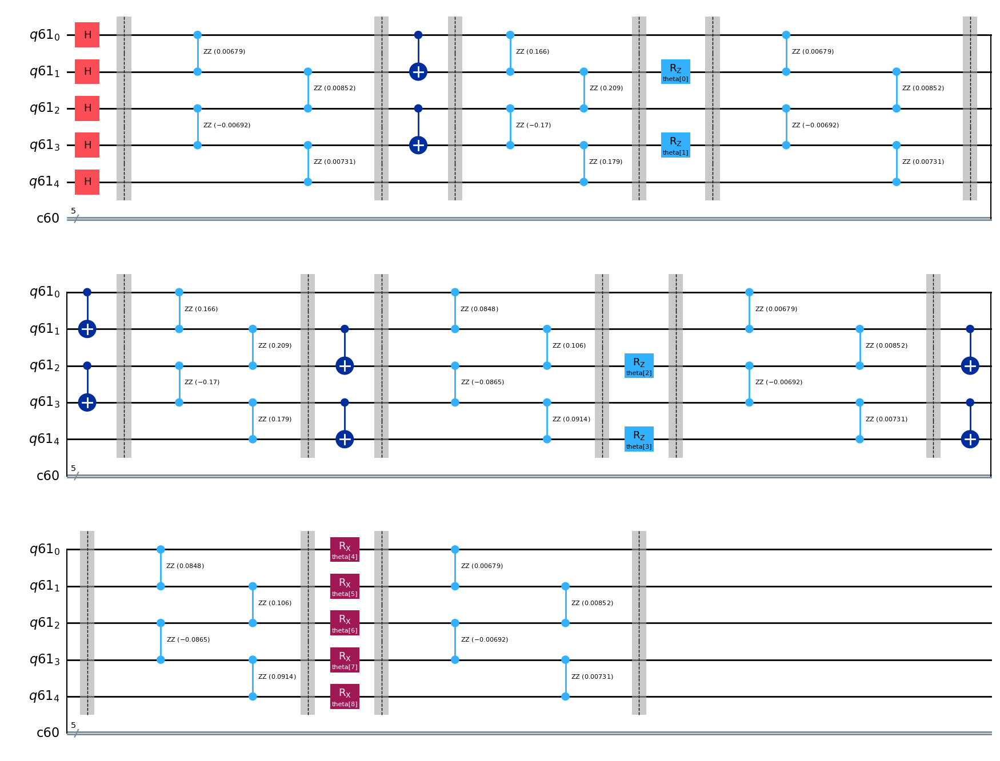

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

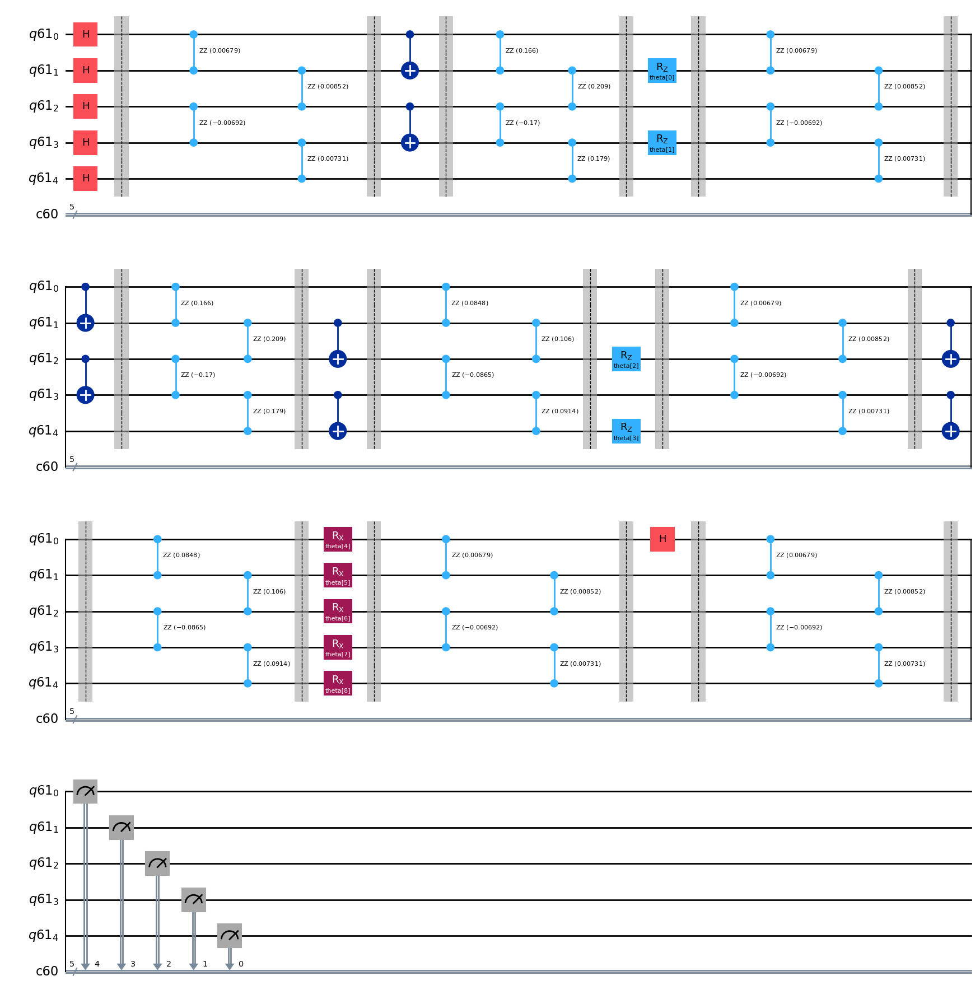

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

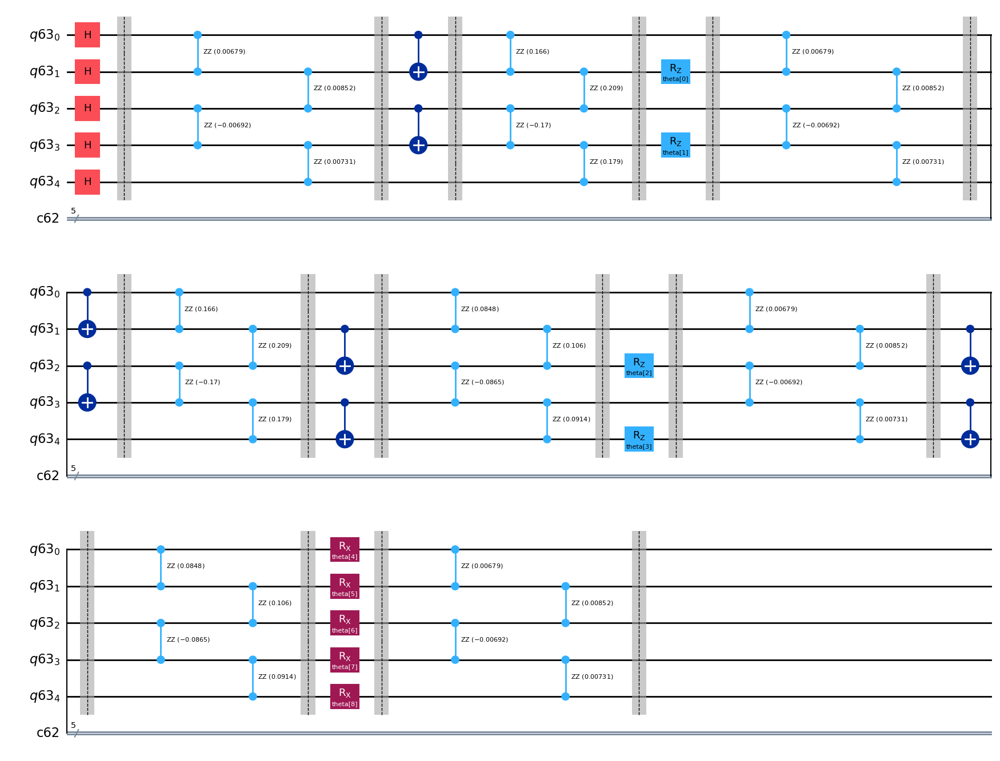

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

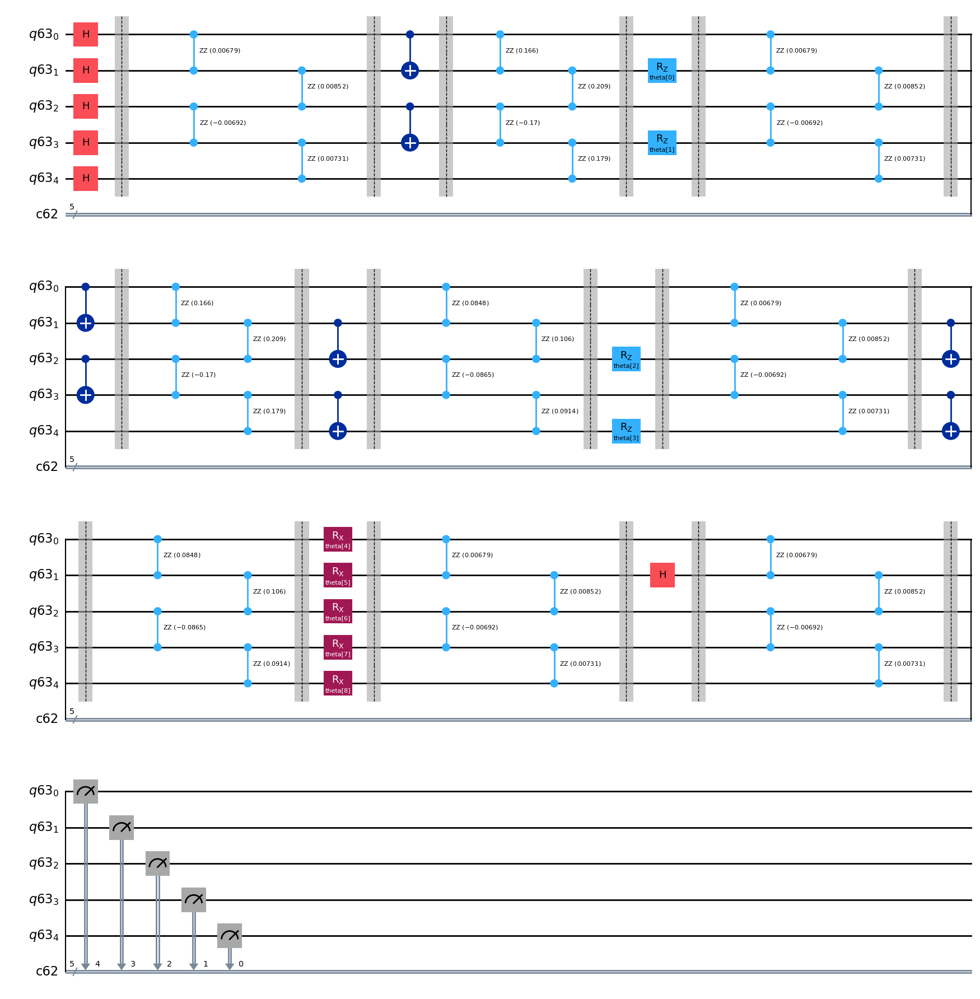

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

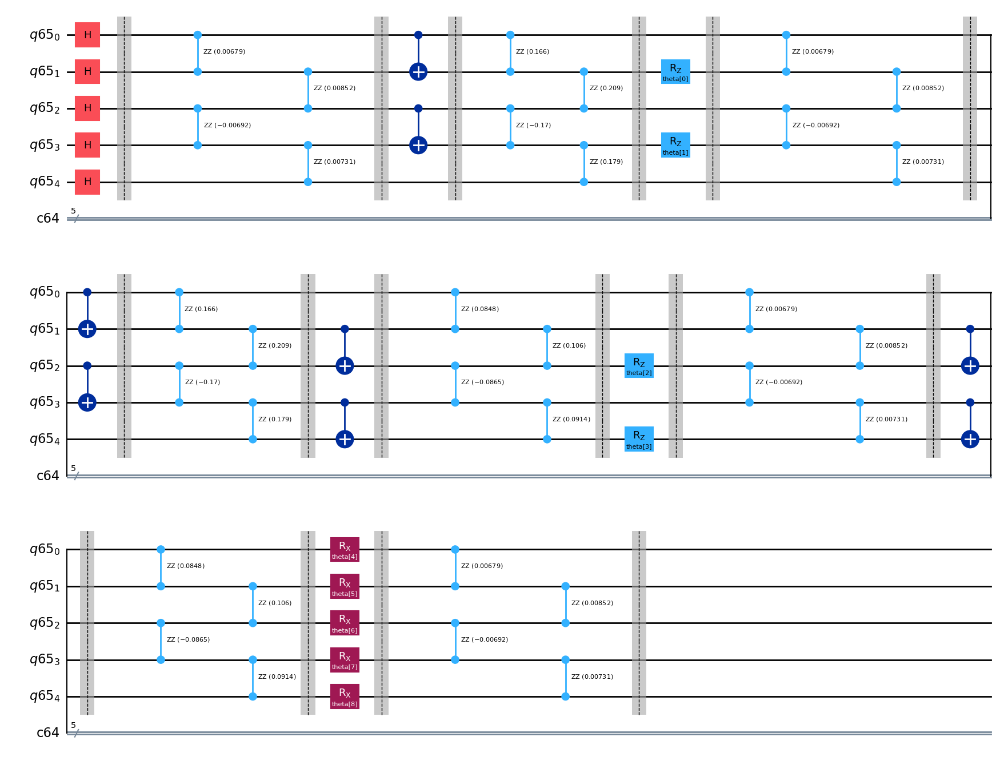

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

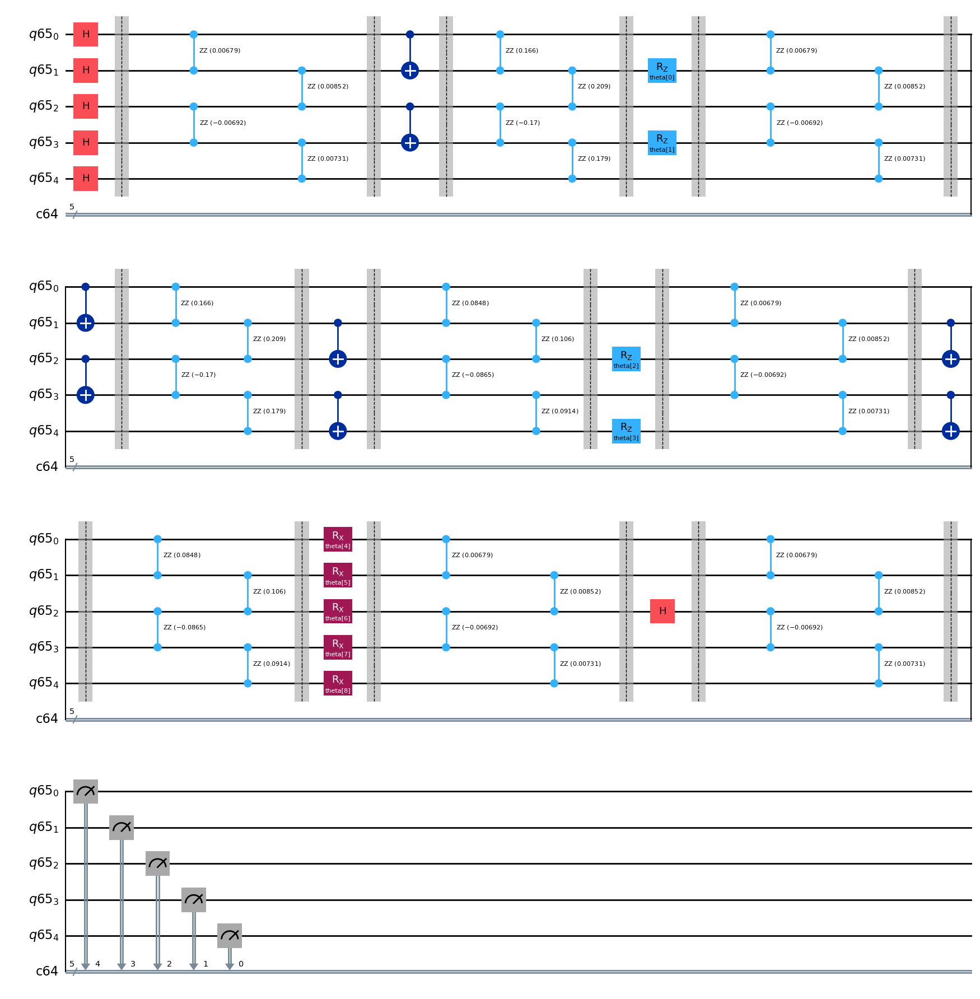

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

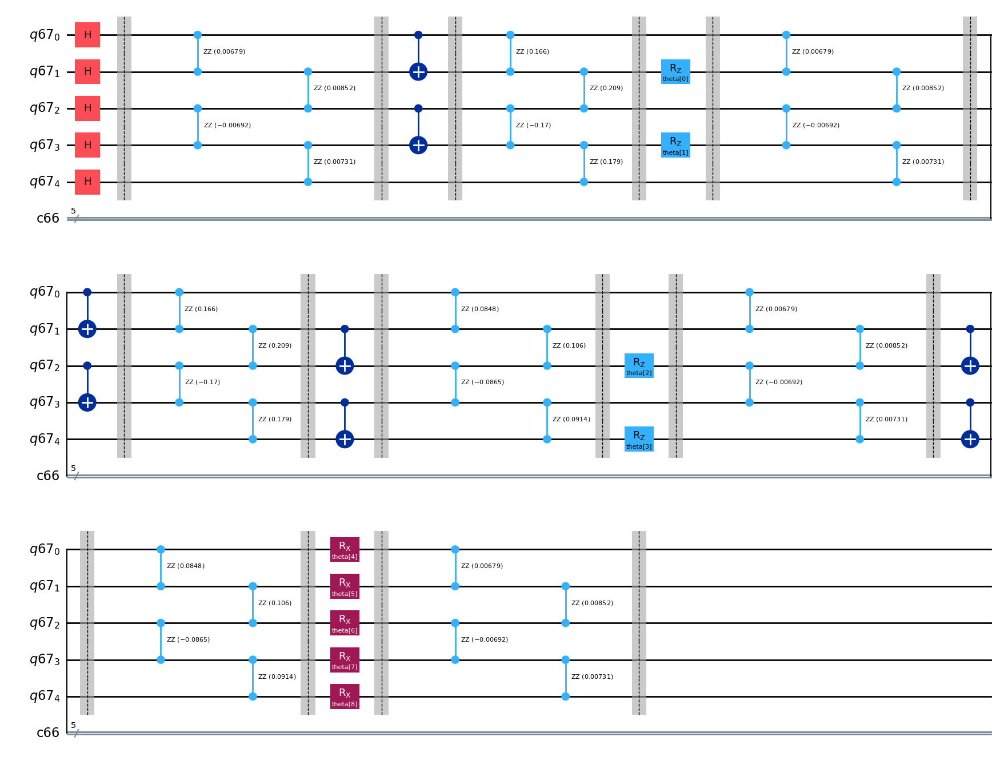

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

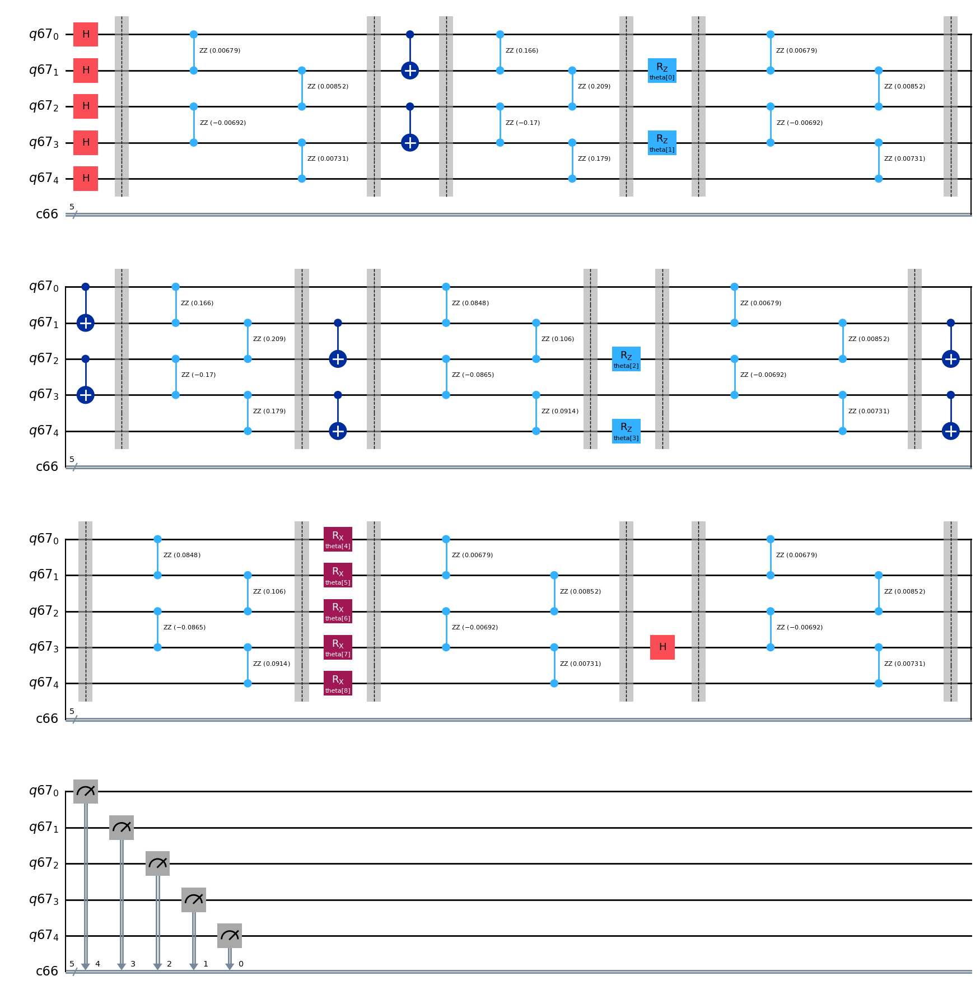

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

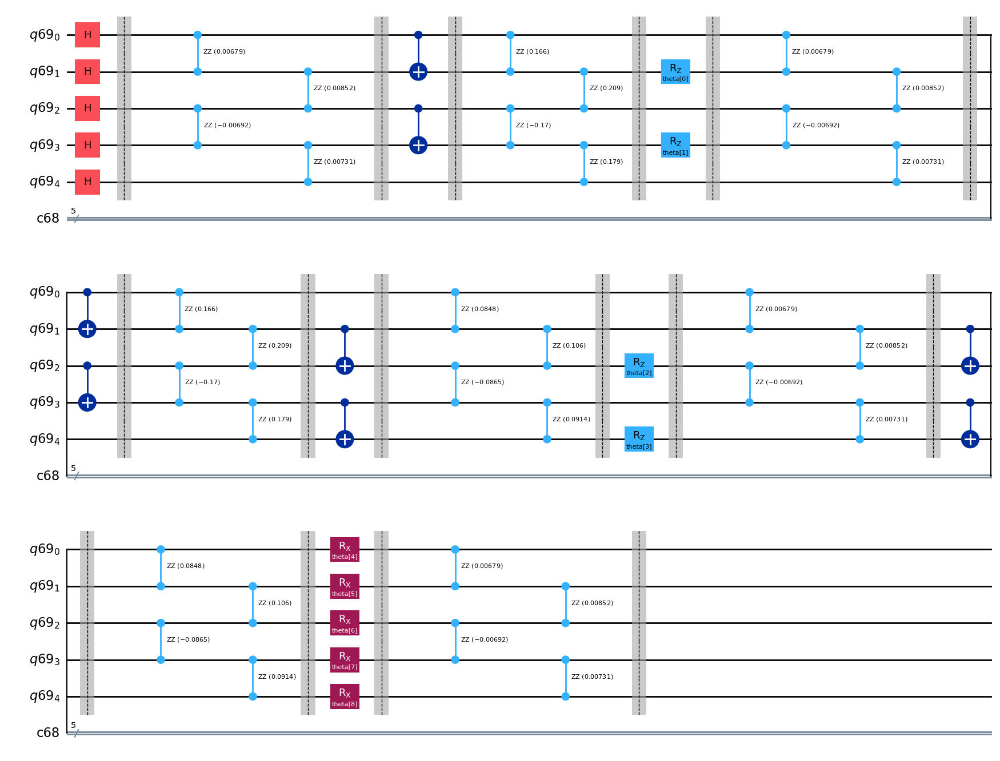

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

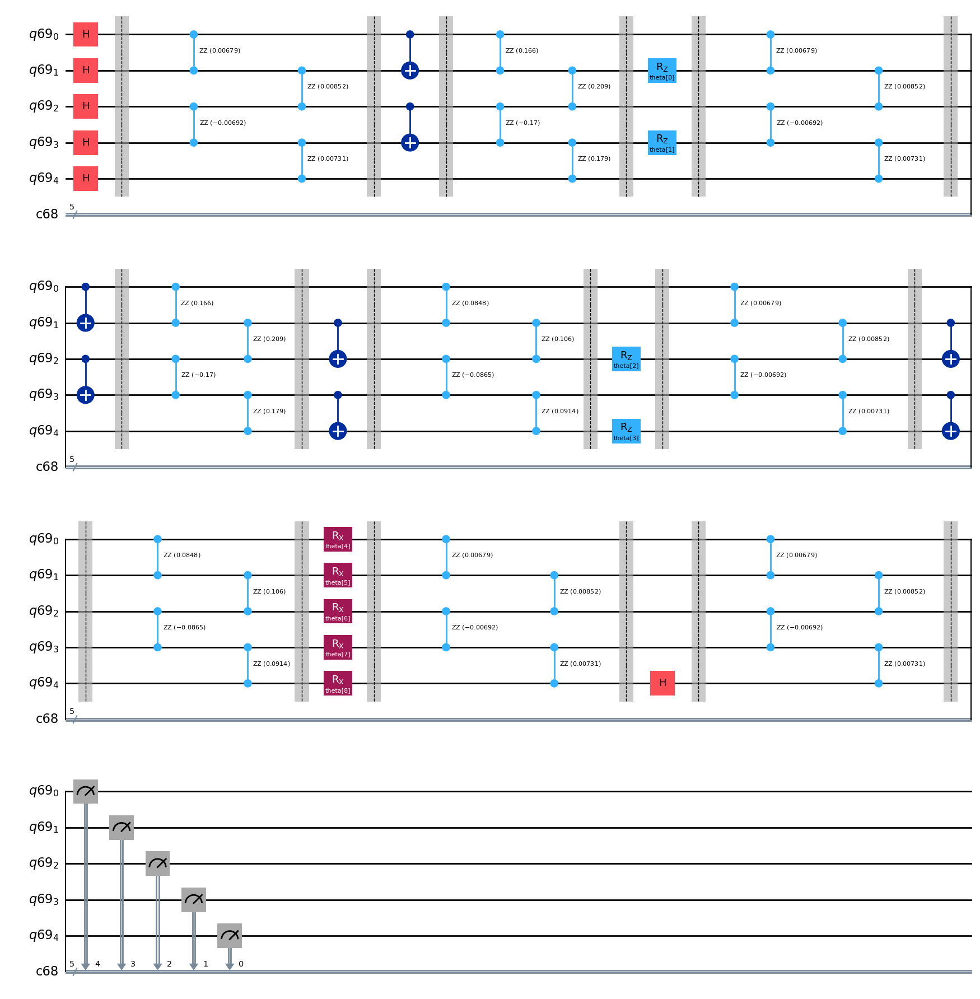

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-5.5550000000000015
-5.4954
-3.466400000000001
-3.3184000000000005
-5.6312
-5.669200000000001
-5.5632
-5.634200000000001
-5.657800000000001
-3.2317999999999993
-5.5686
-5.558599999999999
-3.3078
-5.671799999999999
-5.6575999999999995
-5.705799999999998
-3.333600000000001
-2.946600000000001
-2.9754
-5.541000000000001


In [ ]:
lowest_energy_vqe

-5.705799999999998

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.5550000000000015
-5.4954
-3.466400000000001
-3.3184000000000005
-5.6312
-5.669200000000001
-5.5632
-5.634200000000001
-5.657800000000001
-3.2317999999999993
-5.5686
-5.558599999999999
-3.3078
-5.671799999999999
-5.6575999999999995
-5.705799999999998
-3.333600000000001
-2.946600000000001
-2.9754
-5.541000000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 212
         Function evaluations: 1974
         Gradient evaluations: 282


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 237
         Function evaluations: 2240
         Gradient evaluations: 320
Optimization terminated successfully.
         Current function value: -5.975995
         Iterations: 162
         Function evaluations: 1540
         Gradient evaluations: 220


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 207
         Function evaluations: 2294
         Gradient evaluations: 326
Optimization terminated successfully.
         Current function value: -5.975998
         Iterations: 269
         Function evaluations: 2688
         Gradient evaluations: 384


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 191
         Function evaluations: 1792
         Gradient evaluations: 256


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 232
         Function evaluations: 2240
         Gradient evaluations: 320


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975996
         Iterations: 169
         Function evaluations: 1519
         Gradient evaluations: 217
Optimization terminated successfully.
         Current function value: -5.975996
         Iterations: 196
         Function evaluations: 1722
         Gradient evaluations: 246


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 209
         Function evaluations: 1960
         Gradient evaluations: 280
Optimization terminated successfully.
         Current function value: -5.975996
         Iterations: 183
         Function evaluations: 1757
         Gradient evaluations: 251
Optimization terminated successfully.
         Current function value: -5.975996
         Iterations: 235
         Function evaluations: 2338
         Gradient evaluations: 334
Optimization terminated successfully.
         Current function value: -5.975996
         Iterations: 183
         Function evaluations: 1722
         Gradient evaluations: 246


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 210
         Function evaluations: 1953
         Gradient evaluations: 279
Optimization terminated successfully.
         Current function value: -5.975997
         Iterations: 199
         Function evaluations: 1680
         Gradient evaluations: 240
Optimization terminated successfully.
         Current function value: -5.975996
         Iterations: 191
         Function evaluations: 1813
         Gradient evaluations: 259


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975995
         Iterations: 156
         Function evaluations: 1442
         Gradient evaluations: 206


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 207
         Function evaluations: 2140
         Gradient evaluations: 304


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.975997
         Iterations: 210
         Function evaluations: 2168
         Gradient evaluations: 308
Optimization terminated successfully.
         Current function value: -5.975997
         Iterations: 250
         Function evaluations: 2471
         Gradient evaluations: 353


In [ ]:
lowest_energy_vqnhe

-5.975997582630482

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.5550000000000015
-5.4954
-3.466400000000001
-3.3184000000000005
-5.6312
-5.669200000000001
-5.5632
-5.634200000000001
-5.657800000000001
-3.2317999999999993
-5.5686
-5.558599999999999
-3.3078
-5.671799999999999
-5.6575999999999995
-5.705799999999998
-3.333600000000001
-2.946600000000001
-2.9754
-5.541000000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.087990
         Iterations: 300
         Function evaluations: 14016
         Gradient evaluations: 438
         Current function value: -6.079978
         Iterations: 300
         Function evaluations: 10816
         Gradient evaluations: 338
         Current function value: -6.089271
         Iterations: 300
         Function evaluations: 10752
         Gradient evaluations: 336
         Current function value: -6.085753
         Iterations: 300
         Function evaluations: 11360
         Gradient evaluations: 355


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.094427
         Iterations: 243
         Function evaluations: 12512
         Gradient evaluations: 391


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.097375
         Iterations: 99
         Function evaluations: 7884
         Gradient evaluations: 246


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.088865
         Iterations: 141
         Function evaluations: 7852
         Gradient evaluations: 245


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.047051
         Iterations: 300
         Function evaluations: 11520
         Gradient evaluations: 360


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.077780
         Iterations: 157
         Function evaluations: 9516
         Gradient evaluations: 297


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.087086
         Iterations: 148
         Function evaluations: 7468
         Gradient evaluations: 233


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.092246
         Iterations: 252
         Function evaluations: 14052
         Gradient evaluations: 439


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.090230
         Iterations: 165
         Function evaluations: 9484
         Gradient evaluations: 296


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.103091
         Iterations: 285
         Function evaluations: 11948
         Gradient evaluations: 373


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.069216
         Iterations: 300
         Function evaluations: 15552
         Gradient evaluations: 486
         Current function value: -6.095598
         Iterations: 300
         Function evaluations: 11936
         Gradient evaluations: 373


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.083880
         Iterations: 88
         Function evaluations: 4550
         Gradient evaluations: 142


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.064814
         Iterations: 300
         Function evaluations: 13216
         Gradient evaluations: 413


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.081159
         Iterations: 98
         Function evaluations: 4808
         Gradient evaluations: 150
Optimization terminated successfully.
         Current function value: -5.892613
         Iterations: 51
         Function evaluations: 2208
         Gradient evaluations: 69
         Current function value: -6.044682
         Iterations: 300
         Function evaluations: 18245
         Gradient evaluations: 570


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.10309127550242

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.5550000000000015
-5.4954
-3.466400000000001
-3.3184000000000005
-5.6312
-5.669200000000001
-5.5632
-5.634200000000001
-5.657800000000001
-3.2317999999999993
-5.5686
-5.558599999999999
-3.3078
-5.671799999999999
-5.6575999999999995
-5.705799999999998
-3.333600000000001
-2.946600000000001
-2.9754
-5.541000000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.105552
         Iterations: 299
         Function evaluations: 23151
         Gradient evaluations: 406


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.093654
         Iterations: 166
         Function evaluations: 14888
         Gradient evaluations: 261


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.044012
         Iterations: 93
         Function evaluations: 11464
         Gradient evaluations: 201


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.094691
         Iterations: 128
         Function evaluations: 10784
         Gradient evaluations: 189


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.072927
         Iterations: 111
         Function evaluations: 12266
         Gradient evaluations: 215


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.099446
         Iterations: 242
         Function evaluations: 20587
         Gradient evaluations: 361


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.095786
         Iterations: 300
         Function evaluations: 23712
         Gradient evaluations: 416


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.082661
         Iterations: 286
         Function evaluations: 24978
         Gradient evaluations: 438


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.104998
         Iterations: 300
         Function evaluations: 24396
         Gradient evaluations: 428


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.064491
         Iterations: 174
         Function evaluations: 18993
         Gradient evaluations: 333


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.033815
         Iterations: 60
         Function evaluations: 9131
         Gradient evaluations: 160


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.089868
         Iterations: 103
         Function evaluations: 11861
         Gradient evaluations: 208


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.103973
         Iterations: 178
         Function evaluations: 14262
         Gradient evaluations: 250


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.092585
         Iterations: 233
         Function evaluations: 21266
         Gradient evaluations: 373


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.095765
         Iterations: 130
         Function evaluations: 11916
         Gradient evaluations: 209


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.086560
         Iterations: 108
         Function evaluations: 10728
         Gradient evaluations: 188
Optimization terminated successfully.
         Current function value: -6.090396
         Iterations: 85
         Function evaluations: 5301
         Gradient evaluations: 93


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.104137
         Iterations: 300
         Function evaluations: 22059
         Gradient evaluations: 387


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.087920
         Iterations: 144
         Function evaluations: 13628
         Gradient evaluations: 239
         Current function value: -6.093932
         Iterations: 300
         Function evaluations: 20862
         Gradient evaluations: 366


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.105551716204193

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.5550000000000015
-5.4954
-3.466400000000001
-3.3184000000000005
-5.6312
-5.669200000000001
-5.5632
-5.634200000000001
-5.657800000000001
-3.2317999999999993
-5.5686
-5.558599999999999
-3.3078
-5.671799999999999
-5.6575999999999995
-5.705799999999998
-3.333600000000001
-2.946600000000001
-2.9754
-5.541000000000001
Optimization terminated successfully.
         Current function value: -5.880107
         Iterations: 75
         Function evaluations: 3666
         Gradient evaluations: 141


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.852965
         Iterations: 25
         Function evaluations: 2560
         Gradient evaluations: 98


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.867074
         Iterations: 82
         Function evaluations: 5835
         Gradient evaluations: 224
Optimization terminated successfully.
         Current function value: -5.723369
         Iterations: 136
         Function evaluations: 4368
         Gradient evaluations: 168
Optimization terminated successfully.
         Current function value: -5.707738
         Iterations: 13
         Function evaluations: 494
         Gradient evaluations: 19
Optimization terminated successfully.
         Current function value: -5.855691
         Iterations: 29
         Function evaluations: 962
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: -5.868917
         Iterations: 132
         Function evaluations: 4420
         Gradient evaluations: 170
Optimization terminated successfully.
         Current function value: -5.707740
         Iterations: 13
         Function evaluations: 390
         Gradient ev

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.721096
         Iterations: 20
         Function evaluations: 2557
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: -5.815345
         Iterations: 100
         Function evaluations: 4108
         Gradient evaluations: 158


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.868811
         Iterations: 51
         Function evaluations: 2636
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.723242
         Iterations: 72
         Function evaluations: 5107
         Gradient evaluations: 196


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.785482
         Iterations: 13
         Function evaluations: 2664
         Gradient evaluations: 102
Optimization terminated successfully.
         Current function value: -5.801381
         Iterations: 57
         Function evaluations: 2548
         Gradient evaluations: 98
Optimization terminated successfully.
         Current function value: -5.807358
         Iterations: 35
         Function evaluations: 2366
         Gradient evaluations: 91


In [ ]:
lowest_energy_vqnhe

-5.887083124037009

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-5.5550000000000015
-5.4954
-3.466400000000001
-3.3184000000000005
-5.6312
-5.669200000000001
-5.5632
-5.634200000000001
-5.657800000000001
-3.2317999999999993
-5.5686
-5.558599999999999
-3.3078
-5.671799999999999
-5.6575999999999995
-5.705799999999998
-3.333600000000001
-2.946600000000001
-2.9754
-5.541000000000001


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.881606
         Iterations: 81
         Function evaluations: 8592
         Gradient evaluations: 156


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.853023
         Iterations: 300
         Function evaluations: 23100
         Gradient evaluations: 420
Optimization terminated successfully.
         Current function value: -5.865938
         Iterations: 48
         Function evaluations: 3520
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -5.723310
         Iterations: 151
         Function evaluations: 11660
         Gradient evaluations: 212
Optimization terminated successfully.
         Current function value: -5.866390
         Iterations: 60
         Function evaluations: 5665
         Gradient evaluations: 103


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.866994
         Iterations: 16
         Function evaluations: 4467
         Gradient evaluations: 81


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.869080
         Iterations: 113
         Function evaluations: 14643
         Gradient evaluations: 266


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.869080
         Iterations: 113
         Function evaluations: 12166
         Gradient evaluations: 221
Optimization terminated successfully.
         Current function value: -5.866192
         Iterations: 50
         Function evaluations: 4675
         Gradient evaluations: 85
Optimization terminated successfully.
         Current function value: -5.875234
         Iterations: 48
         Function evaluations: 3520
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -5.889524
         Iterations: 66
         Function evaluations: 3795
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -5.726196
         Iterations: 18
         Function evaluations: 1375
         Gradient evaluations: 25


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.865984
         Iterations: 15
         Function evaluations: 5622
         Gradient evaluations: 102


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.721096
         Iterations: 11
         Function evaluations: 5510
         Gradient evaluations: 100
Optimization terminated successfully.
         Current function value: -5.855332
         Iterations: 43
         Function evaluations: 2805
         Gradient evaluations: 51


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.869080
         Iterations: 95
         Function evaluations: 11616
         Gradient evaluations: 211


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.723242
         Iterations: 51
         Function evaluations: 9742
         Gradient evaluations: 177
Optimization terminated successfully.
         Current function value: -5.882779
         Iterations: 48
         Function evaluations: 5500
         Gradient evaluations: 100


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.813328
         Iterations: 68
         Function evaluations: 8647
         Gradient evaluations: 157
Optimization terminated successfully.
         Current function value: -5.721671
         Iterations: 24
         Function evaluations: 1430
         Gradient evaluations: 26


In [ ]:
lowest_energy_vqnhe

-5.8895235325236435

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 5MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 5MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.005                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01542073 4.95557927]
[9.72240921 9.97133723 9.60411356]
0.0003372308330682472
[4.9561676 4.8068324]
[9.60393599 9.76342287 9.30351114]
0.0004228661445191406
[4.80694118 5.23205882]
[ 9.30355201 10.03865688 10.16068111]
-0.00034311606669401584
[5.23226521 5.13773479]
[10.16003217 10.37036306  9.97047477]
0.0003630638566862743


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(0.0001686154165341236,
 0.0002114330722595703,
 -0.00017155803334700792,
 0.00018153192834313714)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

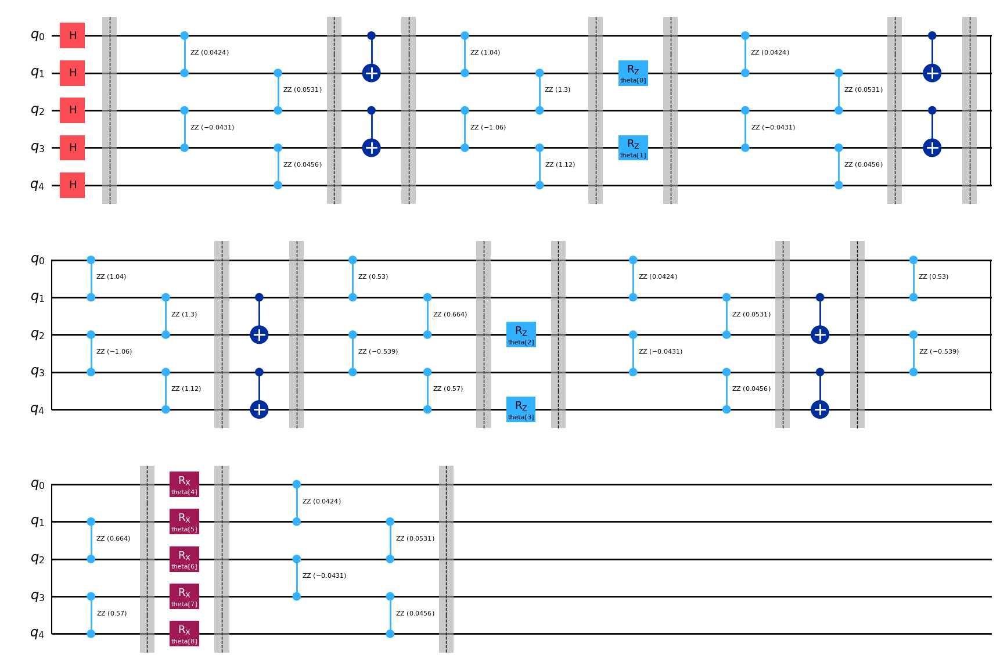

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

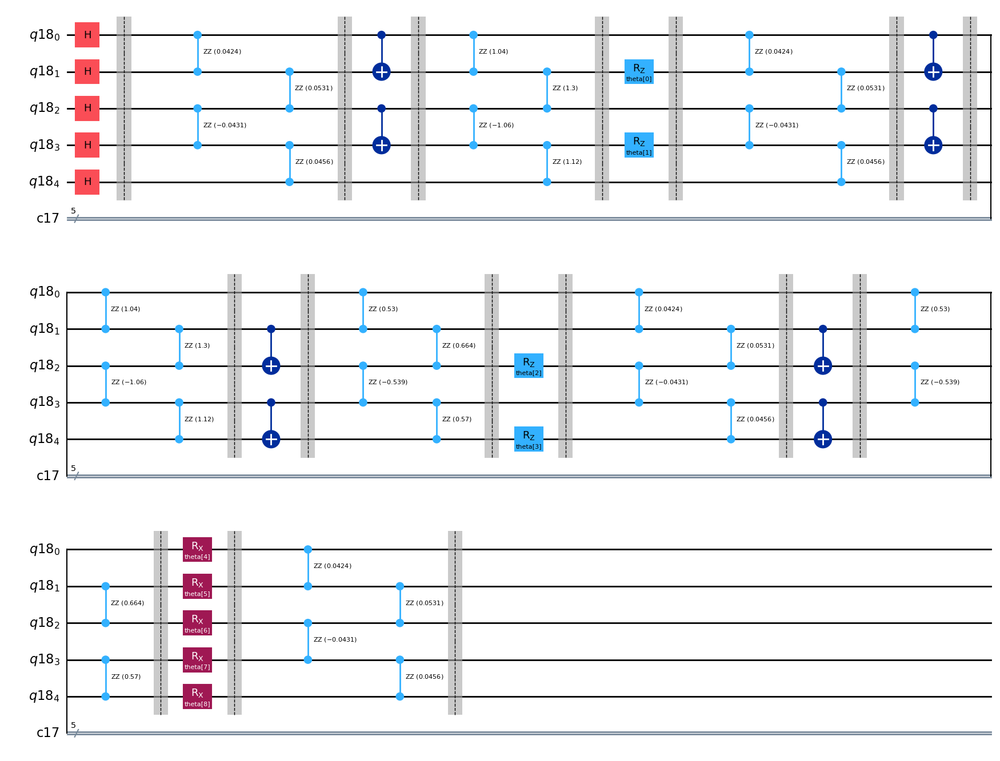

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

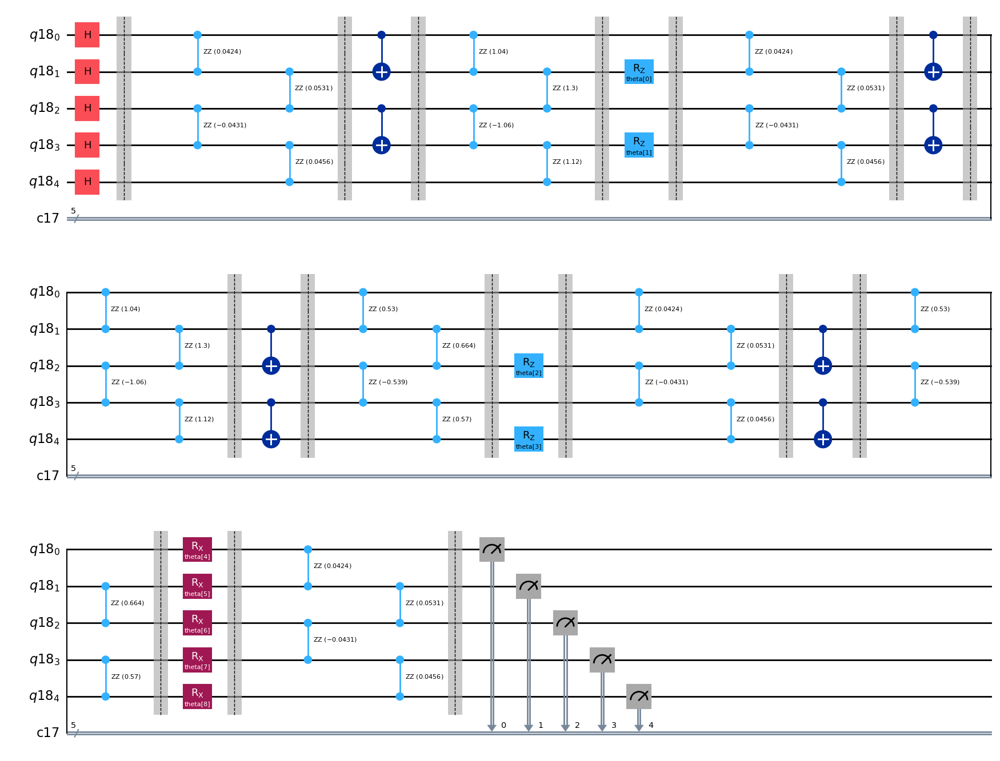

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

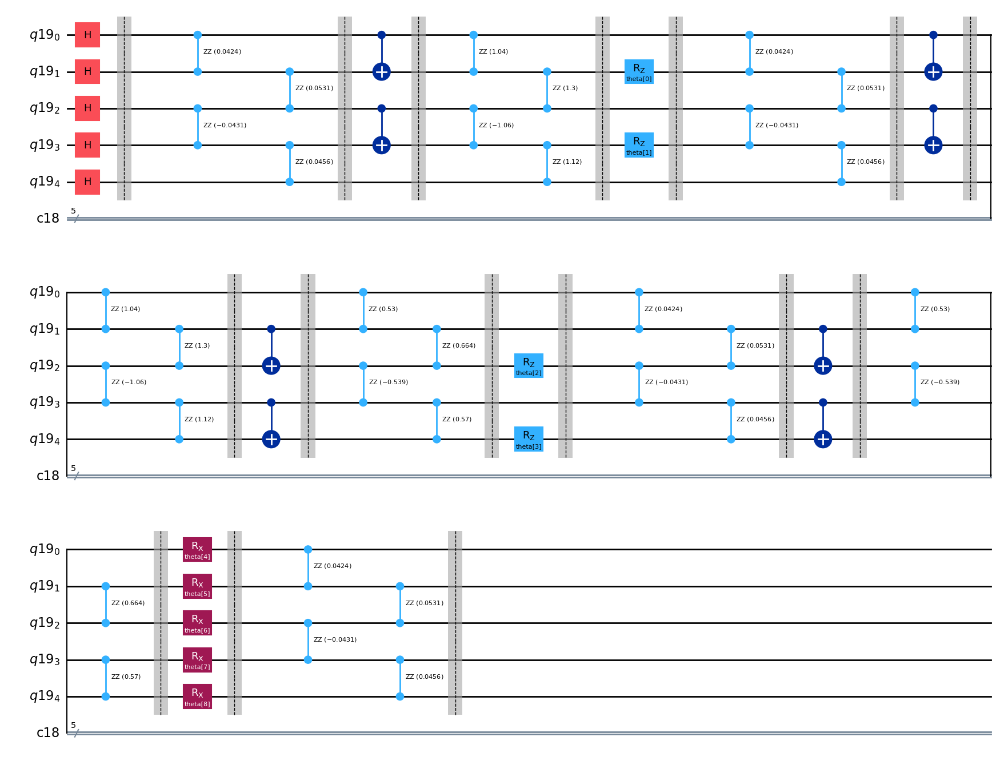

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

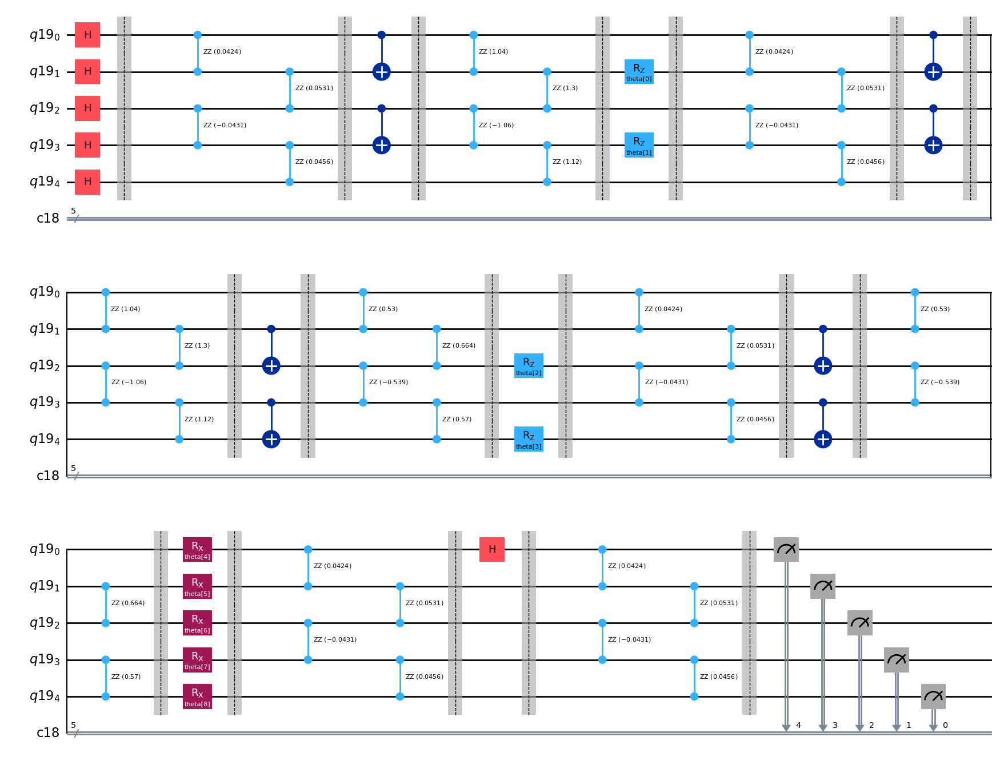

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

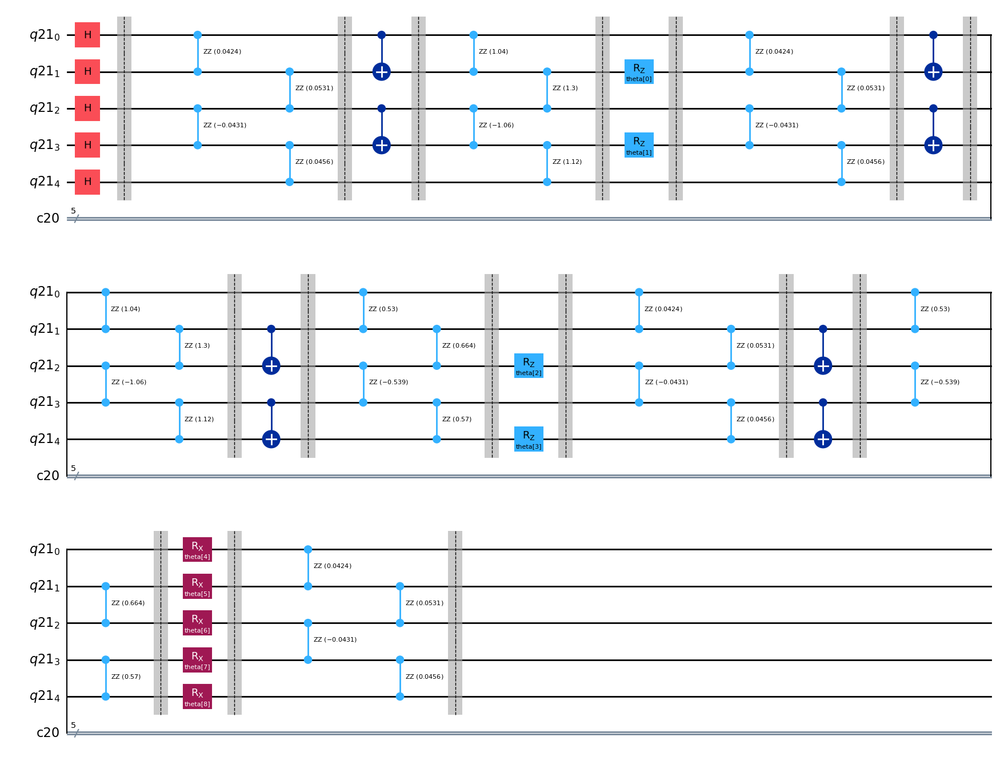

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

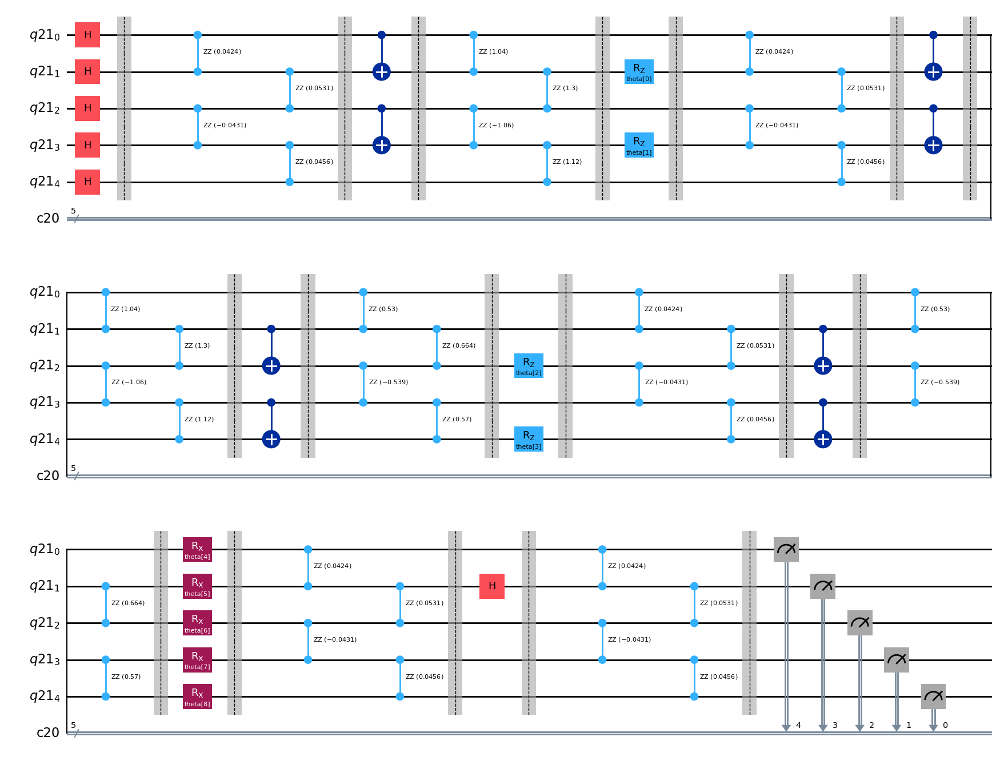

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

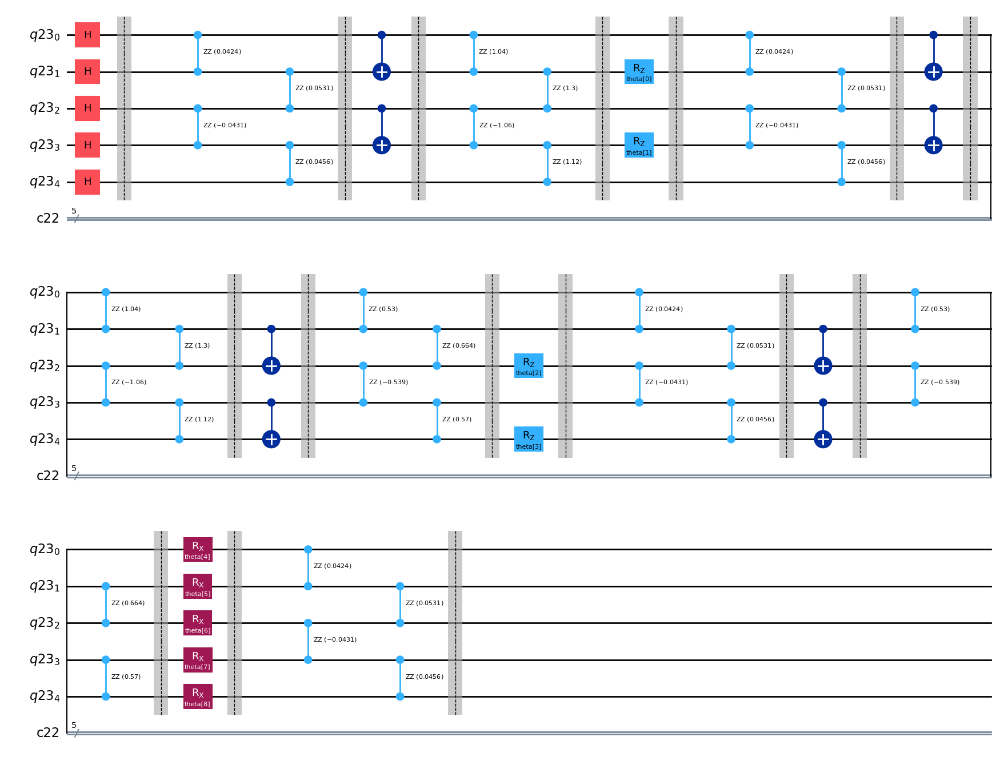

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

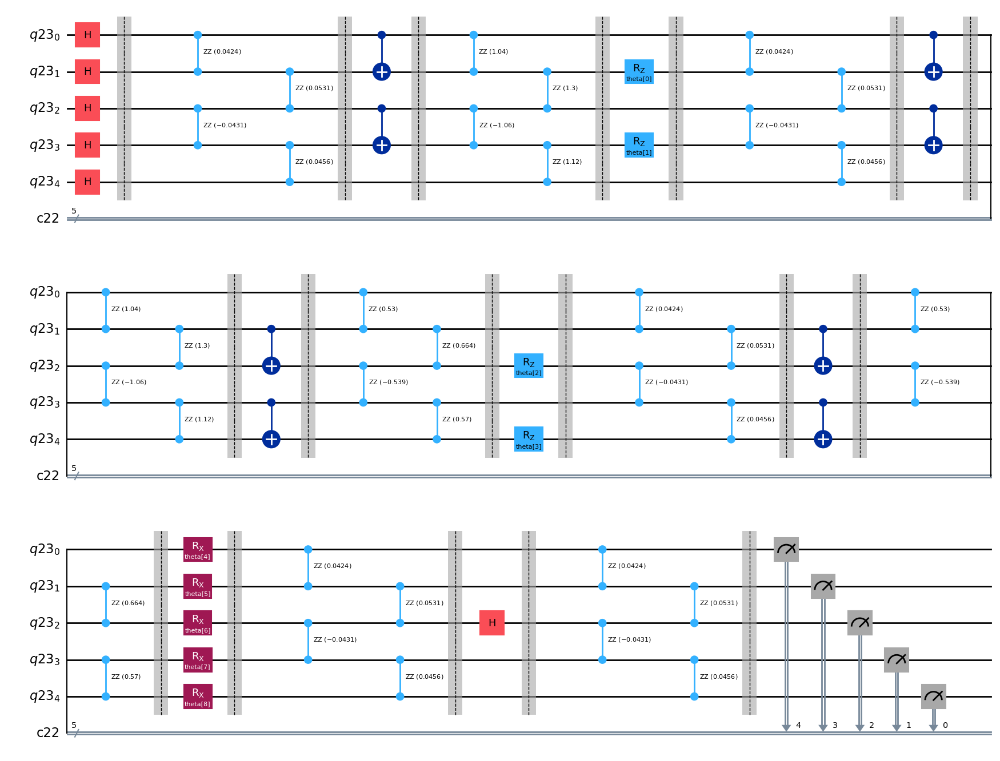

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

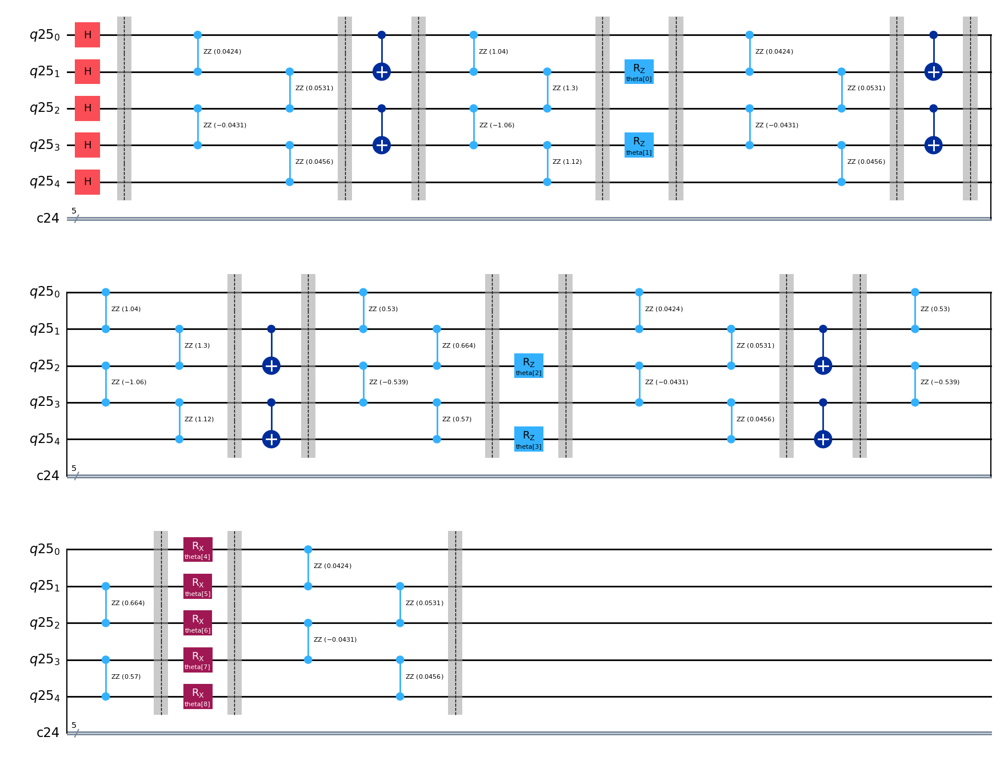

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

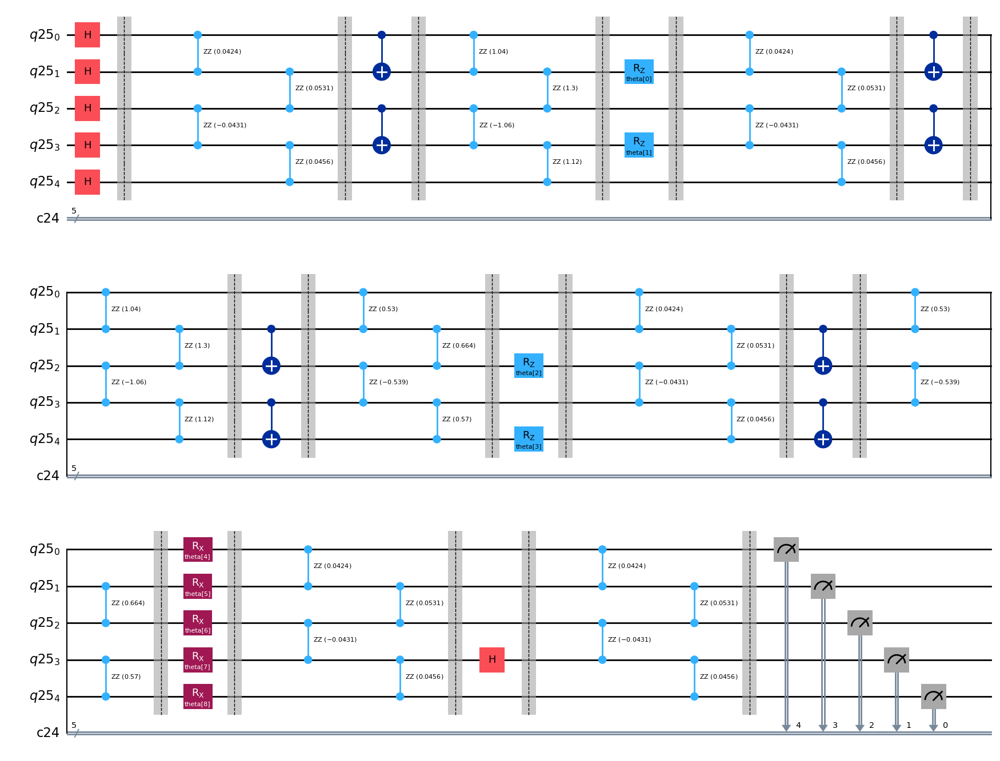

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

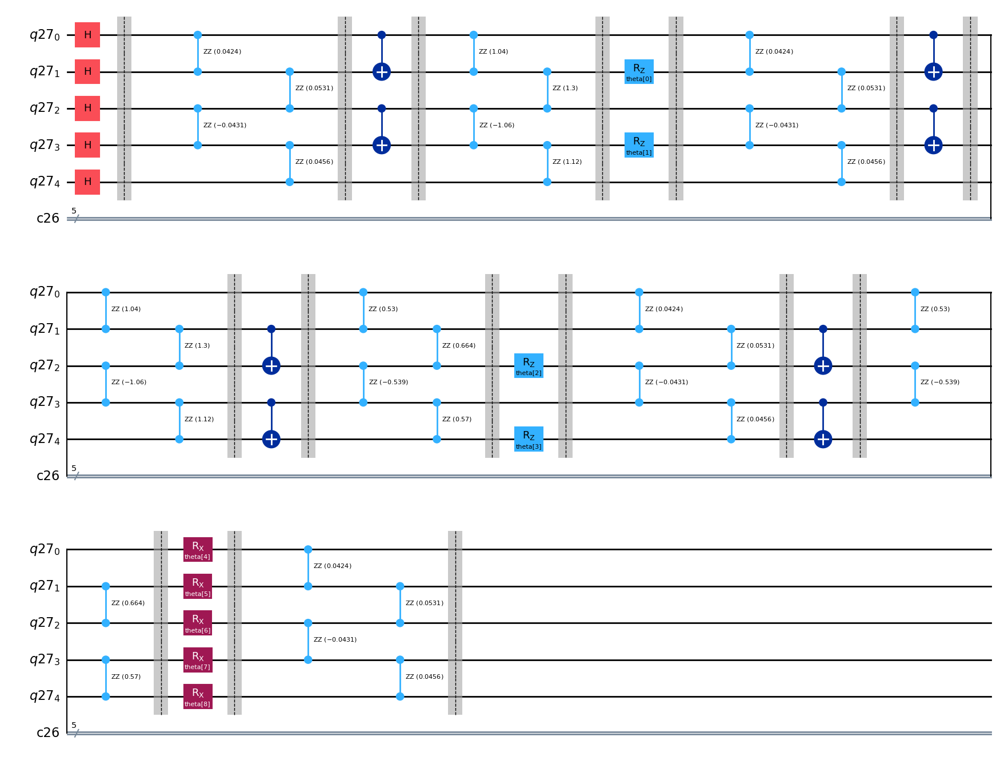

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

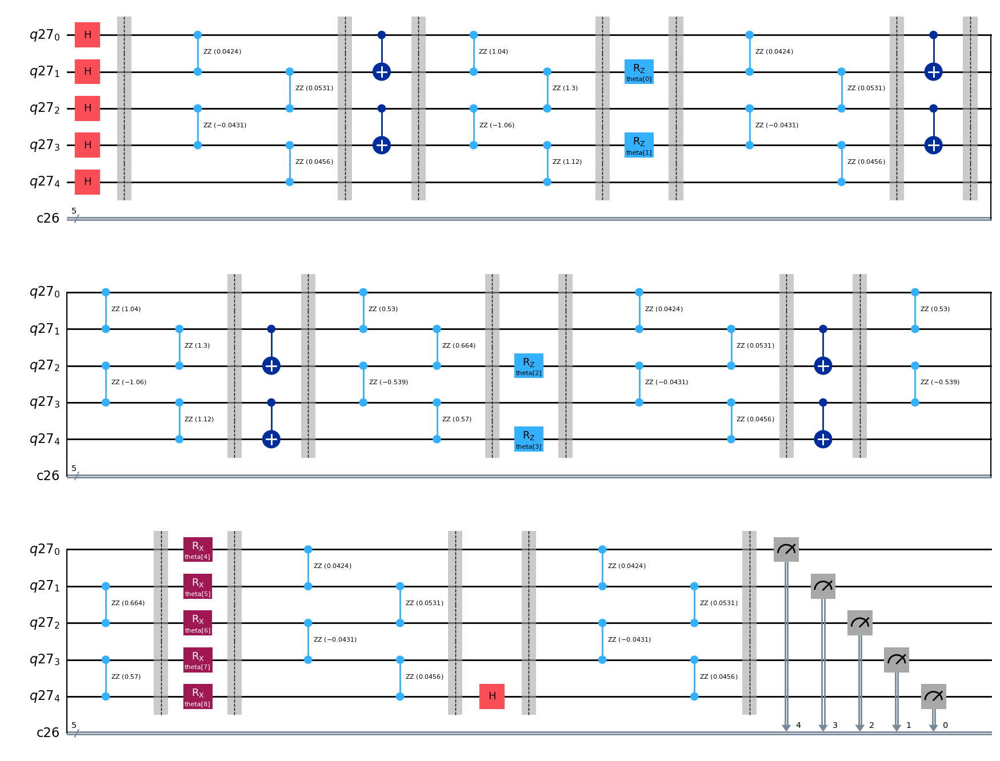

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


In [ ]:
lowest_energy_vqe

-2.8258000000000005

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


<ipython-input-80-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 39
         Function evaluations: 1120
         Gradient evaluations: 160
Optimization terminated successfully.
         Current function value: -4.548555
         Iterations: 56
         Function evaluations: 630
         Gradient evaluations: 90


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.151546
         Iterations: 143
         Function evaluations: 1557
         Gradient evaluations: 221


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.151544
         Iterations: 131
         Function evaluations: 1426
         Gradient evaluations: 202
Optimization terminated successfully.
         Current function value: -6.429606
         Iterations: 17
         Function evaluations: 161
         Gradient evaluations: 23


<ipython-input-80-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 28
         Function evaluations: 1036
         Gradient evaluations: 148
Optimization terminated successfully.
         Current function value: -6.303245
         Iterations: 33
         Function evaluations: 301
         Gradient evaluations: 43
Optimization terminated successfully.
         Current function value: -5.774085
         Iterations: 48
         Function evaluations: 378
         Gradient evaluations: 54


<ipython-input-80-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:56: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:103: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-80-942dbc8389c9>:136: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]
<ipython-input-77-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc

         Current function value: nan
         Iterations: 42
         Function evaluations: 1204
         Gradient evaluations: 172
Optimization terminated successfully.
         Current function value: -19.196477
         Iterations: 59
         Function evaluations: 483
         Gradient evaluations: 69


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.970255
         Iterations: 262
         Function evaluations: 2783
         Gradient evaluations: 396
Optimization terminated successfully.
         Current function value: -18.151548
         Iterations: 147
         Function evaluations: 1547
         Gradient evaluations: 221
Optimization terminated successfully.
         Current function value: -19.196477
         Iterations: 36
         Function evaluations: 364
         Gradient evaluations: 52
Optimization terminated successfully.
         Current function value: -6.325645
         Iterations: 90
         Function evaluations: 721
         Gradient evaluations: 103


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.970259
         Iterations: 300
         Function evaluations: 2751
         Gradient evaluations: 393
Optimization terminated successfully.
         Current function value: -6.325644
         Iterations: 55
         Function evaluations: 420
         Gradient evaluations: 60
         Current function value: -7.970256
         Iterations: 300
         Function evaluations: 3108
         Gradient evaluations: 444


<ipython-input-80-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-80-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-80-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar 

         Current function value: nan
         Iterations: 24
         Function evaluations: 994
         Gradient evaluations: 142
Optimization terminated successfully.
         Current function value: -5.558937
         Iterations: 19
         Function evaluations: 168
         Gradient evaluations: 24
Optimization terminated successfully.
         Current function value: -19.196476
         Iterations: 44
         Function evaluations: 399
         Gradient evaluations: 57


In [ ]:
lowest_energy_vqnhe

-19.19647655570937

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.368256
         Iterations: 50
         Function evaluations: 5388
         Gradient evaluations: 168


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.258376
         Iterations: 102
         Function evaluations: 5708
         Gradient evaluations: 178


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.216377
         Iterations: 34
         Function evaluations: 2284
         Gradient evaluations: 71
Optimization terminated successfully.
         Current function value: -6.642613
         Iterations: 62
         Function evaluations: 3072
         Gradient evaluations: 96


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.997067
         Iterations: 195
         Function evaluations: 9856
         Gradient evaluations: 308


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.677005
         Iterations: 88
         Function evaluations: 7012
         Gradient evaluations: 219


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.358553
         Iterations: 76
         Function evaluations: 3872
         Gradient evaluations: 121


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.353192
         Iterations: 290
         Function evaluations: 16480
         Gradient evaluations: 515


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.600007
         Iterations: 115
         Function evaluations: 5184
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.312158
         Iterations: 54
         Function evaluations: 3178
         Gradient evaluations: 99


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.376358
         Iterations: 157
         Function evaluations: 8896
         Gradient evaluations: 278


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.278588
         Iterations: 111
         Function evaluations: 6728
         Gradient evaluations: 210


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.220696
         Iterations: 46
         Function evaluations: 4487
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.354159
         Iterations: 123
         Function evaluations: 9383
         Gradient evaluations: 293


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.638839
         Iterations: 70
         Function evaluations: 5192
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.346346
         Iterations: 67
         Function evaluations: 4812
         Gradient evaluations: 150


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.777378
         Iterations: 182
         Function evaluations: 11243
         Gradient evaluations: 351


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.983560
         Iterations: 60
         Function evaluations: 4679
         Gradient evaluations: 146


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.338278
         Iterations: 67
         Function evaluations: 5132
         Gradient evaluations: 160
         Current function value: -19.463727
         Iterations: 194
         Function evaluations: 12684
         Gradient evaluations: 396


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-19.463727490606924

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -18.715368
         Iterations: 120
         Function evaluations: 25491
         Gradient evaluations: 447


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.877729
         Iterations: 99
         Function evaluations: 10044
         Gradient evaluations: 176


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.244469
         Iterations: 80
         Function evaluations: 7752
         Gradient evaluations: 136


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.725337
         Iterations: 66
         Function evaluations: 12267
         Gradient evaluations: 215
Optimization terminated successfully.
         Current function value: -4.403628
         Iterations: 5
         Function evaluations: 2166
         Gradient evaluations: 38


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.748446
         Iterations: 88
         Function evaluations: 11575
         Gradient evaluations: 203


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.792156
         Iterations: 118
         Function evaluations: 11070
         Gradient evaluations: 194


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -17.408358
         Iterations: 61
         Function evaluations: 11919
         Gradient evaluations: 209


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.305422
         Iterations: 41
         Function evaluations: 7422
         Gradient evaluations: 130


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.312070
         Iterations: 45
         Function evaluations: 5769
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.985416
         Iterations: 291
         Function evaluations: 31813
         Gradient evaluations: 558
Optimization terminated successfully.
         Current function value: -9.512333
         Iterations: 30
         Function evaluations: 4047
         Gradient evaluations: 71


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.194675
         Iterations: 71
         Function evaluations: 7365
         Gradient evaluations: 129


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.047114
         Iterations: 18
         Function evaluations: 9979
         Gradient evaluations: 175


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.487535
         Iterations: 46
         Function evaluations: 7991
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.650687
         Iterations: 45
         Function evaluations: 5767
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.463727
         Iterations: 167
         Function evaluations: 16074
         Gradient evaluations: 282


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -16.278063
         Iterations: 23
         Function evaluations: 8445
         Gradient evaluations: 148


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.828217
         Iterations: 35
         Function evaluations: 7422
         Gradient evaluations: 130
         Current function value: -18.353194
         Iterations: 101
         Function evaluations: 13521
         Gradient evaluations: 237


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-19.46372693691122

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.701876
         Iterations: 79
         Function evaluations: 4949
         Gradient evaluations: 190


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.508883
         Iterations: 31
         Function evaluations: 2997
         Gradient evaluations: 115
Optimization terminated successfully.
         Current function value: -3.839522
         Iterations: 144
         Function evaluations: 5304
         Gradient evaluations: 204


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.327670
         Iterations: 14
         Function evaluations: 4010
         Gradient evaluations: 154
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 15
         Function evaluations: 416
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: -3.632891
         Iterations: 27
         Function evaluations: 884
         Gradient evaluations: 34


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.840063
         Iterations: 39
         Function evaluations: 1716
         Gradient evaluations: 66
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 14
         Function evaluations: 390
         Gradient evaluations: 15


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.828911
         Iterations: 9
         Function evaluations: 2170
         Gradient evaluations: 83
Optimization terminated successfully.
         Current function value: -4.507757
         Iterations: 96
         Function evaluations: 3588
         Gradient evaluations: 138


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.517616
         Iterations: 13
         Function evaluations: 2372
         Gradient evaluations: 91


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.297136
         Iterations: 42
         Function evaluations: 3566
         Gradient evaluations: 137
Optimization terminated successfully.
         Current function value: -3.839522
         Iterations: 45
         Function evaluations: 3016
         Gradient evaluations: 116
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 13
         Function evaluations: 364
         Gradient evaluations: 14


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.827060
         Iterations: 71
         Function evaluations: 2548
         Gradient evaluations: 98


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.521371
         Iterations: 14
         Function evaluations: 2137
         Gradient evaluations: 82


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.378006
         Iterations: 71
         Function evaluations: 5105
         Gradient evaluations: 196


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.893225
         Iterations: 99
         Function evaluations: 4451
         Gradient evaluations: 171
Optimization terminated successfully.
         Current function value: -3.297074
         Iterations: 32
         Function evaluations: 1560
         Gradient evaluations: 60
         Current function value: -5.094554
         Iterations: 155
         Function evaluations: 9103
         Gradient evaluations: 350


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.827060304806946

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.7978
-2.7270000000000003
-2.5987999999999998
-2.6502000000000008
-2.444
-2.4370000000000003
-2.566
-2.4095999999999997
-2.6585999999999994
-2.6224000000000003
-2.5338000000000007
-2.4714
-2.8258000000000005
-2.4066
-2.6216
-2.7051999999999996
-2.7518000000000007
-2.7474000000000007
-2.0534
-2.5803999999999996


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.582849
         Iterations: 118
         Function evaluations: 15852
         Gradient evaluations: 288
Optimization terminated successfully.
         Current function value: -4.955159
         Iterations: 31
         Function evaluations: 2860
         Gradient evaluations: 52


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.306454
         Iterations: 4
         Function evaluations: 3807
         Gradient evaluations: 69


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.364500
         Iterations: 19
         Function evaluations: 5006
         Gradient evaluations: 91
Optimization terminated successfully.
         Current function value: -2.842421
         Iterations: 11
         Function evaluations: 660
         Gradient evaluations: 12


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.313288
         Iterations: 65
         Function evaluations: 9582
         Gradient evaluations: 174
Optimization terminated successfully.
         Current function value: -3.711059
         Iterations: 27
         Function evaluations: 1705
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: -4.380335
         Iterations: 38
         Function evaluations: 3520
         Gradient evaluations: 64
Optimization terminated successfully.
         Current function value: -2.825800
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.377667
         Iterations: 81
         Function evaluations: 15247
         Gradient evaluations: 277


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.943461
         Iterations: 85
         Function evaluations: 8042
         Gradient evaluations: 146
Optimization terminated successfully.
         Current function value: -3.266402
         Iterations: 49
         Function evaluations: 4235
         Gradient evaluations: 77


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.393885
         Iterations: 86
         Function evaluations: 8867
         Gradient evaluations: 161


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.188819
         Iterations: 19
         Function evaluations: 6612
         Gradient evaluations: 120
Optimization terminated successfully.
         Current function value: -4.105995
         Iterations: 21
         Function evaluations: 1430
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: -4.625200
         Iterations: 43
         Function evaluations: 2970
         Gradient evaluations: 54


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.847440
         Iterations: 20
         Function evaluations: 6334
         Gradient evaluations: 115


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.460673
         Iterations: 14
         Function evaluations: 5782
         Gradient evaluations: 105
Optimization terminated successfully.
         Current function value: -3.297074
         Iterations: 19
         Function evaluations: 1595
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: -3.864416
         Iterations: 45
         Function evaluations: 3465
         Gradient evaluations: 63


In [ ]:
lowest_energy_vqnhe

-5.393885243670698

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 6MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 6MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.006                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01560399 4.95539601]
[9.97148536 9.72232118 9.60405346]
-0.24867882184429213
[4.95624122 4.80675878]
[9.60379842 9.76360834 9.30346324]
0.0006083376494663284
[4.80691531 5.23208469]
[ 9.30352209 10.03850666 10.16086124]
-0.0004933367055128812
[5.23238143 5.13761857]
[10.15992788 10.37052248  9.97041964]
0.00052248031572244


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(-0.12433941092214607,
 0.0003041688247331642,
 -0.0002466683527564406,
 0.00026124015786122)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

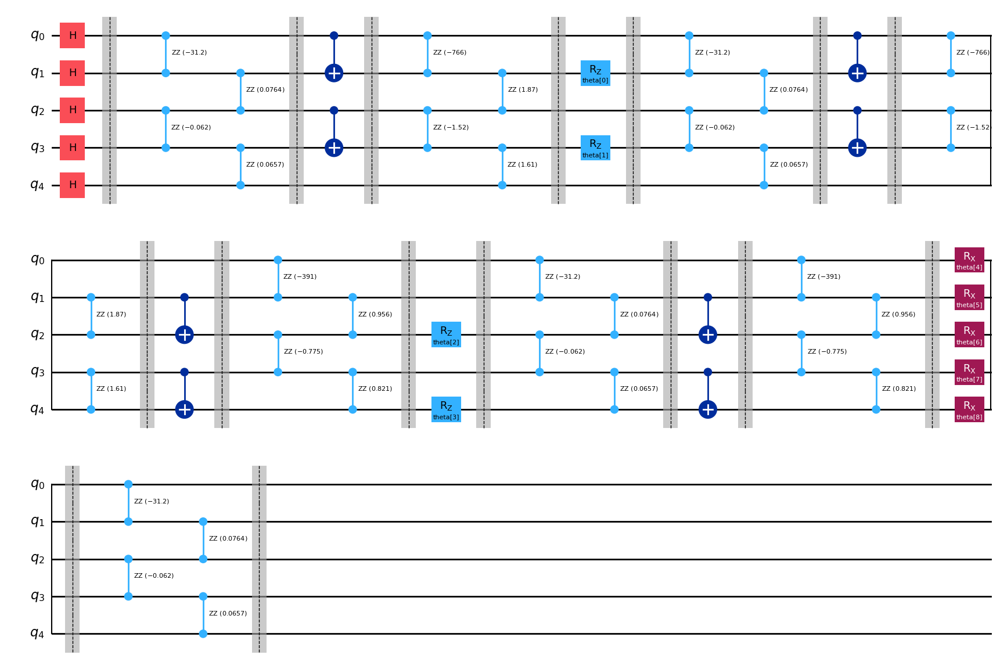

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

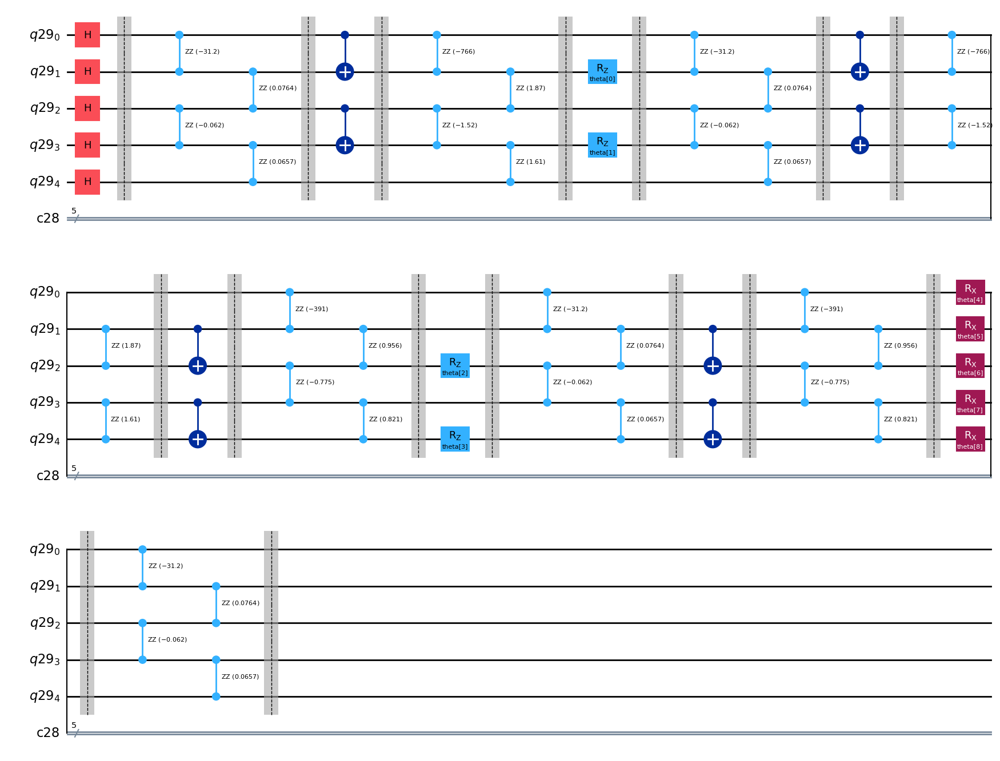

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

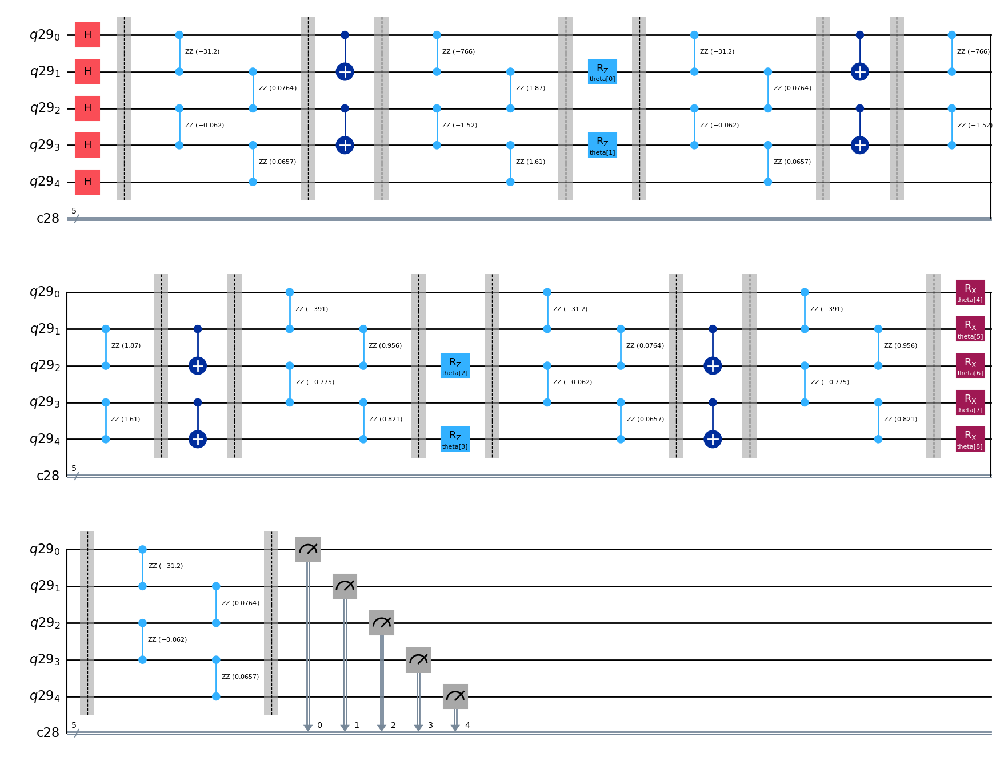

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

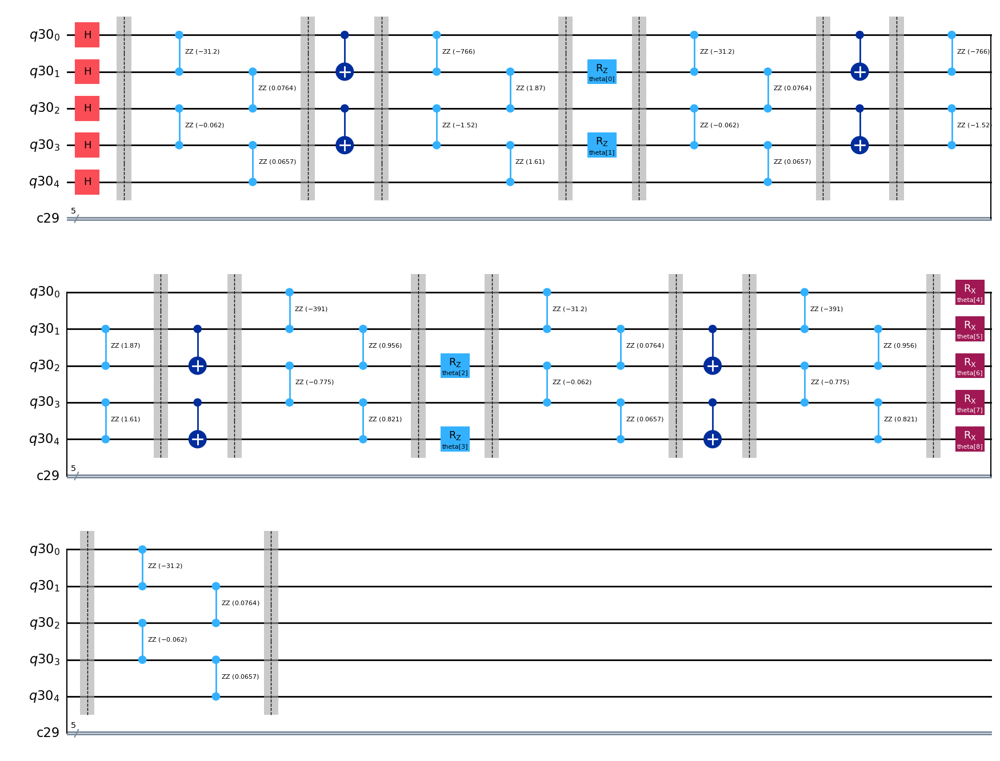

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

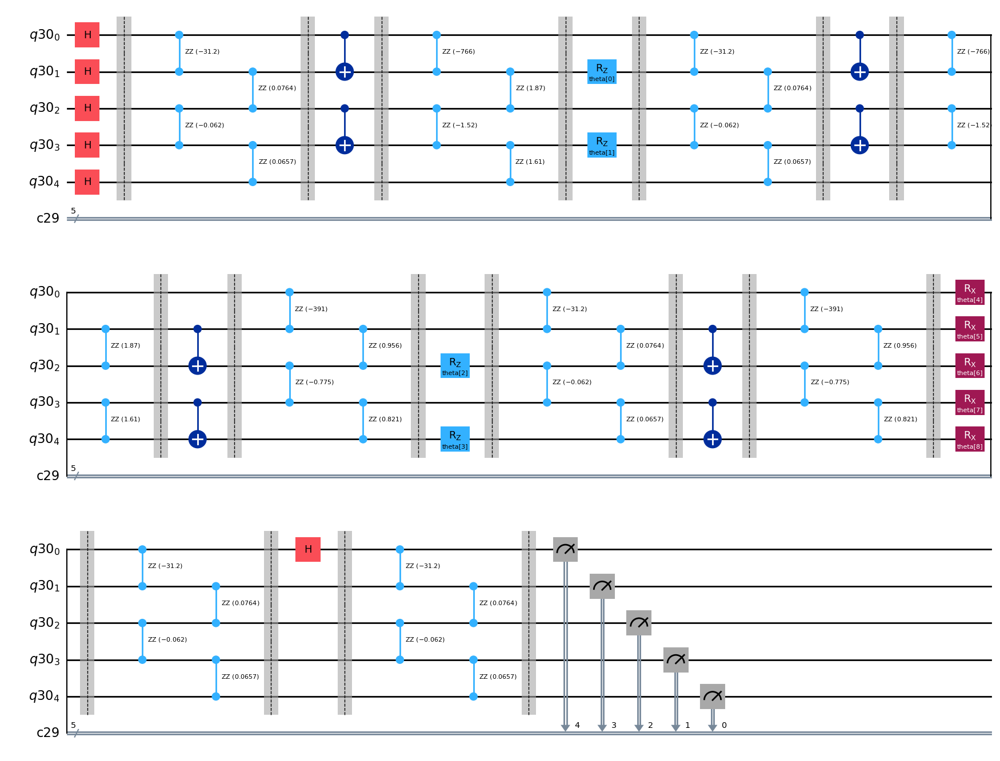

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

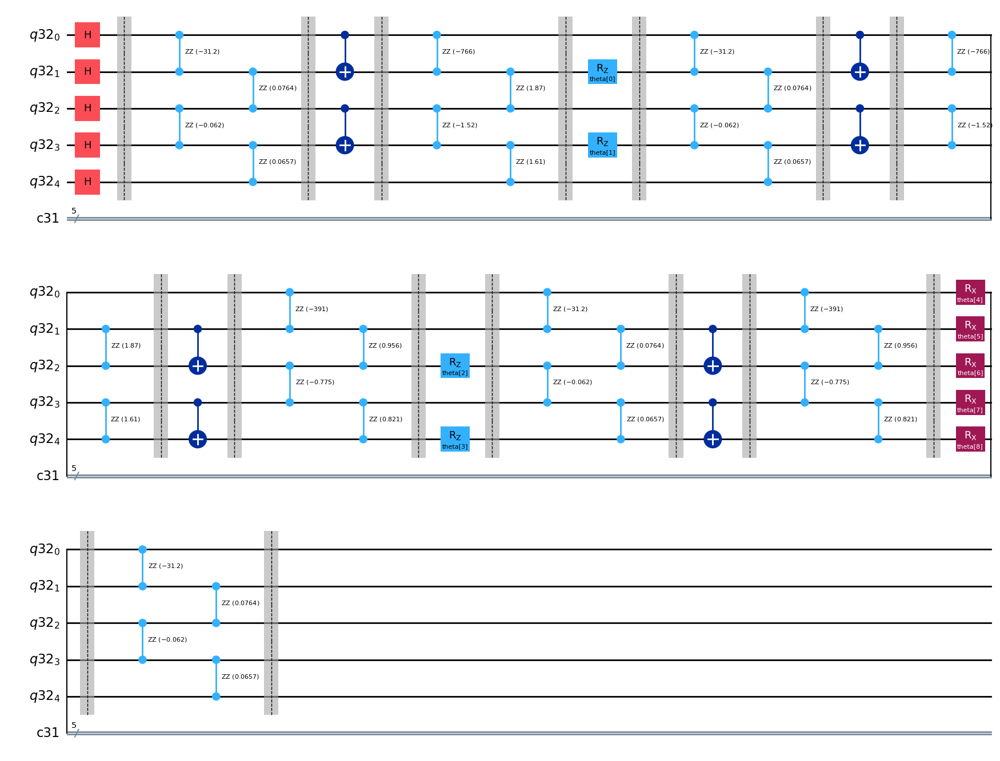

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

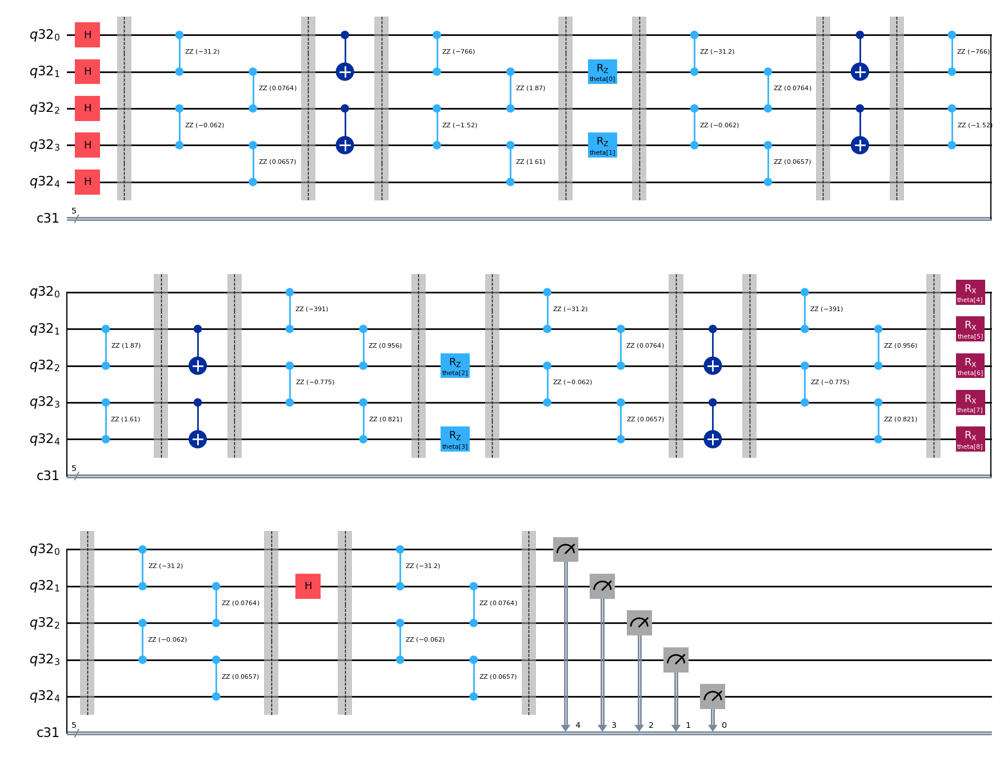

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

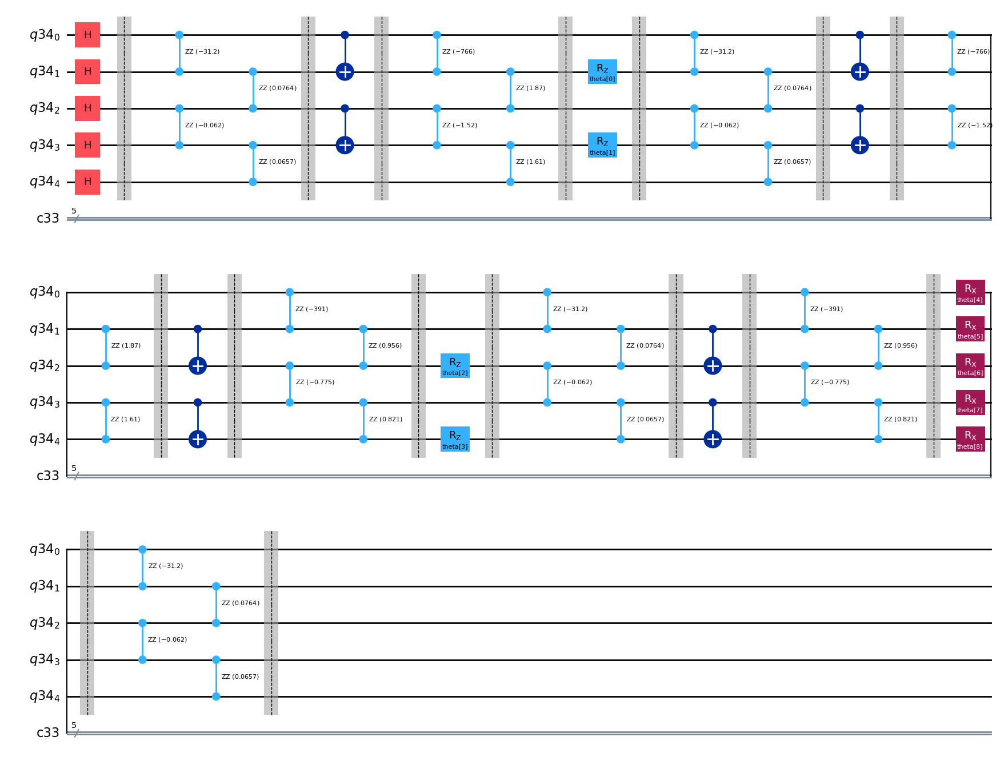

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

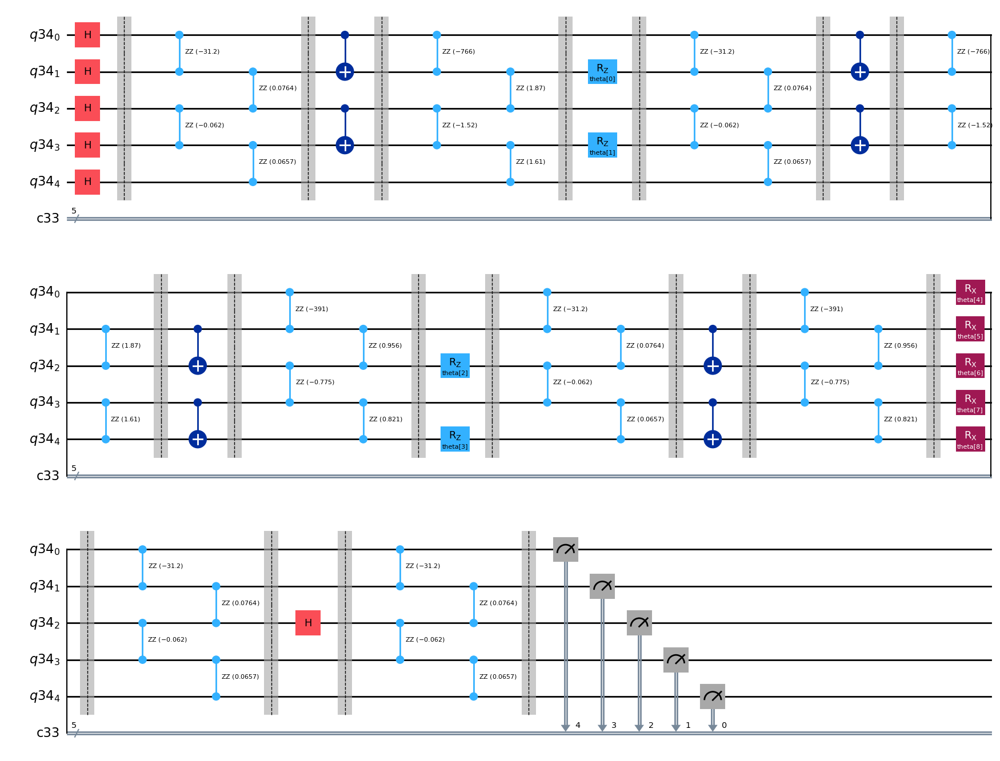

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

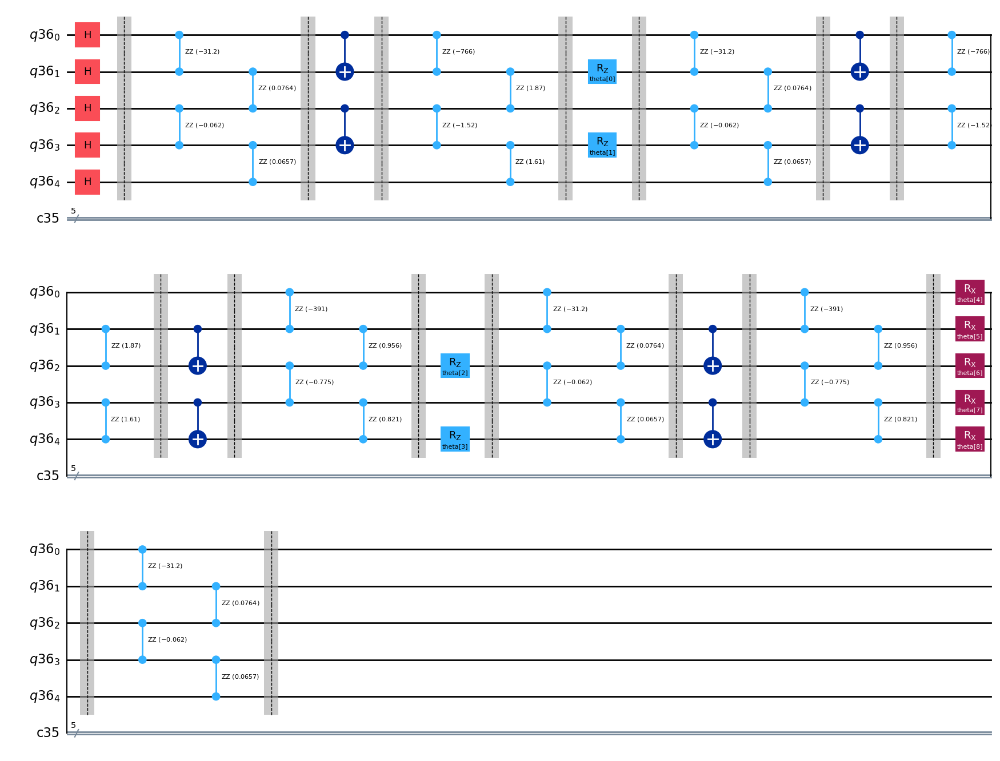

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

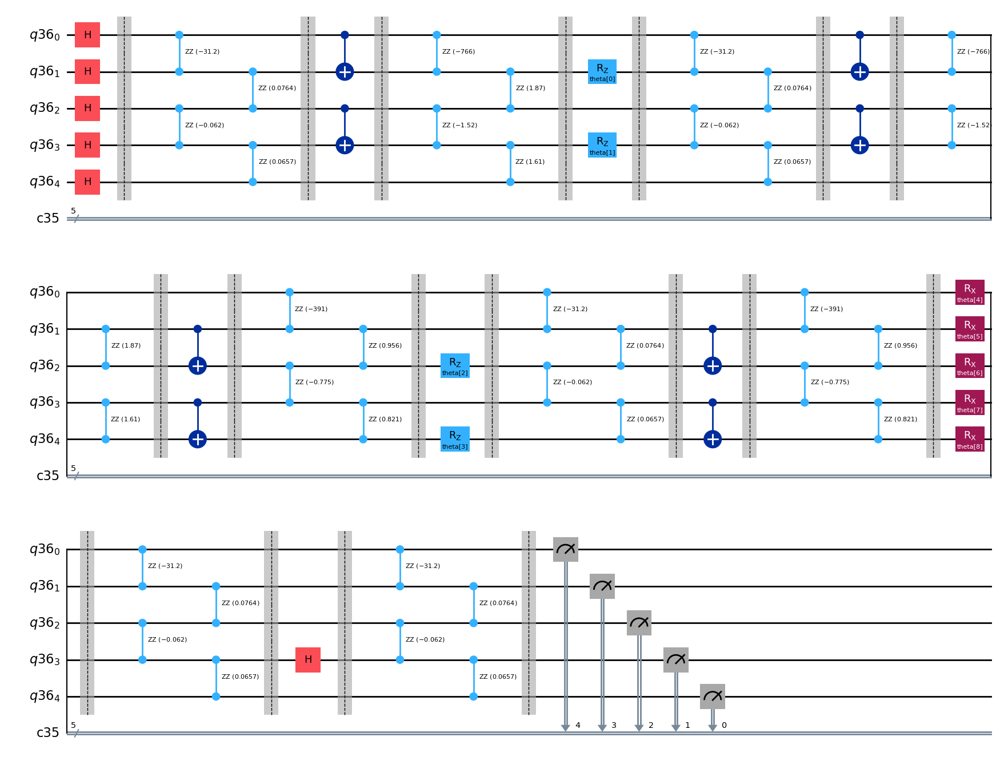

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

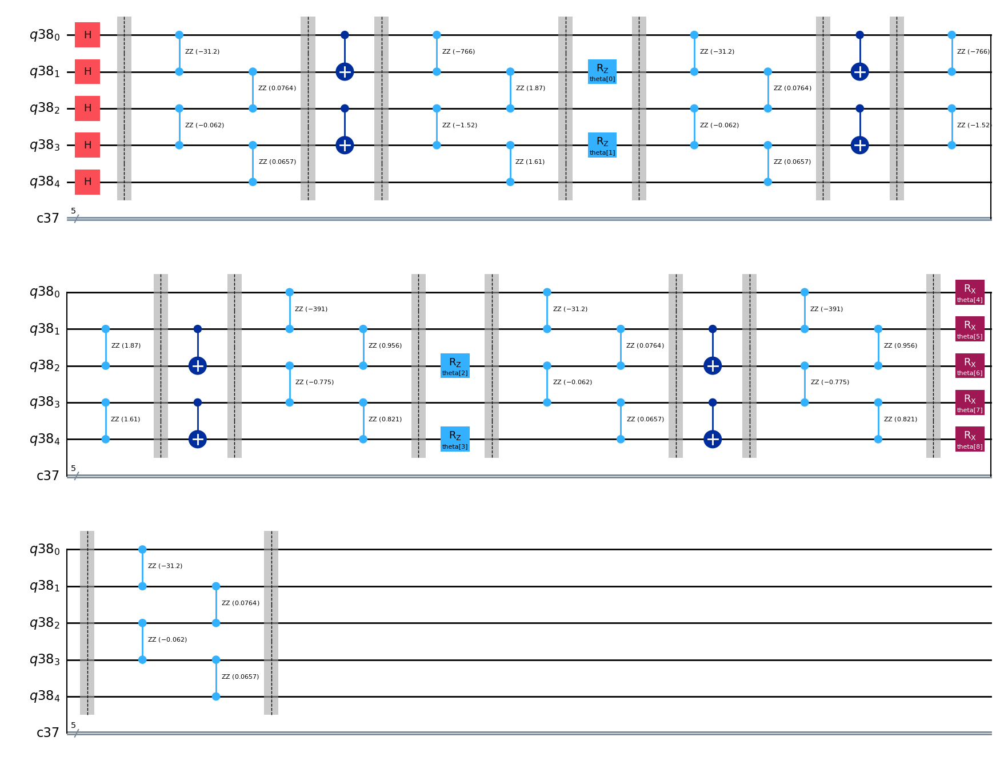

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

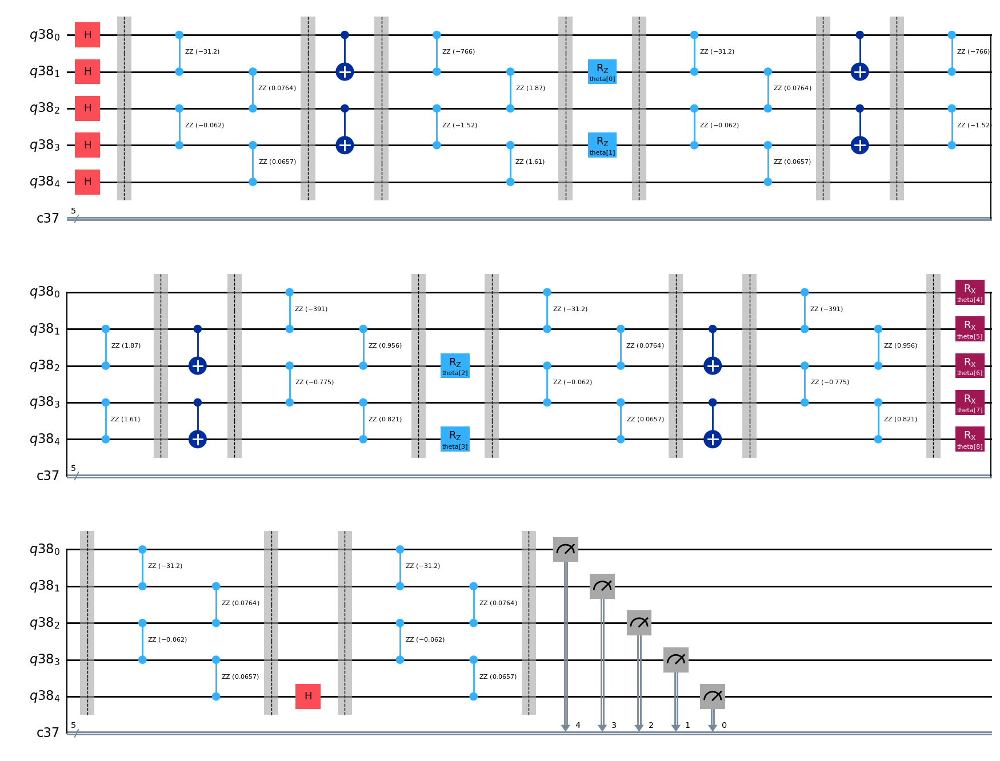

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-2.2114000000000007
-2.407600000000001
-2.3006000000000006
-1.7346
-2.3416
-2.5338000000000003
-2.5052000000000003
-2.3302
-2.5194000000000005
-2.1273999999999997
-2.5284000000000004
-2.382
-2.2688
-2.4983999999999993
-2.5358000000000005
-2.3696
-2.359200000000001
-2.177
-2.4182000000000006
-2.3112000000000004


In [ ]:
lowest_energy_vqe

-2.5358000000000005

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2114000000000007
-2.407600000000001
-2.3006000000000006
-1.7346
-2.3416
-2.5338000000000003
-2.5052000000000003
-2.3302
-2.5194000000000005
-2.1273999999999997
-2.5284000000000004
-2.382
-2.2688
-2.4983999999999993
-2.5358000000000005
-2.3696
-2.359200000000001
-2.177
-2.4182000000000006
-2.3112000000000004
Optimization terminated successfully.
         Current function value: -3.664731
         Iterations: 28
         Function evaluations: 210
         Gradient evaluations: 30


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.803886
         Iterations: 73
         Function evaluations: 1092
         Gradient evaluations: 156


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.803886
         Iterations: 74
         Function evaluations: 1075
         Gradient evaluations: 152
Optimization terminated successfully.
         Current function value: -19.802366
         Iterations: 47
         Function evaluations: 539
         Gradient evaluations: 77
Optimization terminated successfully.
         Current function value: -3.671745
         Iterations: 21
         Function evaluations: 210
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: -6.600238
         Iterations: 27
         Function evaluations: 266
         Gradient evaluations: 38


<ipython-input-122-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 51
         Function evaluations: 1141
         Gradient evaluations: 163
Optimization terminated successfully.
         Current function value: -19.802366
         Iterations: 49
         Function evaluations: 413
         Gradient evaluations: 59


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.802368
         Iterations: 46
         Function evaluations: 887
         Gradient evaluations: 125


<ipython-input-122-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 72
         Function evaluations: 1617
         Gradient evaluations: 231


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.803886
         Iterations: 83
         Function evaluations: 1106
         Gradient evaluations: 158
Optimization terminated successfully.
         Current function value: -5.788518
         Iterations: 119
         Function evaluations: 1078
         Gradient evaluations: 154
Optimization terminated successfully.
         Current function value: -3.066889
         Iterations: 13
         Function evaluations: 112
         Gradient evaluations: 16
Optimization terminated successfully.
         Current function value: -19.803886
         Iterations: 75
         Function evaluations: 875
         Gradient evaluations: 125
Optimization terminated successfully.
         Current function value: -19.803886
         Iterations: 71
         Function evaluations: 847
         Gradient evaluations: 121
Optimization terminated successfully.
         Current function value: -6.600239
         Iterations: 63
         Function evaluations: 476
         Gradient 

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-19.803885991096184

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2114000000000007
-2.407600000000001
-2.3006000000000006
-1.7346
-2.3416
-2.5338000000000003
-2.5052000000000003
-2.3302
-2.5194000000000005
-2.1273999999999997
-2.5284000000000004
-2.382
-2.2688
-2.4983999999999993
-2.5358000000000005
-2.3696
-2.359200000000001
-2.177
-2.4182000000000006
-2.3112000000000004


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.072551
         Iterations: 50
         Function evaluations: 5220
         Gradient evaluations: 163
Optimization terminated successfully.
         Current function value: -3.673259
         Iterations: 34
         Function evaluations: 1440
         Gradient evaluations: 45


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.595269
         Iterations: 201
         Function evaluations: 10304
         Gradient evaluations: 322


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.600243
         Iterations: 37
         Function evaluations: 2853
         Gradient evaluations: 89


<ipython-input-119-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-122-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-122-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-122-942dbc8389c9>:99: RuntimeWarni

         Current function value: nan
         Iterations: 22
         Function evaluations: 4672
         Gradient evaluations: 146


<ipython-input-122-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-122-942dbc8389c9>:86: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-122-942dbc8389c9>:103: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-122-942dbc8389c9>:107: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-122-942dbc8389c9>:111: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-122-942dbc8389c9>:123: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
<ipython-input-122-942dbc8389c9>:136: RuntimeWarning: invalid value encountered in scalar multiply
  expva

         Current function value: nan
         Iterations: 71
         Function evaluations: 7136
         Gradient evaluations: 223
Optimization terminated successfully.
         Current function value: -2.734952
         Iterations: 7
         Function evaluations: 480
         Gradient evaluations: 15


<ipython-input-119-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-122-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-122-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-122-942dbc8389c9>:99: RuntimeWarni

         Current function value: nan
         Iterations: 21
         Function evaluations: 4960
         Gradient evaluations: 155


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.614990
         Iterations: 69
         Function evaluations: 5864
         Gradient evaluations: 183


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.279197
         Iterations: 87
         Function evaluations: 6124
         Gradient evaluations: 191


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.608560
         Iterations: 23
         Function evaluations: 3015
         Gradient evaluations: 94
Optimization terminated successfully.
         Current function value: -6.600216
         Iterations: 33
         Function evaluations: 1408
         Gradient evaluations: 44
Optimization terminated successfully.
         Current function value: -6.600448
         Iterations: 68
         Function evaluations: 3520
         Gradient evaluations: 110


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.650131
         Iterations: 129
         Function evaluations: 7019
         Gradient evaluations: 219
Optimization terminated successfully.
         Current function value: -6.599401
         Iterations: 27
         Function evaluations: 928
         Gradient evaluations: 29


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.793643
         Iterations: 74
         Function evaluations: 4487
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.208211
         Iterations: 140
         Function evaluations: 8256
         Gradient evaluations: 258
Optimization terminated successfully.
         Current function value: -6.600239
         Iterations: 43
         Function evaluations: 1536
         Gradient evaluations: 48


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.825184
         Iterations: 92
         Function evaluations: 5920
         Gradient evaluations: 185
         Current function value: -19.832976
         Iterations: 116
         Function evaluations: 5696
         Gradient evaluations: 178


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-19.832975592672703

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2114000000000007
-2.407600000000001
-2.3006000000000006
-1.7346
-2.3416
-2.5338000000000003
-2.5052000000000003
-2.3302
-2.5194000000000005
-2.1273999999999997
-2.5284000000000004
-2.382
-2.2688
-2.4983999999999993
-2.5358000000000005
-2.3696
-2.359200000000001
-2.177
-2.4182000000000006
-2.3112000000000004


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.822119
         Iterations: 19
         Function evaluations: 6054
         Gradient evaluations: 106
Optimization terminated successfully.
         Current function value: -2.894685
         Iterations: 11
         Function evaluations: 741
         Gradient evaluations: 13
Optimization terminated successfully.
         Current function value: -6.599399
         Iterations: 29
         Function evaluations: 5700
         Gradient evaluations: 100


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.517630
         Iterations: 71
         Function evaluations: 10386
         Gradient evaluations: 182


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.240297
         Iterations: 81
         Function evaluations: 12324
         Gradient evaluations: 216
Optimization terminated successfully.
         Current function value: -6.599406
         Iterations: 23
         Function evaluations: 1653
         Gradient evaluations: 29


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.821024
         Iterations: 92
         Function evaluations: 11583
         Gradient evaluations: 203
Optimization terminated successfully.
         Current function value: -3.486747
         Iterations: 75
         Function evaluations: 5928
         Gradient evaluations: 104


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.196354
         Iterations: 45
         Function evaluations: 9188
         Gradient evaluations: 161


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.298358
         Iterations: 11
         Function evaluations: 5370
         Gradient evaluations: 94


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.593822
         Iterations: 28
         Function evaluations: 8675
         Gradient evaluations: 152


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.673615
         Iterations: 258
         Function evaluations: 22520
         Gradient evaluations: 395
Optimization terminated successfully.
         Current function value: -6.373072
         Iterations: 5
         Function evaluations: 399
         Gradient evaluations: 7


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.125805
         Iterations: 18
         Function evaluations: 7929
         Gradient evaluations: 139
Optimization terminated successfully.
         Current function value: -6.448325
         Iterations: 20
         Function evaluations: 1482
         Gradient evaluations: 26


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.004457
         Iterations: 121
         Function evaluations: 10842
         Gradient evaluations: 190
Optimization terminated successfully.
         Current function value: -6.648806
         Iterations: 114
         Function evaluations: 9234
         Gradient evaluations: 162


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -19.308860
         Iterations: 98
         Function evaluations: 12095
         Gradient evaluations: 212
Optimization terminated successfully.
         Current function value: -7.093548
         Iterations: 12
         Function evaluations: 1767
         Gradient evaluations: 31
Optimization terminated successfully.
         Current function value: -4.411960
         Iterations: 53
         Function evaluations: 4104
         Gradient evaluations: 72


In [ ]:
lowest_energy_vqnhe

-19.67361534696425

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2114000000000007
-2.407600000000001
-2.3006000000000006
-1.7346
-2.3416
-2.5338000000000003
-2.5052000000000003
-2.3302
-2.5194000000000005
-2.1273999999999997
-2.5284000000000004
-2.382
-2.2688
-2.4983999999999993
-2.5358000000000005
-2.3696
-2.359200000000001
-2.177
-2.4182000000000006
-2.3112000000000004


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.507963
         Iterations: 60
         Function evaluations: 4273
         Gradient evaluations: 164


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.578071
         Iterations: 8
         Function evaluations: 2456
         Gradient evaluations: 94


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.109200
         Iterations: 82
         Function evaluations: 3484
         Gradient evaluations: 134
Optimization terminated successfully.
         Current function value: -4.512148
         Iterations: 36
         Function evaluations: 2912
         Gradient evaluations: 112
Optimization terminated successfully.
         Current function value: -2.737193
         Iterations: 11
         Function evaluations: 312
         Gradient evaluations: 12


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.223585
         Iterations: 188
         Function evaluations: 8502
         Gradient evaluations: 327


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.584599
         Iterations: 110
         Function evaluations: 5417
         Gradient evaluations: 208
Optimization terminated successfully.
         Current function value: -2.737193
         Iterations: 25
         Function evaluations: 702
         Gradient evaluations: 27


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.109314
         Iterations: 34
         Function evaluations: 3131
         Gradient evaluations: 120
Optimization terminated successfully.
         Current function value: -4.637170
         Iterations: 58
         Function evaluations: 2236
         Gradient evaluations: 86
Optimization terminated successfully.
         Current function value: -4.584563
         Iterations: 79
         Function evaluations: 2860
         Gradient evaluations: 110


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.270980
         Iterations: 92
         Function evaluations: 3910
         Gradient evaluations: 150


<ipython-input-122-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-122-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-122-942dbc8389c9>:48: RuntimeWarning: overflow encountered in 

         Current function value: nan
         Iterations: 36
         Function evaluations: 4836
         Gradient evaluations: 186
Optimization terminated successfully.
         Current function value: -2.737193
         Iterations: 25
         Function evaluations: 676
         Gradient evaluations: 26


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.395935
         Iterations: 15
         Function evaluations: 2482
         Gradient evaluations: 95


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.648976
         Iterations: 56
         Function evaluations: 4373
         Gradient evaluations: 168


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.449560
         Iterations: 30
         Function evaluations: 3050
         Gradient evaluations: 117


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.690804
         Iterations: 51
         Function evaluations: 2894
         Gradient evaluations: 111
Optimization terminated successfully.
         Current function value: -4.043384
         Iterations: 49
         Function evaluations: 2366
         Gradient evaluations: 91
         Current function value: -4.916049
         Iterations: 15
         Function evaluations: 2215
         Gradient evaluations: 85


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-5.10931351385758

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-2.2114000000000007
-2.407600000000001
-2.3006000000000006
-1.7346
-2.3416
-2.5338000000000003
-2.5052000000000003
-2.3302
-2.5194000000000005
-2.1273999999999997
-2.5284000000000004
-2.382
-2.2688
-2.4983999999999993
-2.5358000000000005
-2.3696
-2.359200000000001
-2.177
-2.4182000000000006
-2.3112000000000004
Optimization terminated successfully.
         Current function value: -4.276649
         Iterations: 23
         Function evaluations: 2090
         Gradient evaluations: 38


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.629728
         Iterations: 54
         Function evaluations: 8867
         Gradient evaluations: 161
Optimization terminated successfully.
         Current function value: -2.737193
         Iterations: 10
         Function evaluations: 660
         Gradient evaluations: 12


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.830862
         Iterations: 55
         Function evaluations: 7214
         Gradient evaluations: 131
Optimization terminated successfully.
         Current function value: -2.737193
         Iterations: 24
         Function evaluations: 1375
         Gradient evaluations: 25


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.225999
         Iterations: 10
         Function evaluations: 5127
         Gradient evaluations: 93


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.346433
         Iterations: 145
         Function evaluations: 19482
         Gradient evaluations: 354
Optimization terminated successfully.
         Current function value: -4.512481
         Iterations: 112
         Function evaluations: 9350
         Gradient evaluations: 170
Optimization terminated successfully.
         Current function value: -2.535800
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.670114
         Iterations: 76
         Function evaluations: 10403
         Gradient evaluations: 189


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.810964
         Iterations: 133
         Function evaluations: 16236
         Gradient evaluations: 295
Optimization terminated successfully.
         Current function value: -2.737193
         Iterations: 11
         Function evaluations: 715
         Gradient evaluations: 13


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.638158
         Iterations: 147
         Function evaluations: 16445
         Gradient evaluations: 299
Optimization terminated successfully.
         Current function value: -3.657413
         Iterations: 13
         Function evaluations: 1540
         Gradient evaluations: 28
Optimization terminated successfully.
         Current function value: -3.492244
         Iterations: 24
         Function evaluations: 1595
         Gradient evaluations: 29
Optimization terminated successfully.
         Current function value: -4.669530
         Iterations: 33
         Function evaluations: 2805
         Gradient evaluations: 51


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.939618
         Iterations: 12
         Function evaluations: 6171
         Gradient evaluations: 112


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.610593
         Iterations: 85
         Function evaluations: 10567
         Gradient evaluations: 192
Optimization terminated successfully.
         Current function value: -2.734103
         Iterations: 2
         Function evaluations: 385
         Gradient evaluations: 7
Optimization terminated successfully.
         Current function value: -2.734102
         Iterations: 5
         Function evaluations: 550
         Gradient evaluations: 10


In [ ]:
lowest_energy_vqnhe

-5.346432989220456

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 7MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 7MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.007                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.01581914 4.95518086]
[9.97166023 9.72221739 9.60398238]
-0.24878260721377643
[4.95632814 4.80667186]
[9.60363631 9.76382707 9.30340662]
0.0008270709352347083
[4.80688474 5.23211526]
[ 9.30348674 10.03832971 10.16107355]
-0.0006702860390532805
[5.23251842 5.13748158]
[10.15980491 10.37071062  9.97035447]
0.0007106218201018422


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(-0.12439130360688821,
 0.00041353546761735416,
 -0.0003351430195266403,
 0.0003553109100509211)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

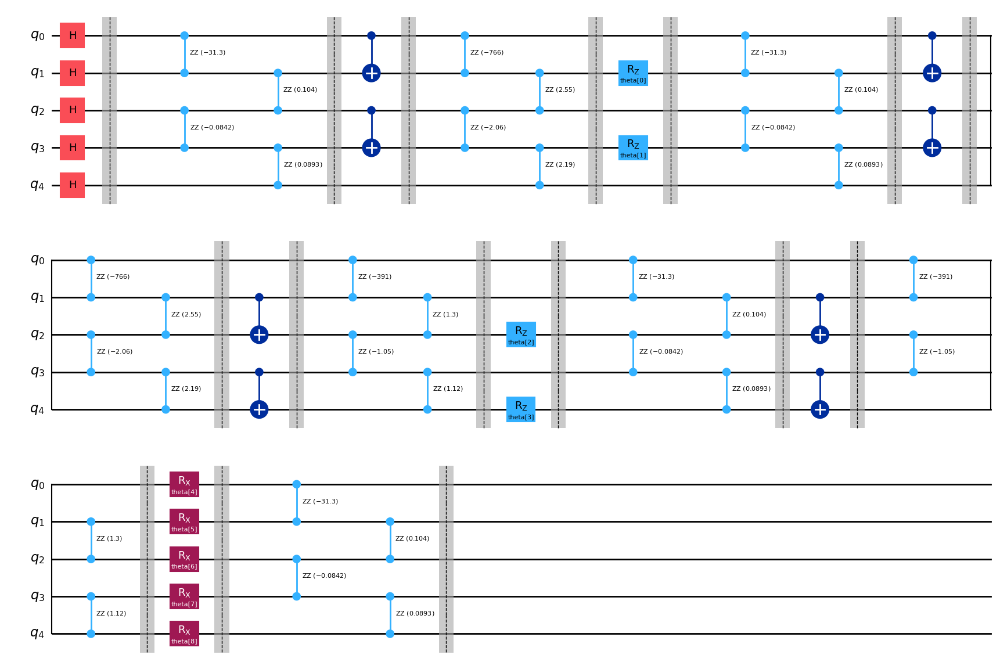

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

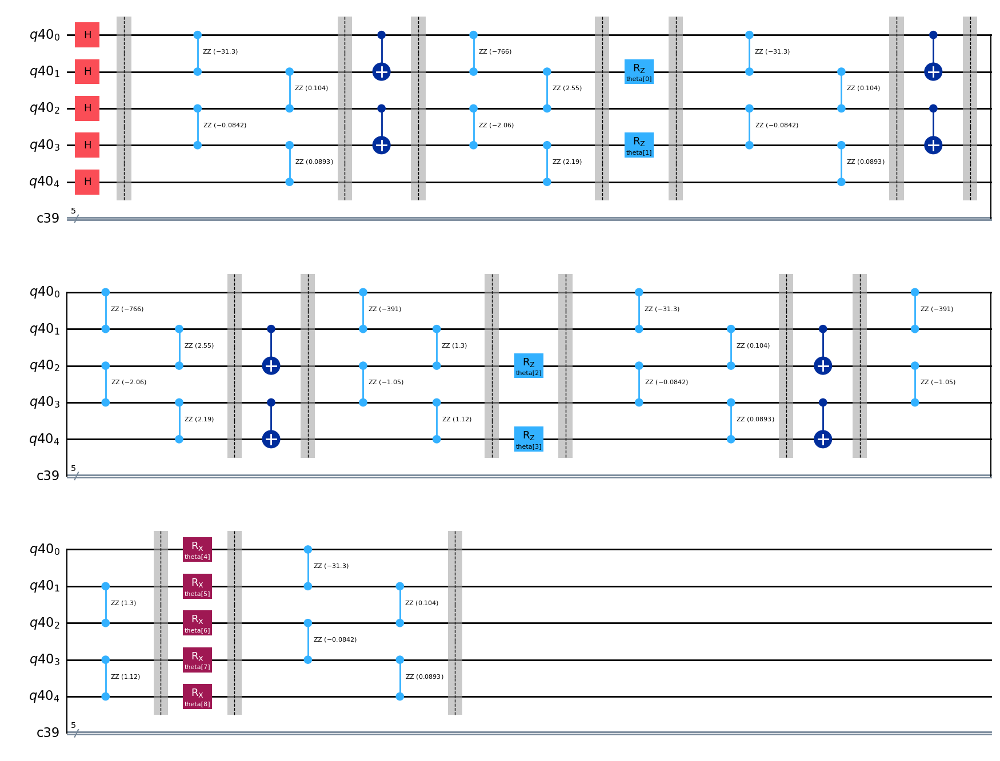

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

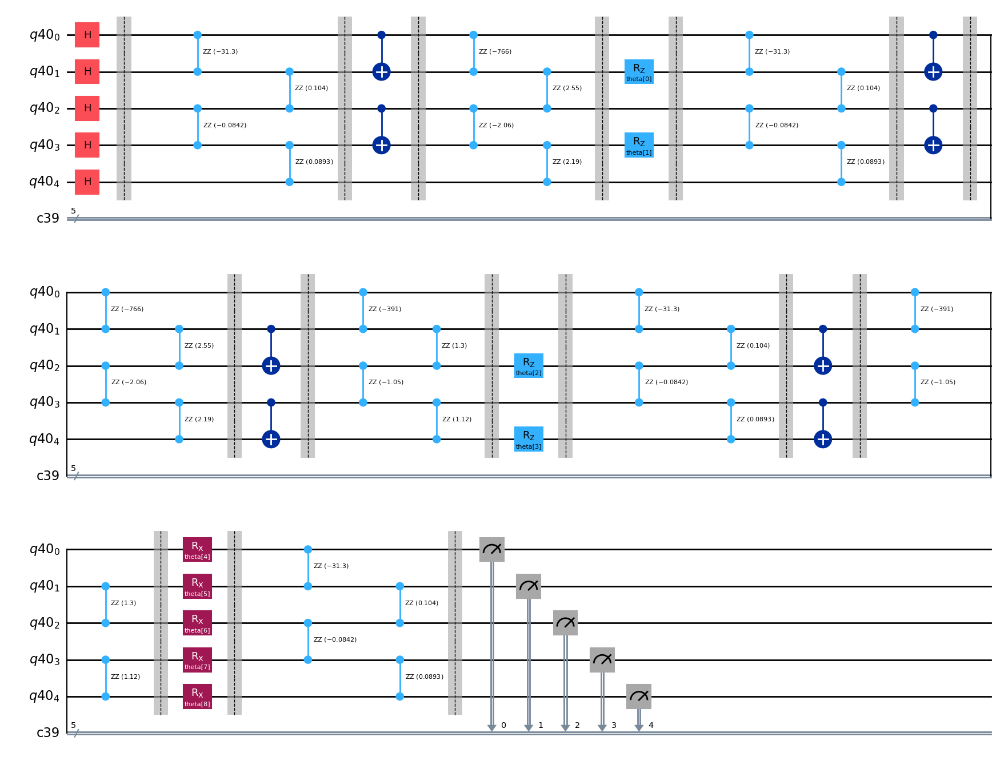

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

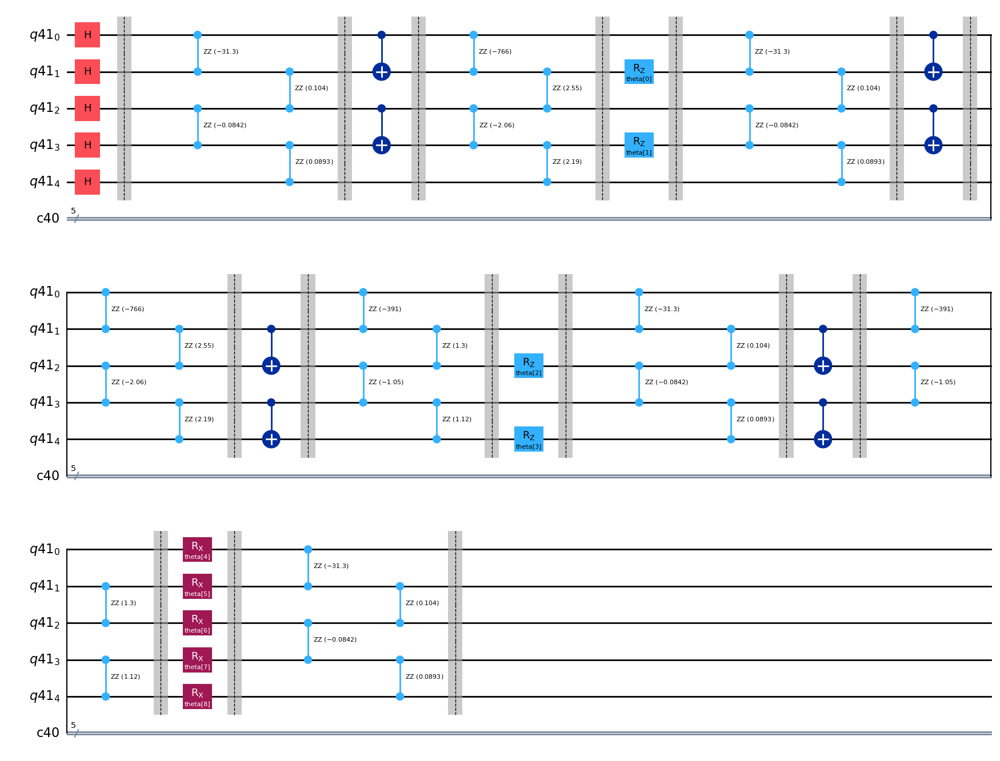

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

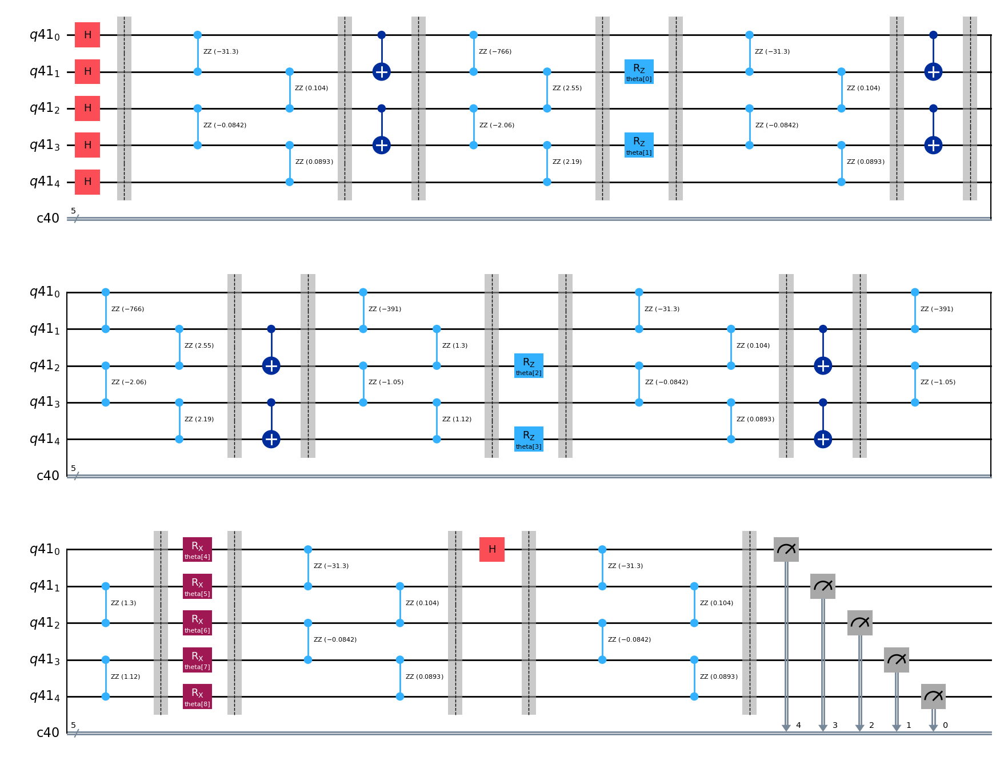

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

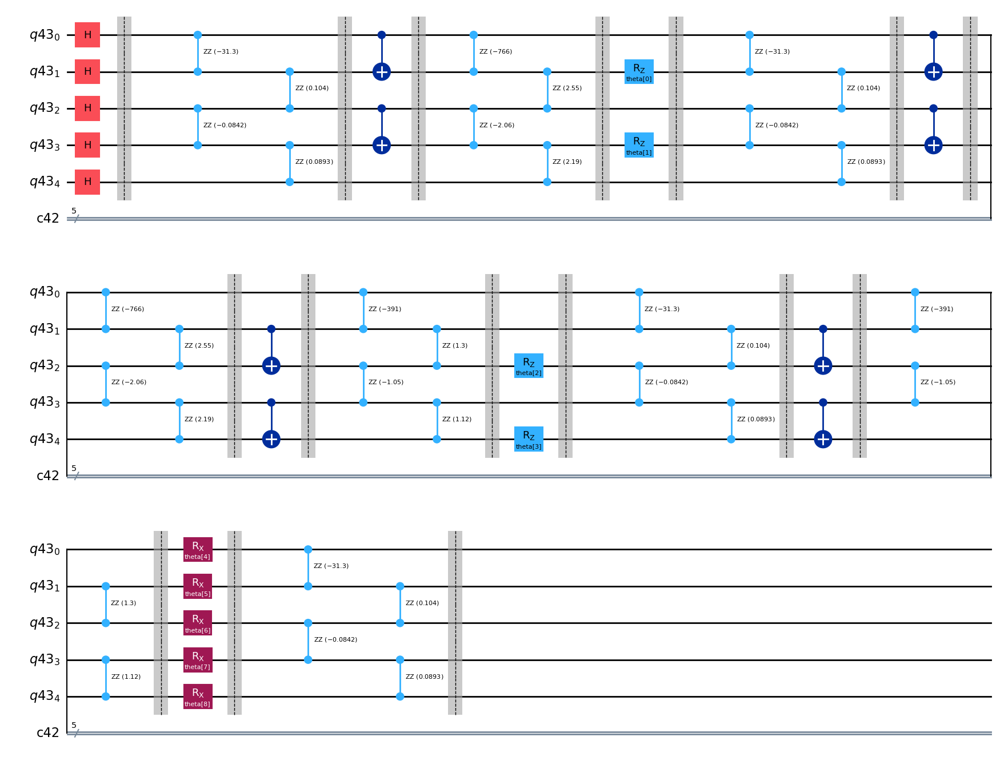

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

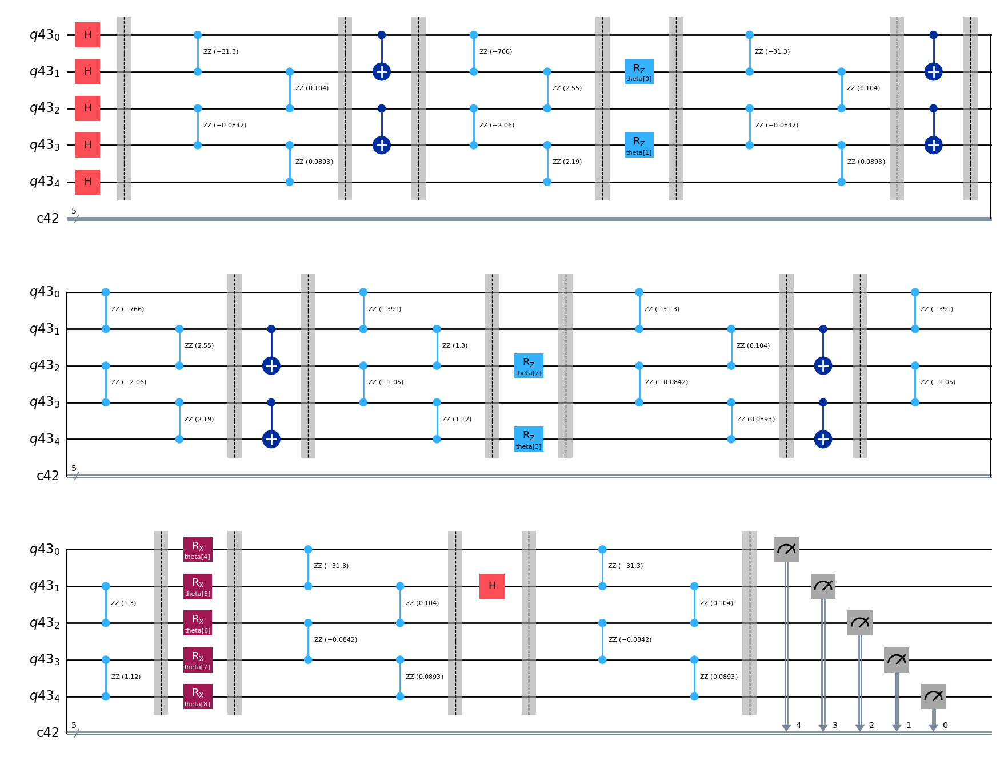

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

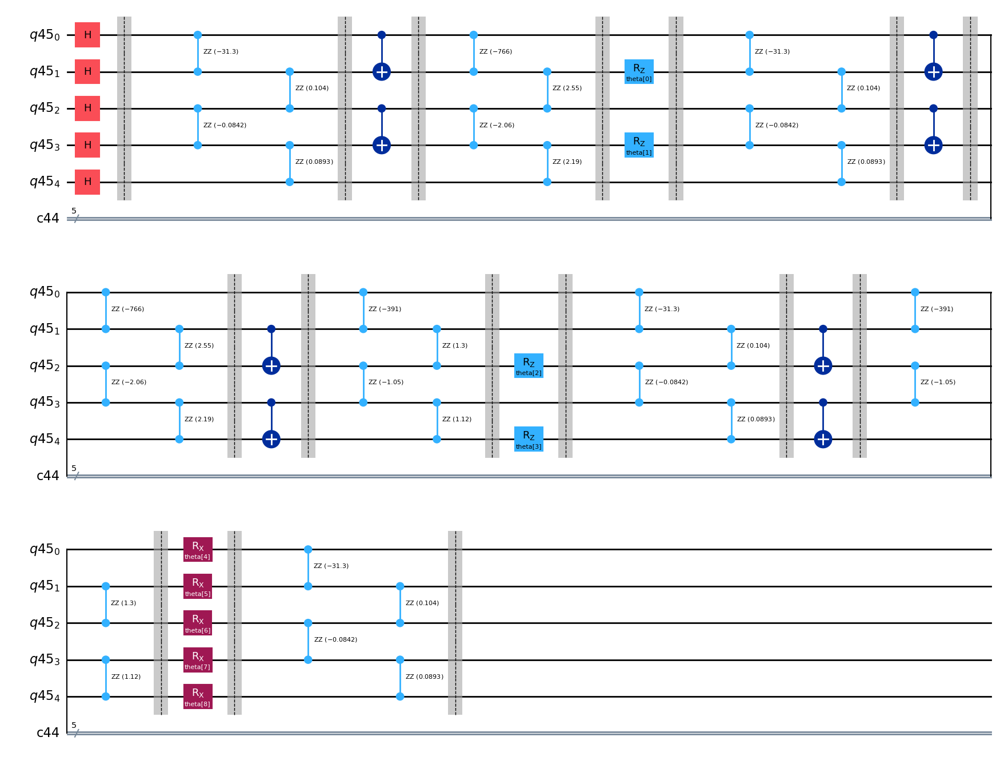

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

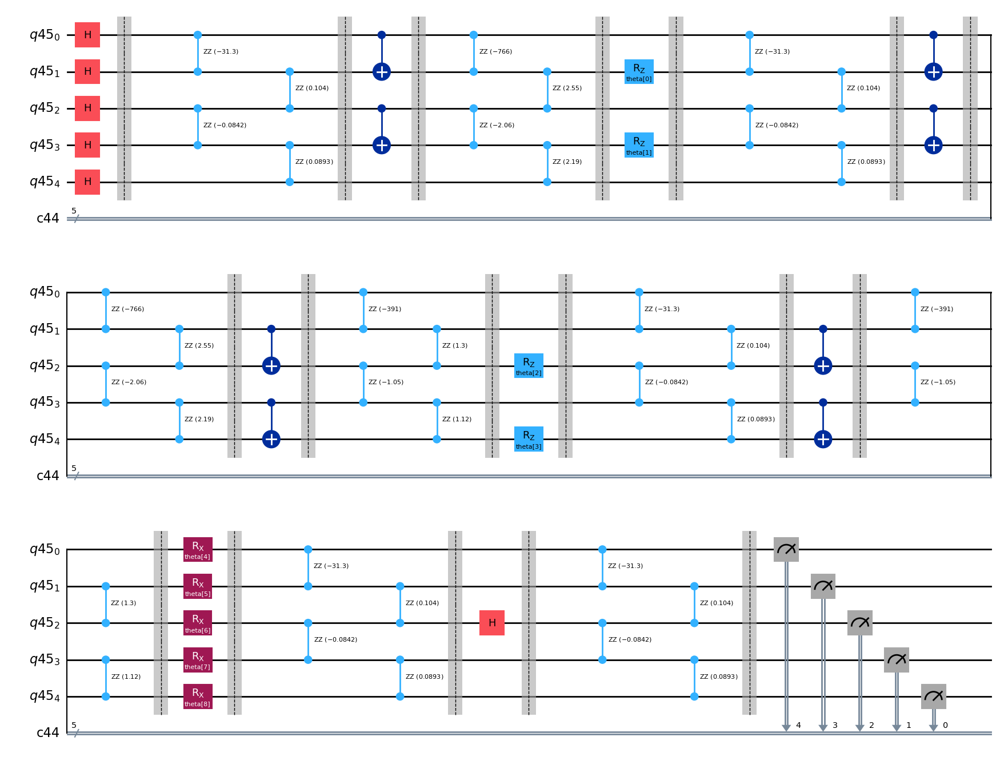

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

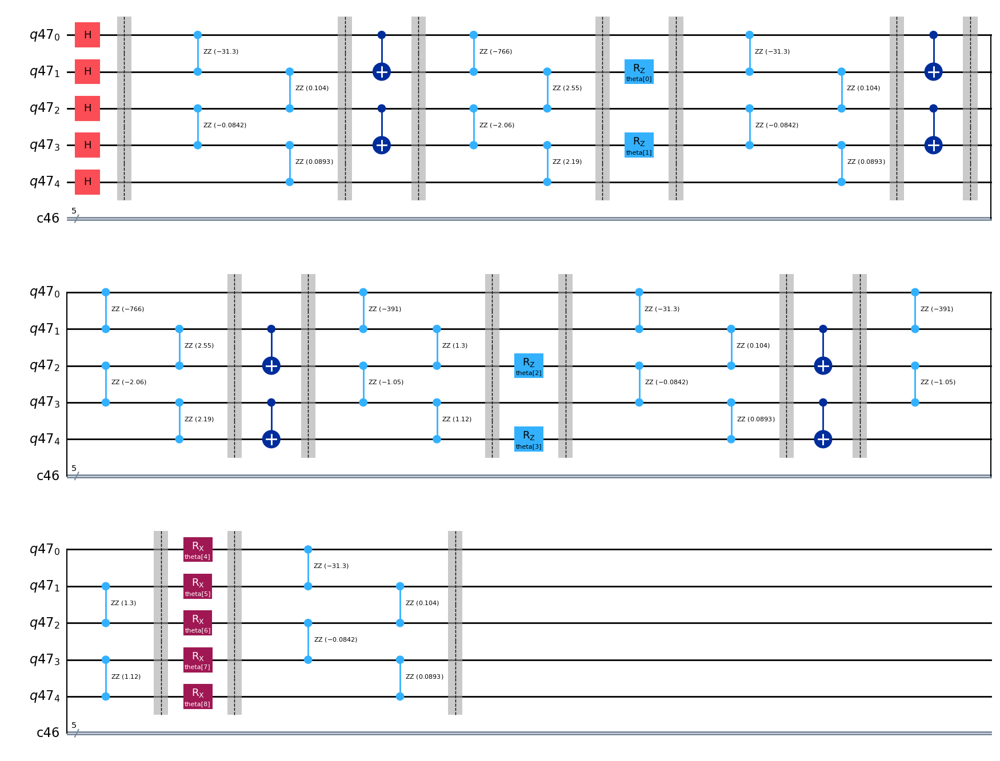

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

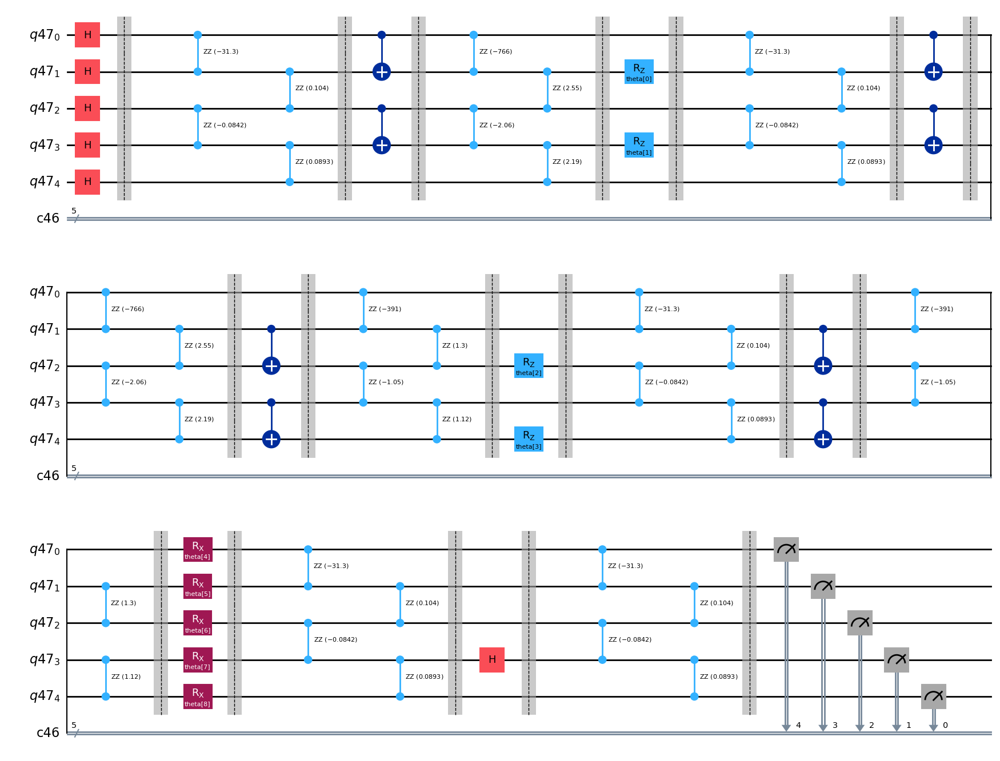

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

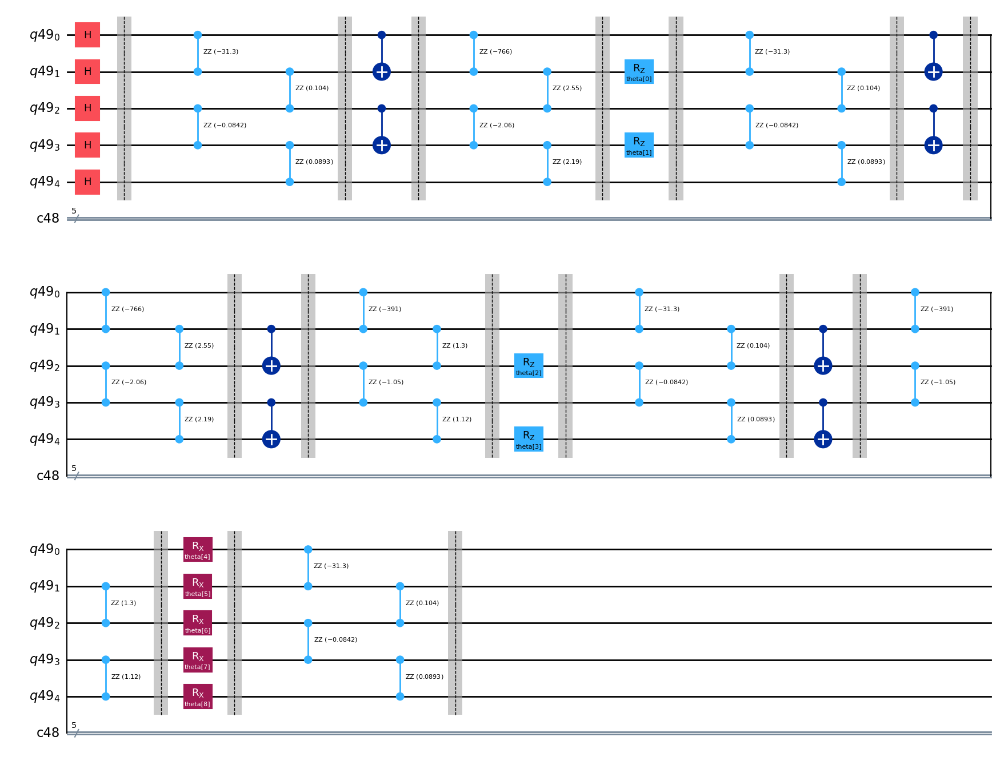

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

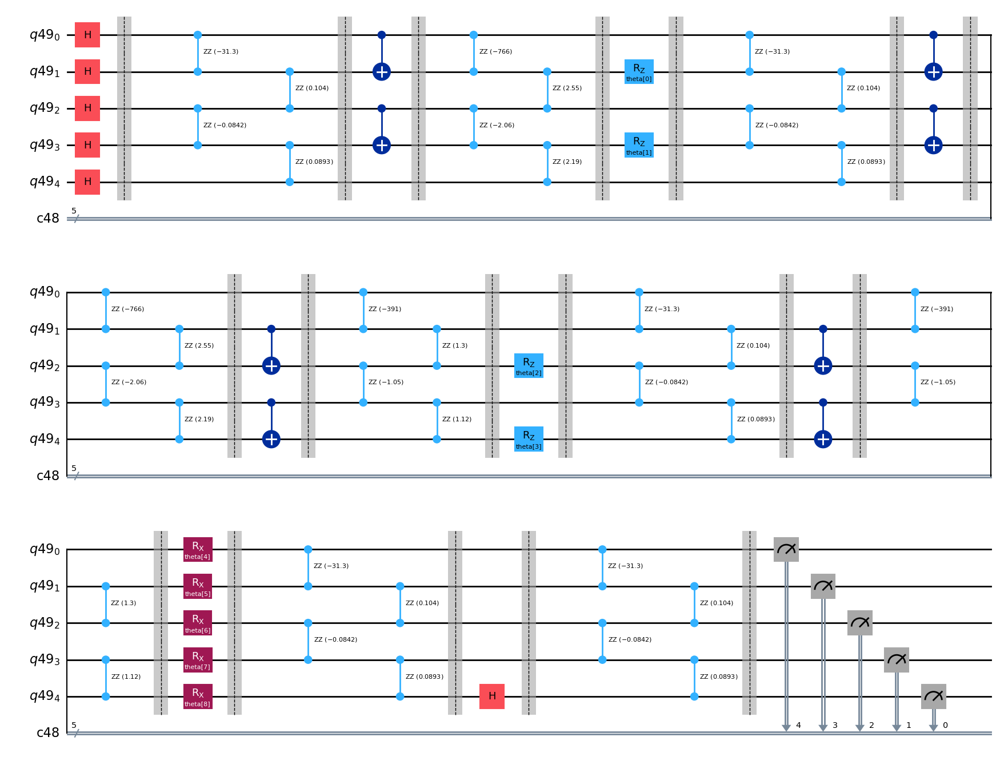

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-3.3477999999999986
-2.4491999999999994
-2.8306
-3.3268000000000004
-2.7720000000000002
-2.6895999999999995
-2.5340000000000003
-2.6754
-3.1887999999999996
-3.3278
-2.7048000000000005
-2.9334
-3.3622
-2.6976000000000004
-2.7255999999999996
-2.528800000000001
-2.9852000000000003
-2.874999999999999
-2.8317999999999994
-3.335599999999999


In [ ]:
lowest_energy_vqe

-3.3622

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3477999999999986
-2.4491999999999994
-2.8306
-3.3268000000000004
-2.7720000000000002
-2.6895999999999995
-2.5340000000000003
-2.6754
-3.1887999999999996
-3.3278
-2.7048000000000005
-2.9334
-3.3622
-2.6976000000000004
-2.7255999999999996
-2.528800000000001
-2.9852000000000003
-2.874999999999999
-2.8317999999999994
-3.335599999999999
Optimization terminated successfully.
         Current function value: -4.807825
         Iterations: 28
         Function evaluations: 224
         Gradient evaluations: 32
Optimization terminated successfully.
         Current function value: -4.795530
         Iterations: 49
         Function evaluations: 406
         Gradient evaluations: 58


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 43
         Function evaluations: 1232
         Gradient evaluations: 176


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overfl

         Current function value: nan
         Iterations: 45
         Function evaluations: 1099
         Gradient evaluations: 157


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overfl

         Current function value: nan
         Iterations: 58
         Function evaluations: 1281
         Gradient evaluations: 183


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.370363
         Iterations: 268
         Function evaluations: 2569
         Gradient evaluations: 367


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 43
         Function evaluations: 1099
         Gradient evaluations: 157


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overfl

         Current function value: nan
         Iterations: 43
         Function evaluations: 1113
         Gradient evaluations: 159


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-164-942dbc8389c9>:86: RuntimeWarning: overflo

         Current function value: nan
         Iterations: 42
         Function evaluations: 1099
         Gradient evaluations: 157


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-164-942dbc8389c9>:86: RuntimeWarning: overflo

         Current function value: nan
         Iterations: 42
         Function evaluations: 1085
         Gradient evaluations: 155
Optimization terminated successfully.
         Current function value: -5.370361
         Iterations: 270
         Function evaluations: 2604
         Gradient evaluations: 372
Optimization terminated successfully.
         Current function value: -5.030108
         Iterations: 32
         Function evaluations: 238
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: -4.030266
         Iterations: 56
         Function evaluations: 581
         Gradient evaluations: 83


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-164-942dbc8389c9>:86: RuntimeWarning: overflo

         Current function value: nan
         Iterations: 44
         Function evaluations: 1099
         Gradient evaluations: 157


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.370362
         Iterations: 250
         Function evaluations: 2987
         Gradient evaluations: 425


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 47
         Function evaluations: 1113
         Gradient evaluations: 159


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-164-942dbc8389c9>:86: RuntimeWarning: overflo

         Current function value: nan
         Iterations: 44
         Function evaluations: 1092
         Gradient evaluations: 156


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overfl

         Current function value: nan
         Iterations: 40
         Function evaluations: 1078
         Gradient evaluations: 154
Optimization terminated successfully.
         Current function value: -3.641488
         Iterations: 44
         Function evaluations: 364
         Gradient evaluations: 52


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-164-942dbc8389c9>:103: RuntimeWarning: overfl

         Current function value: nan
         Iterations: 62
         Function evaluations: 1309
         Gradient evaluations: 187


<ipython-input-161-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expv

In [ ]:
lowest_energy_vqnhe

-5.370362679443209

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3477999999999986
-2.4491999999999994
-2.8306
-3.3268000000000004
-2.7720000000000002
-2.6895999999999995
-2.5340000000000003
-2.6754
-3.1887999999999996
-3.3278
-2.7048000000000005
-2.9334
-3.3622
-2.6976000000000004
-2.7255999999999996
-2.528800000000001
-2.9852000000000003
-2.874999999999999
-2.8317999999999994
-3.335599999999999
Optimization terminated successfully.
         Current function value: -4.984918
         Iterations: 97
         Function evaluations: 4928
         Gradient evaluations: 154


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.556351
         Iterations: 262
         Function evaluations: 13452
         Gradient evaluations: 420


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.111506
         Iterations: 113
         Function evaluations: 6124
         Gradient evaluations: 191
Optimization terminated successfully.
         Current function value: -5.103953
         Iterations: 96
         Function evaluations: 3744
         Gradient evaluations: 117


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.975969
         Iterations: 183
         Function evaluations: 10762
         Gradient evaluations: 336


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.094292
         Iterations: 63
         Function evaluations: 2752
         Gradient evaluations: 86


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.589288
         Iterations: 200
         Function evaluations: 10240
         Gradient evaluations: 320


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.881789
         Iterations: 17
         Function evaluations: 3242
         Gradient evaluations: 101


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.010767
         Iterations: 300
         Function evaluations: 14560
         Gradient evaluations: 455


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.959430
         Iterations: 133
         Function evaluations: 7945
         Gradient evaluations: 248


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.122095
         Iterations: 52
         Function evaluations: 4716
         Gradient evaluations: 147


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.431218
         Iterations: 90
         Function evaluations: 7082
         Gradient evaluations: 221
Optimization terminated successfully.
         Current function value: -5.120373
         Iterations: 68
         Function evaluations: 3552
         Gradient evaluations: 111


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.014211
         Iterations: 80
         Function evaluations: 4547
         Gradient evaluations: 142


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.112018
         Iterations: 75
         Function evaluations: 4300
         Gradient evaluations: 134


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.062540
         Iterations: 65
         Function evaluations: 4042
         Gradient evaluations: 126


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.914777
         Iterations: 300
         Function evaluations: 14080
         Gradient evaluations: 440


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.919676
         Iterations: 55
         Function evaluations: 4428
         Gradient evaluations: 138


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.995578
         Iterations: 102
         Function evaluations: 4576
         Gradient evaluations: 143
         Current function value: -5.398786
         Iterations: 28
         Function evaluations: 3596
         Gradient evaluations: 112


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-7.010766711771723

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3477999999999986
-2.4491999999999994
-2.8306
-3.3268000000000004
-2.7720000000000002
-2.6895999999999995
-2.5340000000000003
-2.6754
-3.1887999999999996
-3.3278
-2.7048000000000005
-2.9334
-3.3622
-2.6976000000000004
-2.7255999999999996
-2.528800000000001
-2.9852000000000003
-2.874999999999999
-2.8317999999999994
-3.335599999999999
Optimization terminated successfully.
         Current function value: -3.507978
         Iterations: 12
         Function evaluations: 1083
         Gradient evaluations: 19


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.708078
         Iterations: 13
         Function evaluations: 4971
         Gradient evaluations: 87


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.727420
         Iterations: 13
         Function evaluations: 5541
         Gradient evaluations: 97


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.792440
         Iterations: 96
         Function evaluations: 10841
         Gradient evaluations: 190


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.756268
         Iterations: 21
         Function evaluations: 5024
         Gradient evaluations: 88


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.112200
         Iterations: 113
         Function evaluations: 8676
         Gradient evaluations: 152


<ipython-input-164-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-164-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 5
         Function evaluations: 7296
         Gradient evaluations: 128


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.112018
         Iterations: 100
         Function evaluations: 12723
         Gradient evaluations: 223


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.964216
         Iterations: 170
         Function evaluations: 19107
         Gradient evaluations: 335


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -6.975969
         Iterations: 195
         Function evaluations: 20646
         Gradient evaluations: 362


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.589287
         Iterations: 196
         Function evaluations: 23085
         Gradient evaluations: 405
Optimization terminated successfully.
         Current function value: -4.985535
         Iterations: 22
         Function evaluations: 2451
         Gradient evaluations: 43


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.096773
         Iterations: 83
         Function evaluations: 8220
         Gradient evaluations: 144


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.811393
         Iterations: 17
         Function evaluations: 5077
         Gradient evaluations: 89


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.763377
         Iterations: 76
         Function evaluations: 13800
         Gradient evaluations: 242


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.080075
         Iterations: 100
         Function evaluations: 11514
         Gradient evaluations: 202
Optimization terminated successfully.
         Current function value: -4.953926
         Iterations: 45
         Function evaluations: 2907
         Gradient evaluations: 51


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.044675
         Iterations: 150
         Function evaluations: 13006
         Gradient evaluations: 228


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.762110
         Iterations: 4
         Function evaluations: 3375
         Gradient evaluations: 59
         Current function value: -4.877719
         Iterations: 13
         Function evaluations: 5826
         Gradient evaluations: 102


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.975969182359601

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3477999999999986
-2.4491999999999994
-2.8306
-3.3268000000000004
-2.7720000000000002
-2.6895999999999995
-2.5340000000000003
-2.6754
-3.1887999999999996
-3.3278
-2.7048000000000005
-2.9334
-3.3622
-2.6976000000000004
-2.7255999999999996
-2.528800000000001
-2.9852000000000003
-2.874999999999999
-2.8317999999999994
-3.335599999999999


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.421009
         Iterations: 66
         Function evaluations: 5156
         Gradient evaluations: 198


<ipython-input-161-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:56: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-164-942dbc8389c9>:82: Runtim

         Current function value: nan
         Iterations: 48
         Function evaluations: 4680
         Gradient evaluations: 180


<ipython-input-164-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-161-1f0d911e14fe>:33: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-164-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-164-942dbc8389c9>:54: RuntimeWa

         Current function value: nan
         Iterations: 76
         Function evaluations: 6656
         Gradient evaluations: 256


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.885971
         Iterations: 12
         Function evaluations: 2066
         Gradient evaluations: 79


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.338252
         Iterations: 112
         Function evaluations: 4940
         Gradient evaluations: 190


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.002500
         Iterations: 56
         Function evaluations: 2870
         Gradient evaluations: 110


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.449217
         Iterations: 192
         Function evaluations: 8431
         Gradient evaluations: 324
Optimization terminated successfully.
         Current function value: -3.396357
         Iterations: 13
         Function evaluations: 364
         Gradient evaluations: 14
Optimization terminated successfully.
         Current function value: -4.398617
         Iterations: 41
         Function evaluations: 1222
         Gradient evaluations: 47


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.361823
         Iterations: 62
         Function evaluations: 3466
         Gradient evaluations: 133


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.440493
         Iterations: 171
         Function evaluations: 7474
         Gradient evaluations: 287


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.850829
         Iterations: 65
         Function evaluations: 2872
         Gradient evaluations: 110


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.338252
         Iterations: 63
         Function evaluations: 2975
         Gradient evaluations: 114
Optimization terminated successfully.
         Current function value: -3.396357
         Iterations: 23
         Function evaluations: 650
         Gradient evaluations: 25
Optimization terminated successfully.
         Current function value: -4.181368
         Iterations: 98
         Function evaluations: 3978
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.371532
         Iterations: 56
         Function evaluations: 4039
         Gradient evaluations: 155
Optimization terminated successfully.
         Current function value: -4.071405
         Iterations: 46
         Function evaluations: 2028
         Gradient evaluations: 78


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.333444
         Iterations: 45
         Function evaluations: 3909
         Gradient evaluations: 150


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.396361
         Iterations: 19
         Function evaluations: 1981
         Gradient evaluations: 76
Optimization terminated successfully.
         Current function value: -4.398851
         Iterations: 169
         Function evaluations: 5798
         Gradient evaluations: 223


In [ ]:
lowest_energy_vqnhe

-4.449216818568643

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-3.3477999999999986
-2.4491999999999994
-2.8306
-3.3268000000000004
-2.7720000000000002
-2.6895999999999995
-2.5340000000000003
-2.6754
-3.1887999999999996
-3.3278
-2.7048000000000005
-2.9334
-3.3622
-2.6976000000000004
-2.7255999999999996
-2.528800000000001
-2.9852000000000003
-2.874999999999999
-2.8317999999999994
-3.335599999999999
Optimization terminated successfully.
         Current function value: -4.361478
         Iterations: 50
         Function evaluations: 4015
         Gradient evaluations: 73


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.039986
         Iterations: 78
         Function evaluations: 7040
         Gradient evaluations: 128


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.039534
         Iterations: 70
         Function evaluations: 11175
         Gradient evaluations: 203
Optimization terminated successfully.
         Current function value: -3.893376
         Iterations: 59
         Function evaluations: 6160
         Gradient evaluations: 112
Optimization terminated successfully.
         Current function value: -3.396358
         Iterations: 22
         Function evaluations: 1265
         Gradient evaluations: 23


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.294038
         Iterations: 50
         Function evaluations: 7049
         Gradient evaluations: 128


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.101882
         Iterations: 40
         Function evaluations: 3135
         Gradient evaluations: 57
Optimization terminated successfully.
         Current function value: -4.299593
         Iterations: 38
         Function evaluations: 3575
         Gradient evaluations: 65
Optimization terminated successfully.
         Current function value: -3.362200
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2
Optimization terminated successfully.
         Current function value: -4.329578
         Iterations: 82
         Function evaluations: 6490
         Gradient evaluations: 118


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.365590
         Iterations: 63
         Function evaluations: 7377
         Gradient evaluations: 134


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.847390
         Iterations: 42
         Function evaluations: 7488
         Gradient evaluations: 136


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.338252
         Iterations: 62
         Function evaluations: 4675
         Gradient evaluations: 85


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.780373
         Iterations: 13
         Function evaluations: 3748
         Gradient evaluations: 68
Optimization terminated successfully.
         Current function value: -3.887735
         Iterations: 81
         Function evaluations: 7040
         Gradient evaluations: 128


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.338497
         Iterations: 51
         Function evaluations: 8315
         Gradient evaluations: 151


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.018825
         Iterations: 25
         Function evaluations: 6717
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.216473
         Iterations: 12
         Function evaluations: 3802
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -3.780825
         Iterations: 12
         Function evaluations: 1155
         Gradient evaluations: 21
Optimization terminated successfully.
         Current function value: -4.132784
         Iterations: 96
         Function evaluations: 8800
         Gradient evaluations: 160


In [ ]:
lowest_energy_vqnhe

-4.365590002055469

## ZZ Crosstalk, Shots = 10000

CUSCO 0 1 2 3 4

J = 8MHz

1. Optimize Parameters in PQC

2. Fix Parameters in PQC and Connect Neural Net Layer, Optimize Parameters in Neural Net

### Ansatz, Hamiltonian, Sampler & Estimator Setting

CUSCO 0 1 2 3 4

J = 8MHz

In [ ]:
# Qubit Number 0,1,2,3,4

J = 0.008                                                   # Unit : GHz
freq = [5.015, 4.956, 4.807, 5.232, 5.138]                  # Unit : GHz
anharm = [-0.30739, -0.30775, -0.31038, -0.30373, -0.3054]  # Unit : GHz

In [ ]:
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister, Parameter
from qiskit.circuit.library import RZZGate
from qiskit.visualization import plot_histogram
from qiskit.quantum_info import SparsePauliOp
from qiskit.circuit import ParameterVector
from qiskit_aer.primitives import Estimator, Sampler

import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Import from Qiskit Aer noise module
from qiskit_aer.noise import (
    NoiseModel,
)

In [ ]:
# Instantiate the system Hamiltonian
interation = 1
bias = -1

coeff_list = [interation for _ in range(4)] + [bias for _ in range(5)]
operator_list = ["ZZIII", "IZZII", "IIZZI", "IIIZZ", "XIIII", "IXIII", "IIXII", "IIIXI", "IIIIX"]
hamiltonian_list = []
for i in range(9):
  hamiltonian_list.append((operator_list[i], coeff_list[i]))
hamiltonian = SparsePauliOp.from_list(hamiltonian_list)

In [ ]:
# ZZ Crosstalk Frequency

H1 = np.array([[freq[0], J], [J, freq[1]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[0]+anharm[0], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[0]+freq[1], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[1]+anharm[1]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_01 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[1], J], [J, freq[2]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[1]+anharm[1], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[1]+freq[2], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[2]+anharm[2]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_12 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[2], J], [J, freq[3]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[2]+anharm[2], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[2]+freq[3], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[3]+anharm[3]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_23 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2


H1 = np.array([[freq[3], J], [J, freq[4]]])
eigenvalue0, eigenvector = np.linalg.eig(H1)
print(eigenvalue0)

H2 = np.array([[2*freq[3]+anharm[3], np.sqrt(2)*J, 0], [np.sqrt(2)*J, freq[3]+freq[4], np.sqrt(2)*J], [0, np.sqrt(2)*J, 2*freq[4]+anharm[4]]])
eigenvalue1, eigenvector = np.linalg.eig(H2)
print(eigenvalue1)

print(eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])
crosstalk_freq_34 = (eigenvalue1[1]-eigenvalue0[0]-eigenvalue0[1])/2

[5.0160655 4.9549345]
[9.97186173 9.72209798 9.60390029]
-0.24890202423038943
[4.9564283 4.8065717]
[9.60344989 9.76407884 9.30334127]
0.0010788403017532033
[4.80684947 5.23215053]
[ 9.30344595 10.03812632 10.16131773]
-0.0008736794511774448
[5.23267599 5.13732401]
[10.37092736 10.1596634   9.97027924]
-0.21033659592271636


In [ ]:
crosstalk_freq_01, crosstalk_freq_12, crosstalk_freq_23, crosstalk_freq_34

(-0.12445101211519471,
 0.0005394201508766017,
 -0.0004368397255887224,
 -0.10516829796135818)

In [ ]:
gate_01 = 460
gate_12 = 460
gate_23 = 940
gate_34 = 460

gate_single = 40

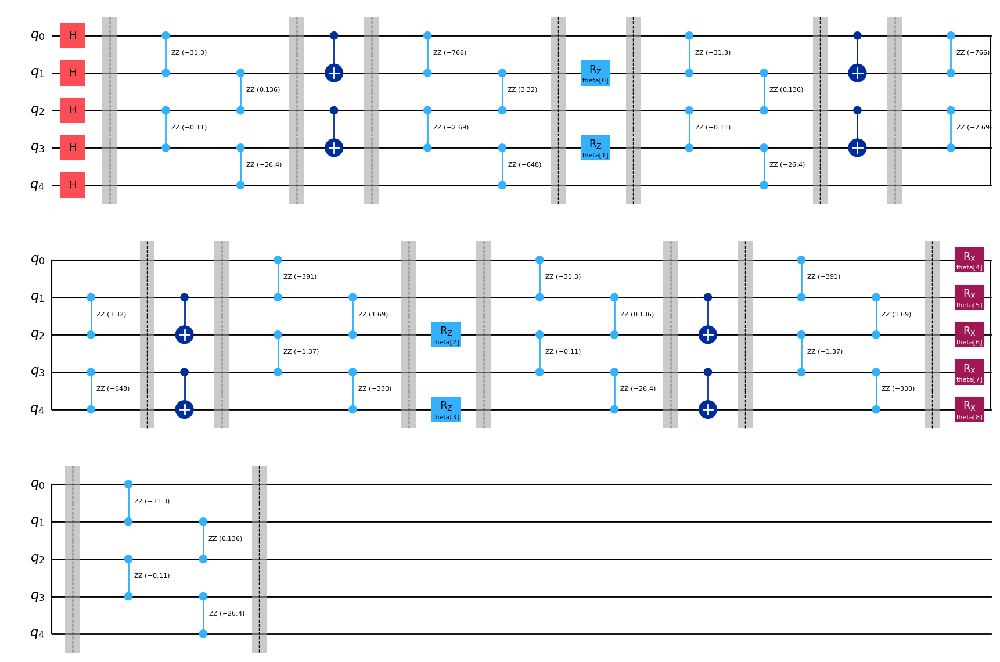

In [ ]:
# Ansatz for VQE

ansatz = QuantumCircuit(5)
params = ParameterVector("theta", length=9)
it = iter(params)

ansatz.h(range(0,5))
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 1)
ansatz.rz(next(it), 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(0, 1)
ansatz.cx(2, 3)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rz(next(it), 2)
ansatz.rz(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.cx(1, 2)
ansatz.cx(3, 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatz.barrier()


ansatz.rx(next(it), 0)
ansatz.rx(next(it), 1)
ansatz.rx(next(it), 2)
ansatz.rx(next(it), 3)
ansatz.rx(next(it), 4)
ansatz.barrier()

ansatz.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz.barrier()


ansatz.draw("mpl")

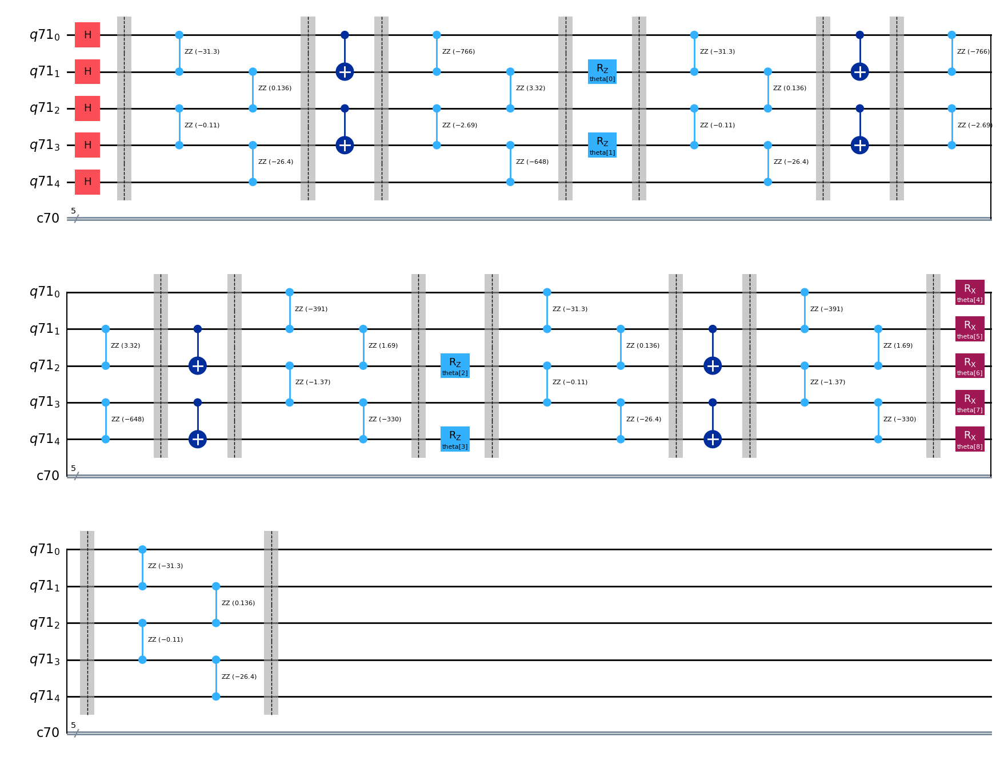

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

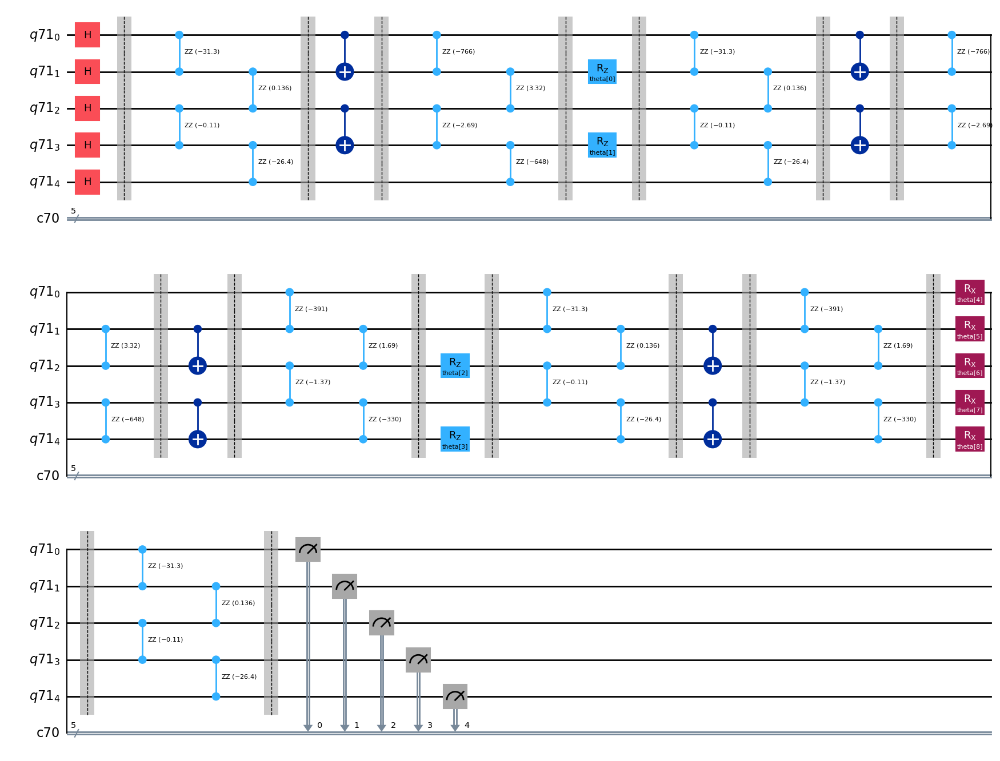

In [ ]:
# Ansatz for VQNHE ZZ Measurement

ansatz_zz = ansatzo

ansatz_zz.measure([0,1,2,3,4], [0,1,2,3,4])

ansatz_zz.draw("mpl")

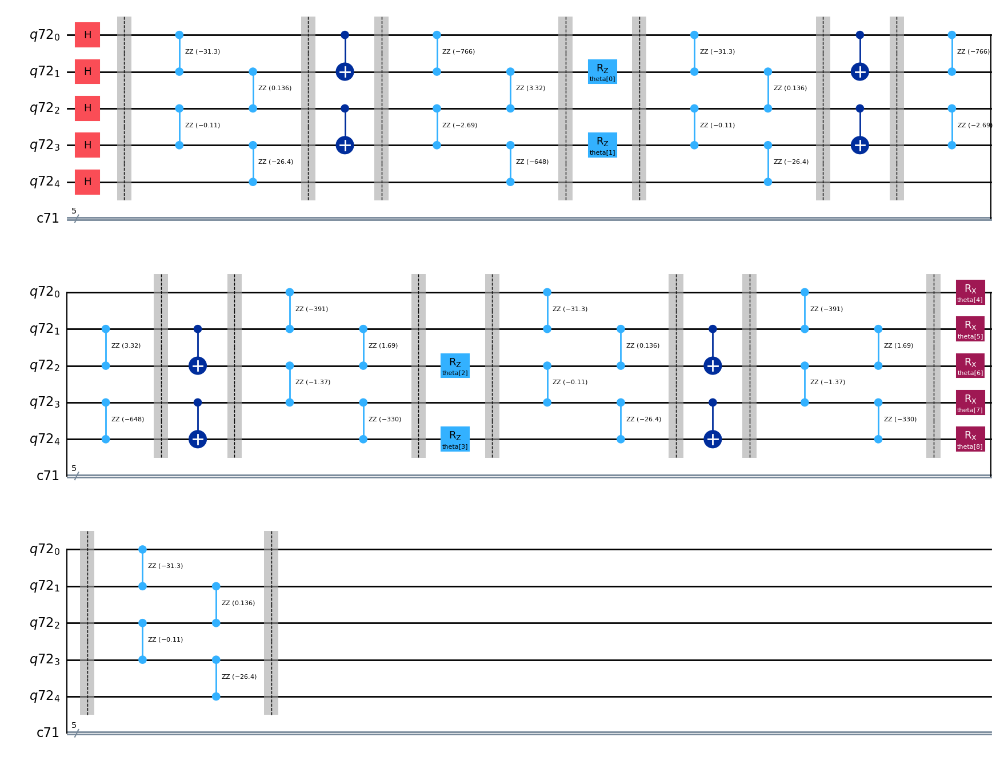

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

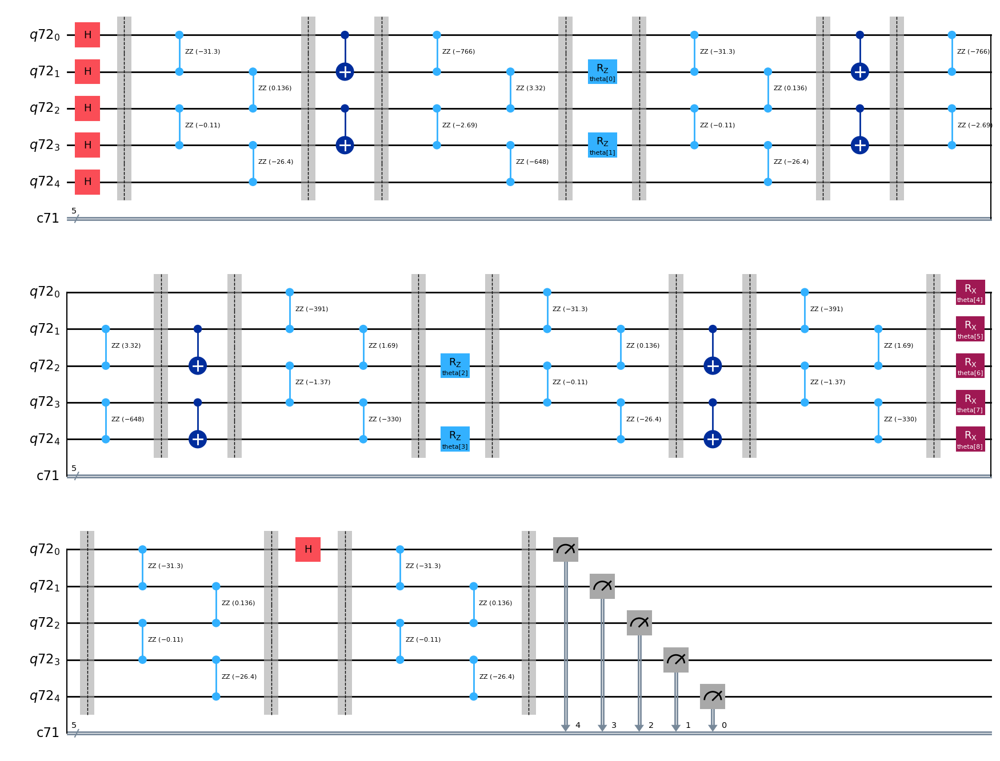

In [ ]:
# Ansatz for VQNHE X0 Measurement

qbit0 = QuantumRegister(5)
cbit0 = ClassicalRegister(5)

ansatz_x0 = ansatzo

ansatz_x0.h(0)
ansatz_x0.barrier()

ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x0.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x0.barrier()

ansatz_x0.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x0.draw("mpl")

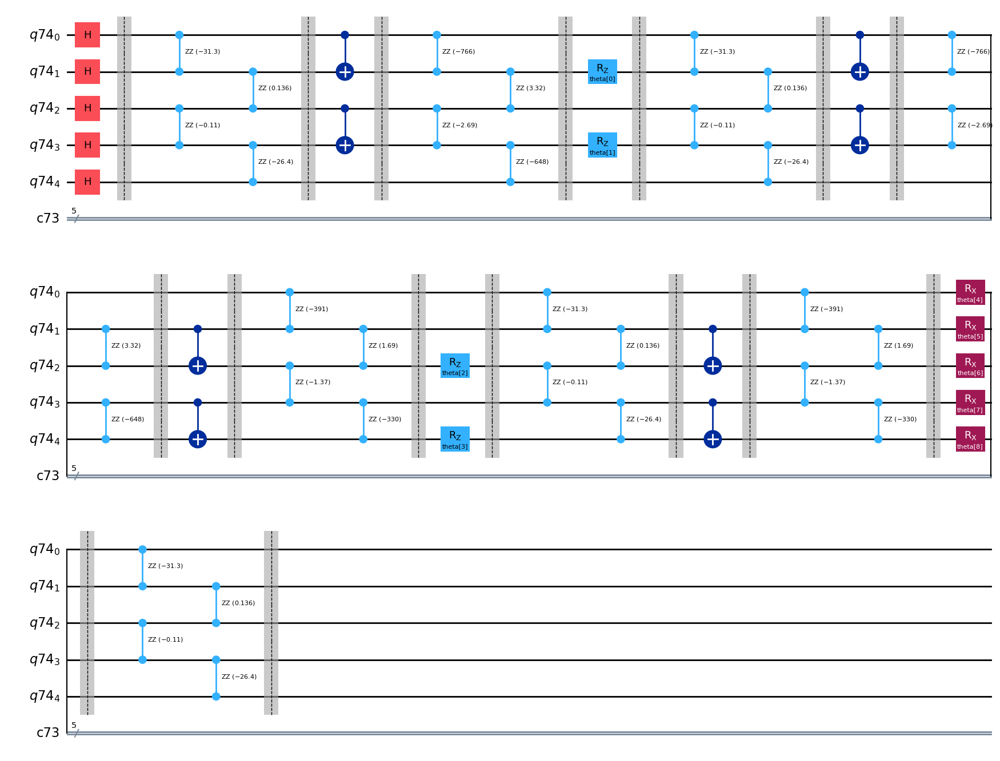

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

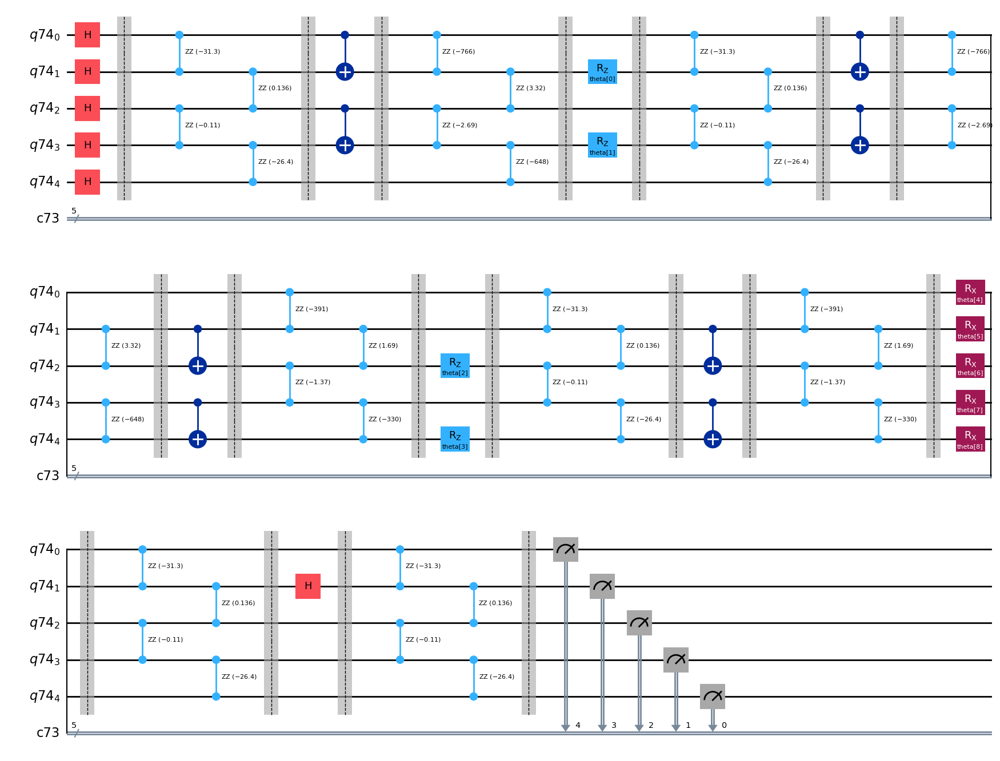

In [ ]:
# Ansatz for VQNHE X1 Measurement

qbit1 = QuantumRegister(5)
cbit1 = ClassicalRegister(5)

ansatz_x1 = ansatzo

ansatz_x1.h(1)
ansatz_x1.barrier()

ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x1.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x1.barrier()

ansatz_x1.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x1.draw("mpl")

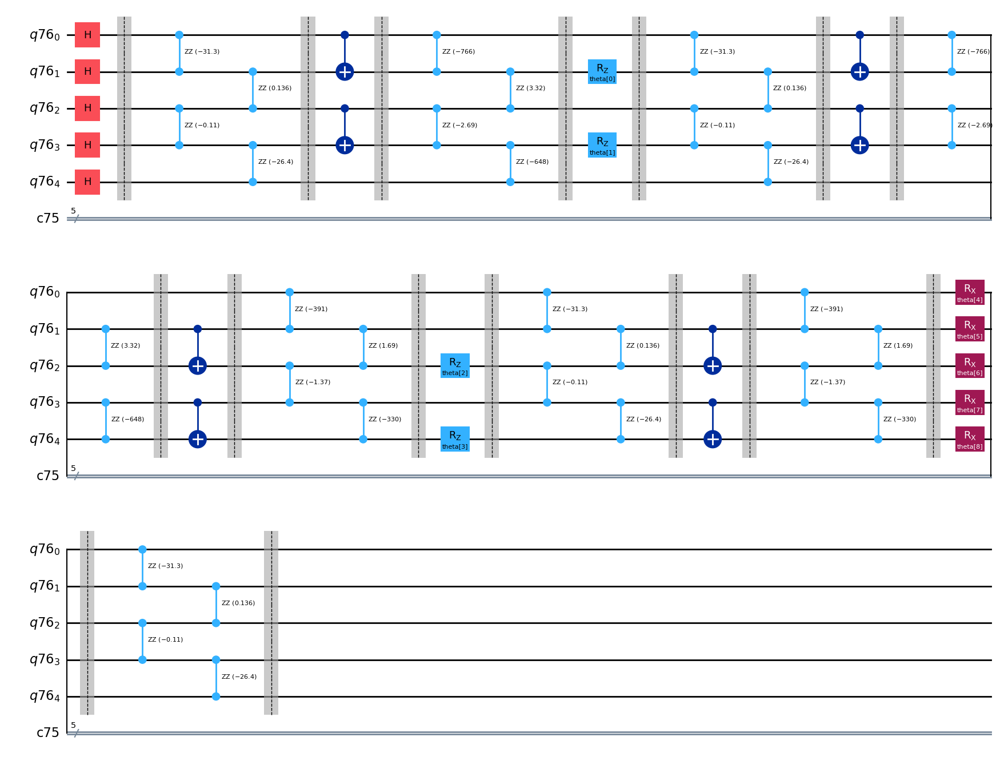

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

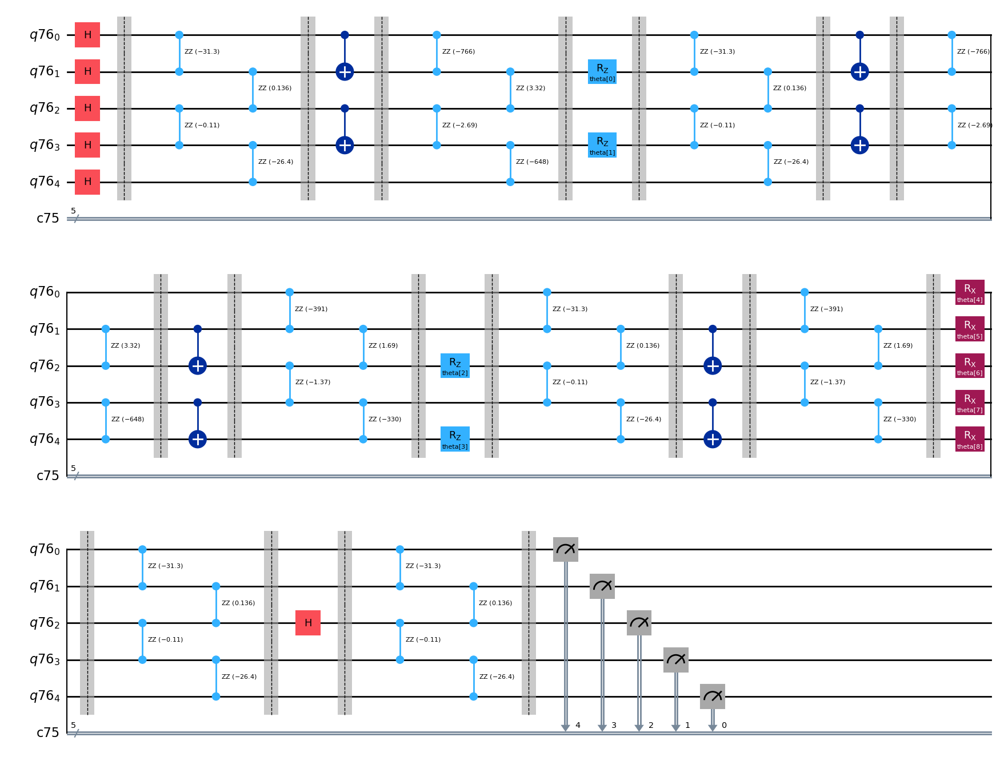

In [ ]:
# Ansatz for VQNHE X2 Measurement

qbit2 = QuantumRegister(5)
cbit2 = ClassicalRegister(5)

ansatz_x2 = ansatzo

ansatz_x2.h(2)
ansatz_x2.barrier()

ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x2.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x2.barrier()

ansatz_x2.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x2.draw("mpl")

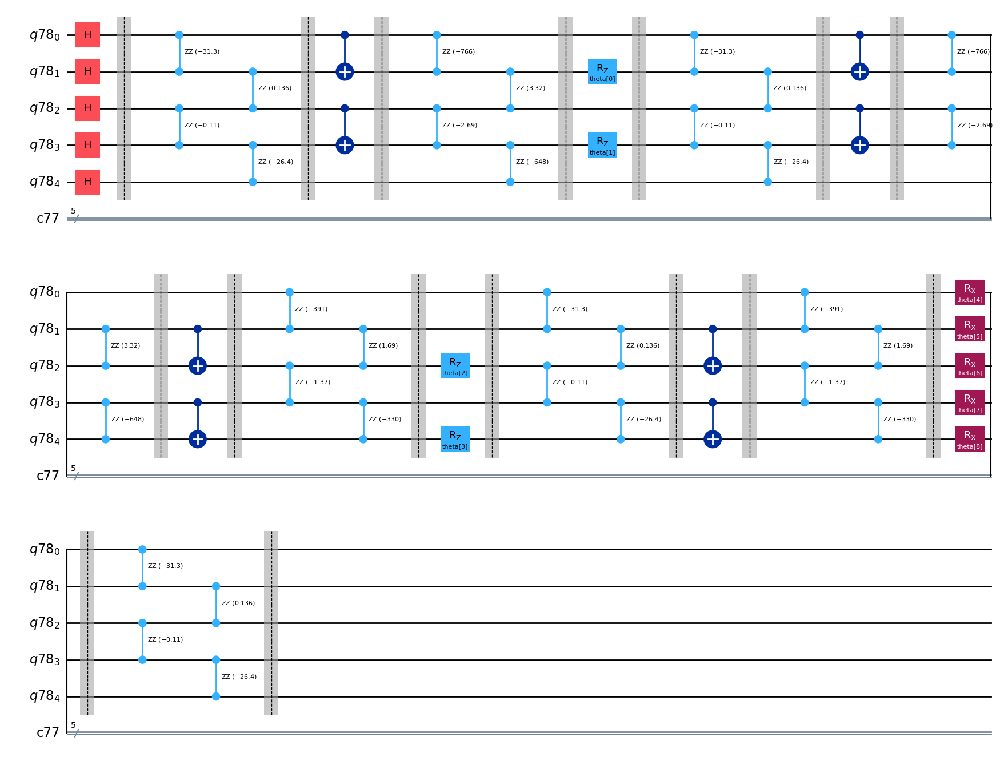

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

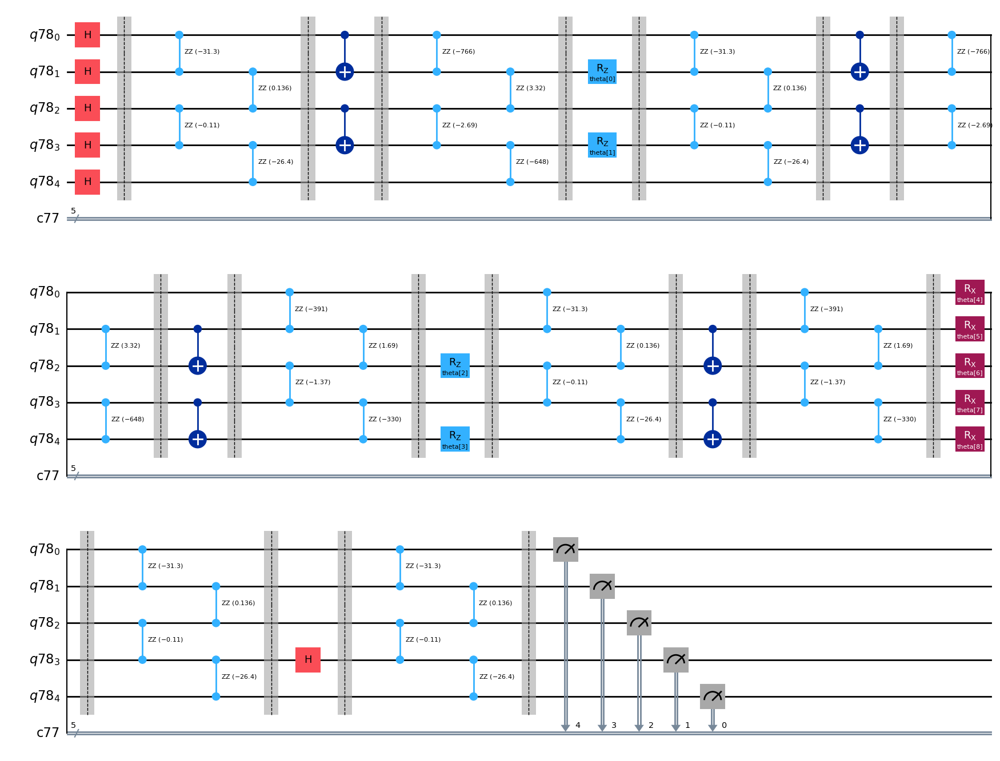

In [ ]:
# Ansatz for VQNHE X3 Measurement

qbit3 = QuantumRegister(5)
cbit3 = ClassicalRegister(5)

ansatz_x3 = ansatzo

ansatz_x3.h(3)
ansatz_x3.barrier()

ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x3.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x3.barrier()

ansatz_x3.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x3.draw("mpl")

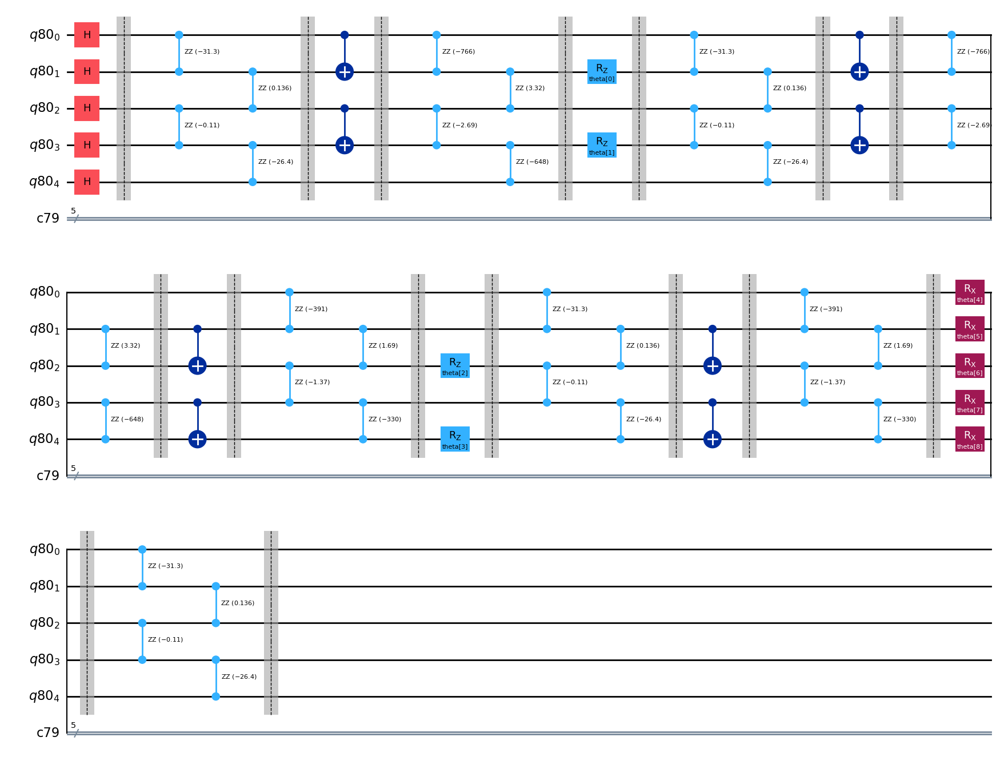

In [ ]:
# Ansatz for VQE

qbit = QuantumRegister(5)
cbit = ClassicalRegister(5)

ansatzo = QuantumCircuit(qbit, cbit)

params = ParameterVector("theta", length=9)
it = iter(params)

ansatzo.h(range(0,5))
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 1)
ansatzo.rz(next(it), 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(0, 1)
ansatzo.cx(2, 3)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_23)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_23)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_23)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_23)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rz(next(it), 2)
ansatzo.rz(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.cx(1, 2)
ansatzo.cx(3, 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single+gate_12)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single+gate_12)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single+gate_12)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single+gate_12)), [3,4])
ansatzo.barrier()


ansatzo.rx(next(it), 0)
ansatzo.rx(next(it), 1)
ansatzo.rx(next(it), 2)
ansatzo.rx(next(it), 3)
ansatzo.rx(next(it), 4)
ansatzo.barrier()

ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatzo.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatzo.barrier()


ansatzo.draw("mpl")

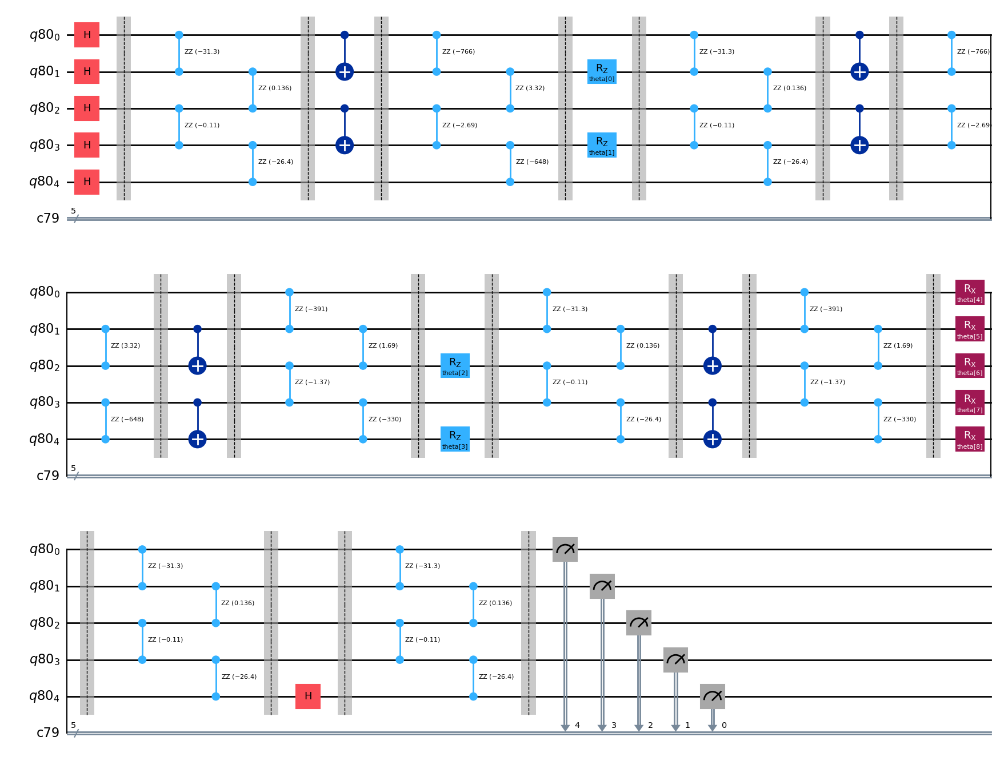

In [ ]:
# Ansatz for VQNHE X4 Measurement

qbit4 = QuantumRegister(5)
cbit4 = ClassicalRegister(5)

ansatz_x4 = ansatzo

ansatz_x4.h(4)
ansatz_x4.barrier()

ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_01*(gate_single)), [0,1])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_23*(gate_single)), [2,3])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_12*(gate_single)), [1,2])
ansatz_x4.append(RZZGate(2*np.pi*crosstalk_freq_34*(gate_single)), [3,4])
ansatz_x4.barrier()

ansatz_x4.measure([0,1,2,3,4], [4,3,2,1,0])

ansatz_x4.draw("mpl")

### Cost Function for VQE & VQNHE

In [ ]:
# Activation Function for Neural Network

def relu(x):
  return np.maximum(0, x)


def output_activate(c, x):
  return np.exp(c*np.tanh(x))


# Convert Decimal Number to Binary Number

def d2b(x):

  binary = []

  for _ in range(5):
    binary.append(x % 2)
    x = x // 2

  binary.reverse()

  return np.array(binary)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
@cache
def pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8):

  def cost_func_vqe(params, ansatz, hamiltonian, estimator):
    cost = estimator.run(ansatz, hamiltonian, parameter_values=params, shots=10000, seed=1).result()
    return cost.values[0]


  def build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict):
    def callback(current_vector):
      callback_dict_vqe["iters"] += 1
      callback_dict_vqe["prev_vector"] = current_vector
      current_cost_vqe = cost_func_vqe(current_vector, ansatz, hamiltonian, estimator)

      callback_dict_vqe["cost_history"].append(current_cost_vqe)

      print(
        "Iters. done: {} [Current cost: {}]".format(callback_dict_vqe["iters"], current_cost_vqe),
        end="\r",
        flush=True,
      )

    return callback


  x_pqc_0 = np.array([x0,x1,x2,x3,x4,x5,x6,x7,x8])

  callback_dict_vqe = {
    "prev_vector": None,
    "iters": 0,
    "cost_history": [],
  }

  options = dict()
  options["maxiter"] = 50000
  options["disp"] = True

  callback_vqe = build_callback_vqe(ansatz, hamiltonian, estimator, callback_dict_vqe)
  res = minimize(
    cost_func_vqe,
    x_pqc_0,
    args=(ansatz, hamiltonian, estimator),
    method="cobyla",
    callback=callback_vqe,
    options=options
  )

  params_pqc = res.x

  return params_pqc

In [ ]:
@cache
def prob_string_zz(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_zz, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x0(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x0, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x1(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x1, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x2(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x2, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x3(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x3, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string


@cache
def prob_string_x4(x0,x1,x2,x3,x4,x5,x6,x7,x8):
  params_pqc = pqc_params(x0,x1,x2,x3,x4,x5,x6,x7,x8)
  job = sampler.run(ansatz_x4, params_pqc, shots=10000, seed=1).result()
  prob_string = job.quasi_dists[0]

  for i in range(32):
   if not (i in prob_string):  prob_string[i] = 0

  return prob_string

In [ ]:
def Z0Z1(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 8 == 0 or k // 8 == 3:
      expval = expval + prob_string[k]*nnval[k]
    if k // 8 == 1 or k // 8 == 2:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z1Z2(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k // 4 == 0 or k // 4 == 3 or k // 4 == 4 or k // 4 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k // 4 == 1 or k // 4 == 2 or k // 4 == 5 or k // 4 == 6:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z2Z3(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 8 == 0 or k % 8 == 1 or k % 8 == 6 or k % 8 == 7:
      expval = expval + prob_string[k]*nnval[k]
    if k % 8 == 2 or k % 8 == 3 or k % 8 == 4 or k % 8 == 5:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def Z3Z4(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    if k % 4 == 0 or k % 4 == 3:
      expval = expval + prob_string[k]*nnval[k]
    else:
      expval = expval - prob_string[k]*nnval[k]

  return expval


def X0(params_nn, x_pqc_0):
  prob_string = prob_string_x0(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(16):
    delt = prob_string[k] - prob_string[k+16]
    expval = expval + delt*nnval[k]*nnval[k+16]

  return expval


def X1(params_nn, x_pqc_0):
  prob_string = prob_string_x1(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(8):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  for k in range(16,24,1):
    delt = prob_string[k] - prob_string[k+8]
    expval = expval + delt*nnval[k]*nnval[k+8]

  return expval


def X2(params_nn, x_pqc_0):
  prob_string = prob_string_x2(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(4):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(8,12,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(16,20,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  for k in range(24,28,1):
    delt = prob_string[k] - prob_string[k+4]
    expval = expval + delt*nnval[k]*nnval[k+4]

  return expval


def X3(params_nn, x_pqc_0):
  prob_string = prob_string_x3(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,4):
    expval = expval + (prob_string[k] - prob_string[k+2])*nnval[k]*nnval[k+2]
    expval = expval + (prob_string[k+1] - prob_string[k+3])*nnval[k+1]*nnval[k+3]

  return expval


def X4(params_nn, x_pqc_0):
  prob_string = prob_string_x4(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([neural_net(params_nn, d2b(j)) for j in range(32)])

  expval = 0

  for k in range(0,32,2):
    expval = expval + (prob_string[k] - prob_string[k+1])*nnval[k]*nnval[k+1]

  return expval


def norm(params_nn, x_pqc_0):
  prob_string = prob_string_zz(x_pqc_0[0],x_pqc_0[1],x_pqc_0[2],x_pqc_0[3],x_pqc_0[4],x_pqc_0[5],x_pqc_0[6],x_pqc_0[7],x_pqc_0[8])
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])

  expval = 0

  for k in range(32):
    expval = expval + prob_string[k]*nnval[k]

  return expval

In [ ]:
def cost_func_vqnhe(params_nn, x_pqc_0):
  expval = 0
  expval = expval + Z0Z1(params_nn, x_pqc_0)
  expval = expval + Z1Z2(params_nn, x_pqc_0)
  expval = expval + Z2Z3(params_nn, x_pqc_0)
  expval = expval + Z3Z4(params_nn, x_pqc_0)

  expval = expval - X0(params_nn, x_pqc_0)
  expval = expval - X1(params_nn, x_pqc_0)
  expval = expval - X2(params_nn, x_pqc_0)
  expval = expval - X3(params_nn, x_pqc_0)
  expval = expval - X4(params_nn, x_pqc_0)

  expval = expval / norm(params_nn, x_pqc_0)

  return expval

In [ ]:
def build_callback_vqnhe(x_pqc_0, callback_dict):
  def callback(current_vector):
    callback_dict["iters"] += 1
    callback_dict["prev_vector"] = current_vector
    current_cost = cost_func_vqnhe(current_vector, x_pqc_0)
    callback_dict["cost_history"].append(current_cost)

  return callback

### VQE

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc

-1.6335999999999995
-1.6653999999999995
-1.6675999999999989
-1.8358
-1.888
-1.8958000000000002
-1.8093999999999997
-1.7855999999999999
-1.6440000000000003
-1.5446
-1.8563999999999998
-1.7084000000000004
-1.9310000000000003
-1.7218000000000004
-1.8205999999999998
-1.7707999999999997
-1.7674
-1.7650000000000003
-1.7169999999999992
-1.8618


In [ ]:
lowest_energy_vqe

-1.9310000000000003

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 0개

In [ ]:
# Activation Function for Neural Network

def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:5]
  c = parameter[5]

  FC1 = FC1.reshape(1,5)


  a1 = np.matmul(FC1, x)
  y = output_activate(c, a1)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=6), pqc))
    if cost_func_vqnhe(np.zeros(shape=6), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=6), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(6) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.6335999999999995
-1.6653999999999995
-1.6675999999999989
-1.8358
-1.888
-1.8958000000000002
-1.8093999999999997
-1.7855999999999999
-1.6440000000000003
-1.5446
-1.8563999999999998
-1.7084000000000004
-1.9310000000000003
-1.7218000000000004
-1.8205999999999998
-1.7707999999999997
-1.7674
-1.7650000000000003
-1.7169999999999992
-1.8618


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 40
         Function evaluations: 1085
         Gradient evaluations: 155


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: ove

         Current function value: nan
         Iterations: 35
         Function evaluations: 1050
         Gradient evaluations: 150
Optimization terminated successfully.
         Current function value: -4.650661
         Iterations: 50
         Function evaluations: 469
         Gradient evaluations: 67


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-297-942dbc8389c9>:86: RuntimeWarning: overflo

         Current function value: nan
         Iterations: 33
         Function evaluations: 1022
         Gradient evaluations: 146


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:56: RuntimeWarning: invalid va

         Current function value: nan
         Iterations: 51
         Function evaluations: 1155
         Gradient evaluations: 165
Optimization terminated successfully.
         Current function value: -2.348123
         Iterations: 49
         Function evaluations: 385
         Gradient evaluations: 55


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.964415
         Iterations: 273
         Function evaluations: 2812
         Gradient evaluations: 400
Optimization terminated successfully.
         Current function value: -2.332651
         Iterations: 22
         Function evaluations: 175
         Gradient evaluations: 25


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in 

         Current function value: nan
         Iterations: 37
         Function evaluations: 1071
         Gradient evaluations: 153


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.964413
         Iterations: 261
         Function evaluations: 2721
         Gradient evaluations: 387


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.800575
         Iterations: 78
         Function evaluations: 999
         Gradient evaluations: 141
Optimization terminated successfully.
         Current function value: -7.165250
         Iterations: 58
         Function evaluations: 581
         Gradient evaluations: 83


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in 

         Current function value: nan
         Iterations: 60
         Function evaluations: 1421
         Gradient evaluations: 203


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.964410
         Iterations: 249
         Function evaluations: 2516
         Gradient evaluations: 358


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.964416
         Iterations: 272
         Function evaluations: 2938
         Gradient evaluations: 418


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scala

         Current function value: nan
         Iterations: 34
         Function evaluations: 1029
         Gradient evaluations: 147


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.964412
         Iterations: 242
         Function evaluations: 2401
         Gradient evaluations: 343


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in 

         Current function value: nan
         Iterations: 36
         Function evaluations: 1036
         Gradient evaluations: 148


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: overflow

         Current function value: nan
         Iterations: 35
         Function evaluations: 1050
         Gradient evaluations: 150


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:69: RuntimeWarning: overflow encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: ove

         Current function value: nan
         Iterations: 30
         Function evaluations: 1036
         Gradient evaluations: 148


<ipython-input-294-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:26: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:41: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:54: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-297-942dbc8389c9>:86: RuntimeWa

In [ ]:
lowest_energy_vqnhe

-10.800575499016233

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:30]
  c = parameter[30]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=31), pqc))
    if cost_func_vqnhe(np.zeros(shape=31), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=31), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(31) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.6335999999999995
-1.6653999999999995
-1.6675999999999989
-1.8358
-1.888
-1.8958000000000002
-1.8093999999999997
-1.7855999999999999
-1.6440000000000003
-1.5446
-1.8563999999999998
-1.7084000000000004
-1.9310000000000003
-1.7218000000000004
-1.8205999999999998
-1.7707999999999997
-1.7674
-1.7650000000000003
-1.7169999999999992
-1.8618


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.833759
         Iterations: 96
         Function evaluations: 6720
         Gradient evaluations: 210


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.464340
         Iterations: 209
         Function evaluations: 12684
         Gradient evaluations: 396


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.796958
         Iterations: 292
         Function evaluations: 14380
         Gradient evaluations: 449


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.413309
         Iterations: 247
         Function evaluations: 14120
         Gradient evaluations: 441


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.400440
         Iterations: 38
         Function evaluations: 4295
         Gradient evaluations: 134


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.024635
         Iterations: 32
         Function evaluations: 3368
         Gradient evaluations: 105


<ipython-input-297-942dbc8389c9>:3: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:18: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:33: RuntimeWarning: overflow encountered in scalar power
  nnval = np.array([(neural_net(params_nn, d2b(j)))**2 for j in range(32)])
<ipython-input-297-942dbc8389c9>:39: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:48: RuntimeWarning: overflow encountered in scalar pow

         Current function value: nan
         Iterations: 93
         Function evaluations: 8512
         Gradient evaluations: 266


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.039030
         Iterations: 14
         Function evaluations: 2277
         Gradient evaluations: 71


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.071254
         Iterations: 4
         Function evaluations: 2821
         Gradient evaluations: 88
Optimization terminated successfully.
         Current function value: -9.114077
         Iterations: 105
         Function evaluations: 4480
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.441315
         Iterations: 114
         Function evaluations: 7339
         Gradient evaluations: 229


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.351722
         Iterations: 42
         Function evaluations: 5735
         Gradient evaluations: 179


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.965565
         Iterations: 36
         Function evaluations: 3913
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -8.222521
         Iterations: 47
         Function evaluations: 4235
         Gradient evaluations: 132


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.135993
         Iterations: 84
         Function evaluations: 7274
         Gradient evaluations: 227


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.600755
         Iterations: 96
         Function evaluations: 4864
         Gradient evaluations: 152


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.952233
         Iterations: 43
         Function evaluations: 4485
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.462573
         Iterations: 42
         Function evaluations: 2860
         Gradient evaluations: 89
Optimization terminated successfully.
         Current function value: -4.486238
         Iterations: 70
         Function evaluations: 2912
         Gradient evaluations: 91
         Current function value: -6.537915
         Iterations: 21
         Function evaluations: 4643
         Gradient evaluations: 145


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-12.464340347443871

### VQNHE FC Hidden Layer 2개 + CNN Hidden Layer 0개

In [ ]:
def cnn(a, b, c, x):
  lst = []
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])

  return np.array(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  FC1 = parameter[0:25]
  FC2 = parameter[25:50]
  FC3 = parameter[50:55]
  c = parameter[55]

  FC1 = FC1.reshape(5,5)
  FC2 = FC2.reshape(5,5)
  FC3 = FC3.reshape(1,5)

  a1 = np.matmul(FC1, x)
  z1 = relu(a1)

  a2 = np.matmul(FC2, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC3, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=56), pqc))
    if cost_func_vqnhe(np.zeros(shape=56), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=56), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(56) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.6335999999999995
-1.6653999999999995
-1.6675999999999989
-1.8358
-1.888
-1.8958000000000002
-1.8093999999999997
-1.7855999999999999
-1.6440000000000003
-1.5446
-1.8563999999999998
-1.7084000000000004
-1.9310000000000003
-1.7218000000000004
-1.8205999999999998
-1.7707999999999997
-1.7674
-1.7650000000000003
-1.7169999999999992
-1.8618


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.471075
         Iterations: 66
         Function evaluations: 6054
         Gradient evaluations: 106
Optimization terminated successfully.
         Current function value: -2.193970
         Iterations: 34
         Function evaluations: 2679
         Gradient evaluations: 47


<ipython-input-294-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-297-942dbc8389c9>:9: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:56: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-297-942dbc8389c9>:86: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-297-942dbc8389c9>:103: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+4]
<ipython-input-297-942dbc8389c9>:107: RuntimeWarni

         Current function value: nan
         Iterations: 113
         Function evaluations: 15447
         Gradient evaluations: 271


<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:69: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+16]
<ipython-input-297-942dbc8389c9>:82: RuntimeWarning: invalid value encountered in scalar multiply
  expval = expval + delt*nnval[k]*nnval[k+8]
<ipython-input-294-880feffc952c>:8: RuntimeWarning: overflow encountered in exp
  return np.exp(c*np.tanh(x))
<ipython-input-297-942dbc8389c9>:11: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:24: RuntimeWarning: invalid value encountered in scalar add
  expval = expval + prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:56: RuntimeWarning: invalid value encountered in scalar subtract
  expval = expval - prob_string[k]*nnval[k]
<ipython-input-297-942dbc8389c9>:69: Run

         Current function value: nan
         Iterations: 56
         Function evaluations: 11286
         Gradient evaluations: 198


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.815449
         Iterations: 126
         Function evaluations: 13407
         Gradient evaluations: 235


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.442863
         Iterations: 117
         Function evaluations: 11001
         Gradient evaluations: 193


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.427164
         Iterations: 120
         Function evaluations: 14373
         Gradient evaluations: 252


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.417236
         Iterations: 106
         Function evaluations: 19677
         Gradient evaluations: 345


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.164641
         Iterations: 84
         Function evaluations: 9690
         Gradient evaluations: 170


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.777914
         Iterations: 271
         Function evaluations: 27429
         Gradient evaluations: 481


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -12.423502
         Iterations: 162
         Function evaluations: 16655
         Gradient evaluations: 292


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.166357
         Iterations: 78
         Function evaluations: 13058
         Gradient evaluations: 229


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.380265
         Iterations: 103
         Function evaluations: 8379
         Gradient evaluations: 147


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.524835
         Iterations: 182
         Function evaluations: 38427
         Gradient evaluations: 674


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -9.092207
         Iterations: 144
         Function evaluations: 13521
         Gradient evaluations: 237


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -7.041650
         Iterations: 184
         Function evaluations: 19380
         Gradient evaluations: 340


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.379748
         Iterations: 229
         Function evaluations: 20075
         Gradient evaluations: 352


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -10.696647
         Iterations: 63
         Function evaluations: 7984
         Gradient evaluations: 140
Optimization terminated successfully.
         Current function value: -2.731876
         Iterations: 44
         Function evaluations: 3933
         Gradient evaluations: 69
Optimization terminated successfully.
         Current function value: -4.566560
         Iterations: 154
         Function evaluations: 16530
         Gradient evaluations: 290


In [ ]:
lowest_energy_vqnhe

-12.442862907990937

### VQNHE FC Hidden Layer 0개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:24]
  c = parameter[24]

  FC1 = FC1.reshape(1,6)


  a2 = np.matmul(FC1, z1)
  y = output_activate(c, a2)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=25), pqc))
    if cost_func_vqnhe(np.zeros(shape=25), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=25), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(25) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.6335999999999995
-1.6653999999999995
-1.6675999999999989
-1.8358
-1.888
-1.8958000000000002
-1.8093999999999997
-1.7855999999999999
-1.6440000000000003
-1.5446
-1.8563999999999998
-1.7084000000000004
-1.9310000000000003
-1.7218000000000004
-1.8205999999999998
-1.7707999999999997
-1.7674
-1.7650000000000003
-1.7169999999999992
-1.8618


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.471367
         Iterations: 111
         Function evaluations: 5082
         Gradient evaluations: 195
Optimization terminated successfully.
         Current function value: -4.735828
         Iterations: 66
         Function evaluations: 3172
         Gradient evaluations: 122


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.154971
         Iterations: 29
         Function evaluations: 2998
         Gradient evaluations: 115


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.404556
         Iterations: 44
         Function evaluations: 4770
         Gradient evaluations: 183


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.770809
         Iterations: 47
         Function evaluations: 3123
         Gradient evaluations: 120
Optimization terminated successfully.
         Current function value: -4.160581
         Iterations: 31
         Function evaluations: 1066
         Gradient evaluations: 41


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.764810
         Iterations: 38
         Function evaluations: 3080
         Gradient evaluations: 118
Optimization terminated successfully.
         Current function value: -1.934733
         Iterations: 25
         Function evaluations: 676
         Gradient evaluations: 26
Optimization terminated successfully.
         Current function value: -3.556893
         Iterations: 297
         Function evaluations: 11076
         Gradient evaluations: 426


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -5.685718
         Iterations: 75
         Function evaluations: 4506
         Gradient evaluations: 173


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.220967
         Iterations: 58
         Function evaluations: 3205
         Gradient evaluations: 123
Optimization terminated successfully.
         Current function value: -2.525907
         Iterations: 39
         Function evaluations: 1248
         Gradient evaluations: 48


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.311050
         Iterations: 268
         Function evaluations: 10608
         Gradient evaluations: 408
Optimization terminated successfully.
         Current function value: -1.934733
         Iterations: 16
         Function evaluations: 442
         Gradient evaluations: 17


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.167171
         Iterations: 73
         Function evaluations: 4560
         Gradient evaluations: 175
Optimization terminated successfully.
         Current function value: -4.713767
         Iterations: 90
         Function evaluations: 3614
         Gradient evaluations: 139


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.538810
         Iterations: 32
         Function evaluations: 3645
         Gradient evaluations: 140


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Maximum number of iterations has been exceeded.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.684801
         Iterations: 300
         Function evaluations: 10920
         Gradient evaluations: 420
Optimization terminated successfully.
         Current function value: -2.324979
         Iterations: 16
         Function evaluations: 598
         Gradient evaluations: 23
         Current function value: -6.122648
         Iterations: 78
         Function evaluations: 5861
         Gradient evaluations: 225


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.122647756630685

### VQNHE FC Hidden Layer 1개 + CNN Hidden Layer 1개

In [ ]:
def cnn2(vec, x):
  a = vec[0]
  b = vec[1]

  lst = []
  lst.append(b*x[0])
  lst.append(a*x[0]+b*x[1])
  lst.append(a*x[1]+b*x[2])
  lst.append(a*x[2]+b*x[3])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn3(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]

  lst = []
  lst.append(c*x[0])
  lst.append(b*x[0]+c*x[1])
  lst.append(a*x[0]+b*x[1]+c*x[2])
  lst.append(a*x[1]+b*x[2]+c*x[3])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


def cnn4(vec, x):
  a = vec[0]
  b = vec[1]
  c = vec[2]
  d = vec[3]

  lst = []
  lst.append(d*x[0])
  lst.append(c*x[0]+d*x[1])
  lst.append(b*x[0]+c*x[1]+d*x[2])
  lst.append(a*x[0]+b*x[1]+c*x[2]+d*x[3])
  lst.append(a*x[1]+b*x[2]+c*x[3]+d*x[4])
  lst.append(a*x[2]+b*x[3]+c*x[4])
  lst.append(a*x[3]+b*x[4])
  lst.append(a*x[4])

  lst = np.array(lst)

  return np.max(lst)


# Neural Network
# Output : f(s)

def neural_net(parameter, x):

  a1 = np.array([cnn2(parameter[0:2], x), cnn2(parameter[2:4], x), cnn3(parameter[4:7], x), cnn3(parameter[7:10], x), cnn4(parameter[10:14], x), cnn4(parameter[14:18], x)])
  z1 = relu(a1)

  FC1 = parameter[18:48]
  FC2 = parameter[48:53]
  c = parameter[53]

  FC1 = FC1.reshape(5,6)
  FC2 = FC2.reshape(1,5)


  a2 = np.matmul(FC1, z1)
  z2 = relu(a2)

  a3 = np.matmul(FC2, z2)
  y = output_activate(c, a3)

  return y[0]

In [ ]:
noise_model = NoiseModel()
estimator = Estimator(backend_options={"noise_model": noise_model}, skip_transpilation=True)
sampler = Sampler(backend_options={"noise_model": noise_model}, skip_transpilation=True)


lowest_energy_vqnhe = 0

for k in range(20):
    np.random.seed(k)
    x_pqc_0 = 2*np.pi*np.random.random(9)

    pqc = pqc_params(x_pqc_0[0], x_pqc_0[1], x_pqc_0[2], x_pqc_0[3], x_pqc_0[4], x_pqc_0[5], x_pqc_0[6], x_pqc_0[7], x_pqc_0[8])
    print(cost_func_vqnhe(np.zeros(shape=54), pqc))
    if cost_func_vqnhe(np.zeros(shape=54), pqc) < lowest_energy_vqe:
      lowest_energy_vqe = cost_func_vqnhe(np.zeros(shape=54), pqc)
      optimized_pqc = pqc


for k in range(20, 40, 1):

    callback_dict = {
      "prev_vector": None,
      "iters": 0,
      "cost_history": [],
    }

    np.random.seed(k)
    x0 = 2 * np.random.random(54) - 1

    callback = build_callback_vqnhe(optimized_pqc, callback_dict)

    options = dict()
    options["maxiter"] = 300
    options["disp"] = True

    res = minimize(
      cost_func_vqnhe,
      x0,
      args=(optimized_pqc),
      method="bfgs",
      callback=callback,
      options=options
    )

    local_minimum_dict = callback_dict["cost_history"]

    if len(local_minimum_dict) and local_minimum_dict[-1] < lowest_energy_vqnhe :
      lowest_energy_vqnhe = local_minimum_dict[-1]

-1.6335999999999995
-1.6653999999999995
-1.6675999999999989
-1.8358
-1.888
-1.8958000000000002
-1.8093999999999997
-1.7855999999999999
-1.6440000000000003
-1.5446
-1.8563999999999998
-1.7084000000000004
-1.9310000000000003
-1.7218000000000004
-1.8205999999999998
-1.7707999999999997
-1.7674
-1.7650000000000003
-1.7169999999999992
-1.8618
Optimization terminated successfully.
         Current function value: -4.158688
         Iterations: 9
         Function evaluations: 1265
         Gradient evaluations: 23
Optimization terminated successfully.
         Current function value: -4.205157
         Iterations: 64
         Function evaluations: 8855
         Gradient evaluations: 161
Optimization terminated successfully.
         Current function value: -4.168067
         Iterations: 24
         Function evaluations: 1870
         Gradient evaluations: 34
Optimization terminated successfully.
         Current function value: -2.622698
         Iterations: 56
         Function evaluations: 

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.446378
         Iterations: 111
         Function evaluations: 10615
         Gradient evaluations: 193
Optimization terminated successfully.
         Current function value: -3.483713
         Iterations: 26
         Function evaluations: 2035
         Gradient evaluations: 37
Optimization terminated successfully.
         Current function value: -1.931000
         Iterations: 1
         Function evaluations: 110
         Gradient evaluations: 2


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.430993
         Iterations: 13
         Function evaluations: 5732
         Gradient evaluations: 104


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.166778
         Iterations: 44
         Function evaluations: 4137
         Gradient evaluations: 75


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.084607
         Iterations: 2
         Function evaluations: 4632
         Gradient evaluations: 84


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -4.541845
         Iterations: 45
         Function evaluations: 5892
         Gradient evaluations: 107


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.324197
         Iterations: 8
         Function evaluations: 4461
         Gradient evaluations: 81
Optimization terminated successfully.
         Current function value: -4.128784
         Iterations: 32
         Function evaluations: 2145
         Gradient evaluations: 39
Optimization terminated successfully.
         Current function value: -4.713767
         Iterations: 91
         Function evaluations: 6930
         Gradient evaluations: 126


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -2.590842
         Iterations: 115
         Function evaluations: 11617
         Gradient evaluations: 211
Optimization terminated successfully.
         Current function value: -3.322815
         Iterations: 40
         Function evaluations: 3410
         Gradient evaluations: 62


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


         Current function value: -3.319132
         Iterations: 26
         Function evaluations: 3080
         Gradient evaluations: 56
         Current function value: -6.692892
         Iterations: 81
         Function evaluations: 12717
         Gradient evaluations: 231


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minimize.py:705: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


In [ ]:
lowest_energy_vqnhe

-6.69289224569145

# CNN QEM Plot

## 5. CNN Estimation - Depolarizing Channel

vqe

[-5.831799999999999,
 -5.8191999999999995,
 -5.775000000000001,
 -5.782000000000001,
 -5.7467999999999995,
 -5.742000000000001,
 -5.6944,
 -5.709399999999999,
 -5.684400000000002,
 -5.6546,
 -5.6246,
 -5.4496,
 -5.256800000000002,
 -5.056400000000001,
 -4.8721999999999985,
 -4.706800000000002,
 -4.576600000000001,
 -4.430999999999998,
 -4.254599999999999,
 -4.114799999999999]

vqnhe FC Hidden Layer 0 + CNN Hidden Layer 0

[-5.919691524202059,
 -5.909266681731913,
 -5.871121846295345,
 -5.860512992519139,
 -5.827856166661195,
 -5.8693531158632455,
 -5.803894487338251,
 -5.816255217174009,
 -5.763852070123904,
 -5.7550676097308475,
 -5.720940795044208,
 -5.568578059117119,
 -5.411916222038937,
 -5.284468919589966,
 -5.265287221604532,
 -5.129173554445168,
 -5.077624272045166,
 -5.073424152028077,
 -4.928244187760365,
 -4.911047483324537]

vqnhe FC Hidden Layer 1 + CNN Hidden Layer 0

[-6.016810277150228,
 -5.993445929692607,
 -6.012591815389597,
 -5.959095768598058,
 -5.909027999679842,
 -5.987107360376306,
 -5.917036036455259,
 -5.922397274809012,
 -5.857229761262304,
 -5.841494889534196,
 -5.8105821583220525,
 -5.692370916403381,
 -5.569565571660491,
 -5.406280078842187,
 -5.396340270045532,
 -5.245672828163454,
 -5.192263034610052,
 -5.16313359541295,
 -5.032879195310073,
 -4.978091901266644]

vqnhe FC Hidden Layer 0 + CNN Hidden Layer 1

vqnhe FC Hidden Layer 1 + CNN Hidden Layer 1

[-5.9215692209688084,
 -5.9051113716317625,
 -5.882038846182267,
 -5.88662268294751,
 -5.839374372609238,
 -5.836689658429629,
 -5.808483999142415,
 -5.8287110002385445,
 -5.787439979698193,
 -5.768134065885558,
 -5.727824786531487,
 -5.613545399129404,
 -5.460960445529198,
 -5.318625460239696,
 -5.2174201256509285,
 -5.1133637963997245,
 -5.031851065964,
 -4.981779980345924,
 -4.863445336486164,
 -4.774758869722714]

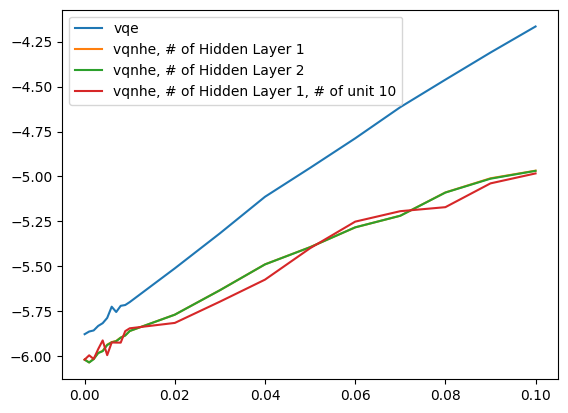

In [ ]:
error_list = [0.001*i for i in range(10)]+[0.01*i for i in range(1,11,1)]

vqe = [-5.876600000000001, -5.8619200000000005, -5.855820000000001, -5.830759999999999, -5.81554, -5.786360000000001, -5.723840000000001, -5.75338, -5.71892, -5.714540000000001, -5.69826, -5.5106, -5.3159800000000015, -5.112719999999999, -4.9521, -4.78792, -4.614680000000001, -4.461779999999999, -4.3110599999999994, -4.16606]
vqnhe_1 = [-6.016802141557301, -6.033668811971606, -6.0126360379539046, -5.981320863910831, -5.969558737051838, -5.934874750042589, -5.920637462798409, -5.914035409603047, -5.895030747146389, -5.883510734777119, -5.8589093314138285, -5.768163382324187, -5.632185221427297, -5.488488523492795, -5.392835794187803, -5.282777008483308, -5.218086763971021, -5.088782119949112, -5.010089066676246, -4.967618445813056]
vqnhe_2 = [-6.0189520440435835, -6.033933976459512, -6.015939855858921, -5.981398538394226, -5.971035006177397, -5.937147888028424, -5.921916205729822, -5.915723425109382, -5.896390190020607, -5.884099549362669, -5.858966473582975, -5.768171830036203, -5.632245711882939, -5.488642324996632, -5.393136248291399, -5.282811913275707, -5.218354733066544, -5.089269, -5.012300, -4.968633]
vqnhe_5 = [-6.012186352896376, -5.990314680426382, -6.012238520592578, -5.94999362014869, -5.911308461056507, -5.987423, -5.91941228330353, -5.9199132081640755, -5.857610311120224, -5.840269378687749, -5.8127171201352414, -5.695483374689246, -5.572004400932811, -5.409658085158476, -5.397080228431743, -5.250284575846735, -5.1916432743864025, -5.169469727175823, -5.034134576221107, -4.971820354328851]
vqnhe_unit10 = [-6.0180292017147865, -5.9940830843595005, -6.014639147707469, -5.9597404015346624, -5.911344187076163, -5.993209559288424, -5.922568836995583, -5.92337036213113, -5.9235631, -5.859724870361055, -5.843946004687859, -5.81398424629551, -5.695758589588917, -5.573372391501268, -5.398764320375726, -5.250990830374524, -5.192855248104412, -5.170575560977388, -5.0383291010529865, -4.982976474792443]


plt.plot(error_list, vqe, label="vqe")
plt.plot(error_list, vqnhe_1, label="vqnhe, # of Hidden Layer 1")
plt.plot(error_list, vqnhe_2, label="vqnhe, # of Hidden Layer 2")
plt.plot(error_list, vqnhe_5, label="vqnhe, # of Hidden Layer 5")
plt.plot(error_list, vqnhe_unit10, label="vqnhe, # of Hidden Layer 1, # of unit 10")
plt.legend()